### CA2 – Strategic Thinking HDip
#### Author: Cristhian Macedo - 2024104
[GitHub Repository](https://github.com/CCT-Dublin/capstone-project-feb-2024-ft-CristhianMacedo2024104)

# 1. Introduction 

This Capstone Project will carry out a case study to understand and use a large dataset with over 2.2 million observations from one of the most popular online retailers around the world Amazon, the dataset used here was last updated in October of 2023, and it will be used to conduct the objects of this project using exploratory data analysis and machine learning to aim increasing company sales.

## 1.1 Objectives

This Capstone Project has a proposal objective to achieve and predict Increasing Company Sales, for this project, it will use the Amazon UK Products dataset by 2023 from the Kaggle website, some of the approaches covered are:

1. Analysing customer ratings with stars obtained from the products to show the best products by category and which niches are the easiest to make sales.
2. Figuring out trending products by category and their sales performance getting an idea of which products have the best sales performance.
3. Present possible recommendations to customers through the best-seller products with higher sales.
4. Train a model to predict and improve sales.
5. Attempt to train a generator of optimised titles with a short product name.

# 2. Data Understanding

## 2.1 Importing Libraries

Starting to import some libraries such as "`pandas and numpy`" to start the project and "`warnings`" to suppress the warnings using a filter of warnings "`warnings.filterwarnings("ignore")`", other libraries will be added at the body of the notebook once needed it with a description.

In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

## 2.2 Loading Data 

Choosing **5000** observations as a sample to use in this project once 2 million is too large and requires plenty of time to run the algorithms, even with 5k it takes approximately 15 minutes to run it all.

In [2]:
num_rows = 5000

Creating a Data Frame named `df` after loading the data set `amz_uk_processed_data.csv` using the command `.read_csv()`

Importing "`Time`" to check the performance in seconds of loading the data set, in this case, spending 4.53 seconds to import all 2 million pieces of information. "The most (time) efficient ways to import CSV data in Python" "How to measure the time-efficiency" (Mihail Yanchev, 2018).

In [3]:
import time

start_time = time.time()
df = pd.read_csv("amz_uk_processed_data.csv")

end_time = time.time()
print("Imported in {:.2f} seconds.".format(end_time - start_time))
%time

Imported in 4.65 seconds.
CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 1.91 µs


### 2.2.1 Data Efficiency 

Next, try to apply some techniques to get a better performance when importing the database, learned on: "Reducing Pandas memory usage #1: lossless compression" (Itamar Turner-Trauring, 2019), also, checking the memory usage of the data in this document "pandas.DataFrame.memory_usage" Return the memory usage of each column in bytes. (The Pandas Development Team, 2024a)

Until here, it is possible to see that the database has **651.1 MB** itself and spends **4.25 seconds** to import using CPU times: user 1 µs, sys: 0 ns, total: 1 µs, Wall time: 1.91 µs and is using **1.1 GB** in the Memory RAM of the computer.

In [4]:
df.info(verbose = False, memory_usage = "deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2222742 entries, 0 to 2222741
Columns: 10 entries, asin to categoryName
dtypes: bool(1), float64(2), int64(2), object(5)
memory usage: 1.1 GB


In [5]:
df.memory_usage(index = False)

asin                 17781936
title                17781936
imgUrl               17781936
productURL           17781936
stars                17781936
reviews              17781936
price                17781936
isBestSeller          2222742
boughtInLastMonth    17781936
categoryName         17781936
dtype: int64

In [6]:
df.memory_usage(index = False, deep = True)

asin                 131141778
title                383496431
imgUrl               246891968
productURL           193378554
stars                 17781936
reviews               17781936
price                 17781936
isBestSeller           2222742
boughtInLastMonth     17781936
categoryName         150056653
dtype: int64

All data, information, and types of features are getting a considerable part of the Memory RAM, in this case, it will try to use smaller dtypes to check if changes the performance, like using:

- int8 can store integers from -128 to 127.
- int16 can store integers from -32768 to 32767.
- int64 can store integers from -9223372036854775808 to 9223372036854775807.

In [7]:
df.dtypes

asin                  object
title                 object
imgUrl                object
productURL            object
stars                float64
reviews                int64
price                float64
isBestSeller            bool
boughtInLastMonth      int64
categoryName          object
dtype: object

After checking the Data Types, created the variable "n_cols" to store all numerical feature names.

In [8]:
n_cols = df.select_dtypes(include = ['number']).columns
n_cols

Index(['stars', 'reviews', 'price', 'boughtInLastMonth'], dtype='object')

Checking the "Memory Usage, Max and Min Value" of each numerical feature, to have an idea wich data type should be used, before it was created one by one, next updated to use a "for loop".

In [9]:
for col, i in zip(n_cols, range(len(n_cols))):
    colunn_name = col
    print(colunn_name, "feature - Memory Usage:", df[colunn_name].memory_usage(index = False, deep = True))
    print(colunn_name, "feature - Max Value:", df[colunn_name].max())
    print(colunn_name, "feature - Min Value:", df[colunn_name].min())
    print("")

stars feature - Memory Usage: 17781936
stars feature - Max Value: 5.0
stars feature - Min Value: 0.0

reviews feature - Memory Usage: 17781936
reviews feature - Max Value: 1356658
reviews feature - Min Value: 0

price feature - Memory Usage: 17781936
price feature - Max Value: 100000.0
price feature - Min Value: 0.0

boughtInLastMonth feature - Memory Usage: 17781936
boughtInLastMonth feature - Max Value: 50000
boughtInLastMonth feature - Min Value: 0



Next, loading the database, once again, but at this time converting the numerical features to "float32 and int32" and checking also the "Data types" on the NumPy Documentation (NumPy Developers, 2024).

In [10]:
start_time = time.time()

df = pd.read_csv("amz_uk_processed_data.csv", 
                 dtype = {"stars" : "float32",
                          "reviews" : "int32",
                          "price" : "float32",
                          "boughtInLastMonth" : "int32"})

print("%s seconds" % (time.time() - start_time))

4.336530923843384 seconds


In [11]:
df.info(verbose = False, memory_usage = "deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2222742 entries, 0 to 2222741
Columns: 10 entries, asin to categoryName
dtypes: bool(1), float32(2), int32(2), object(5)
memory usage: 1.1 GB


In [12]:
df.memory_usage(index = False, deep = True)

asin                 131141778
title                383496431
imgUrl               246891968
productURL           193378554
stars                  8890968
reviews                8890968
price                  8890968
isBestSeller           2222742
boughtInLastMonth      8890968
categoryName         150056653
dtype: int64

Before converting, it was spending **4.25 seconds** to import, and now **4.48** an increased difference of **0.23** thousandths of a second and still using  **1.1 GB** in the Memory RAM of the computer, so it opted to keep the original data types once the difference is not considerable, even some features decreased a few spaces of location in the Memory RAM.

In [13]:
start_time = time.time()

df = pd.read_csv("amz_uk_processed_data.csv", )
                 # nrows = num_rows)

print("%s seconds" % (time.time() - start_time))

4.494341135025024 seconds


## 2.3 Inspecting the Data Set 

Getting the `Head` of the data frame using the command `.head()` and understanding how the first 5 observations were presented as default and the features.

In [14]:
df.head()

,asin,title,imgUrl,productURL,stars,reviews,price,isBestSeller,boughtInLastMonth,categoryName
0,B09B96TG33,"Echo Dot (5th generation, 2022 release) | Big ...",https://m.media-amazon.com/images/I/71C3lbbeLs...,https://www.amazon.co.uk/dp/B09B96TG33,4.7,15308,21.99,False,0,Hi-Fi Speakers
1,B01HTH3C8S,"Anker Soundcore mini, Super-Portable Bluetooth...",https://m.media-amazon.com/images/I/61c5rSxwP0...,https://www.amazon.co.uk/dp/B01HTH3C8S,4.7,98099,23.99,True,0,Hi-Fi Speakers
2,B09B8YWXDF,"Echo Dot (5th generation, 2022 release) | Big ...",https://m.media-amazon.com/images/I/61j3SEUjMJ...,https://www.amazon.co.uk/dp/B09B8YWXDF,4.7,15308,21.99,False,0,Hi-Fi Speakers
3,B09B8T5VGV,"Echo Dot with clock (5th generation, 2022 rele...",https://m.media-amazon.com/images/I/71yf6yTNWS...,https://www.amazon.co.uk/dp/B09B8T5VGV,4.7,7205,31.99,False,0,Hi-Fi Speakers
4,B09WX6QD65,Introducing Echo Pop | Full sound compact Wi-F...,https://m.media-amazon.com/images/I/613dEoF9-r...,https://www.amazon.co.uk/dp/B09WX6QD65,4.6,1881,17.99,False,0,Hi-Fi Speakers


Getting the `Shape` of the data frame using the command `.shape`, presenting the size of **2222742 observations (Rows)** and **10 features (Columns)**.

In [15]:
df.shape

(2222742, 10)

Getting the `Info` of the data frame using the command `.info()`, this concise summary shows some interesting information about the data frame such as there are 2222742 entries, 0 to 2222741 observations in this data frame, Data columns (total 10 columns), # showing the index of the features, Column's name, there are no Non-Null Count column presented, and Dtype describing the type of each feature and an overview of dtypes: bool(1), float64(2), int64(2), object(5) and memory usage of this data frame, in this case: 154.7+ MB. 

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2222742 entries, 0 to 2222741
Data columns (total 10 columns):
 #   Column             Dtype  
---  ------             -----  
 0   asin               object 
 1   title              object 
 2   imgUrl             object 
 3   productURL         object 
 4   stars              float64
 5   reviews            int64  
 6   price              float64
 7   isBestSeller       bool   
 8   boughtInLastMonth  int64  
 9   categoryName       object 
dtypes: bool(1), float64(2), int64(2), object(5)
memory usage: 154.7+ MB


Getting a `Describe` of the data frame using the command "`.describe().T`", shows a table describing statistics information about each numerical feature, in this case having 2 float64 and 2 int64, whose features are: stars, reviews, price and boughtInLastMonth.
This statistical information involves the `count, mean, standard deviation, min, Q1 25%, Q2 50%, Q3 75% and max` for each numerical feature. The "`.T`" at the end of describe command is used to "[...] transpose of the DataFrame." (The Pandas Development Team, 2024).

In [17]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
stars,2222742.0,2.031870,2.185497,0.0,0.0,0.0,4.40,5.0
reviews,2222742.0,382.161702,5020.752040,0.0,0.0,0.0,44.00,1356658.0
price,2222742.0,94.257375,360.622475,0.0,10.0,19.9,47.71,100000.0
boughtInLastMonth,2222742.0,18.569024,191.902952,0.0,0.0,0.0,0.00,50000.0


Getting the `Null information` of the data frame using the command "`.isnull().sum()`", checking whether there are missing values in the data frame, in this case, seems like there are no feature missing values.

In [18]:
df.isnull().sum()

asin                 0
title                0
imgUrl               0
productURL           0
stars                0
reviews              0
price                0
isBestSeller         0
boughtInLastMonth    0
categoryName         0
dtype: int64

Utilized a matrix graphic imported from "`missingno`" library to see in the graphic how the missing values are distributed (if had) along the feature, first using `pip install` to install the "`missingno`" dependences, next importing it as "`msno`" and next plotting it, having **2222742** observations in total.

In [19]:
# pip install missingno

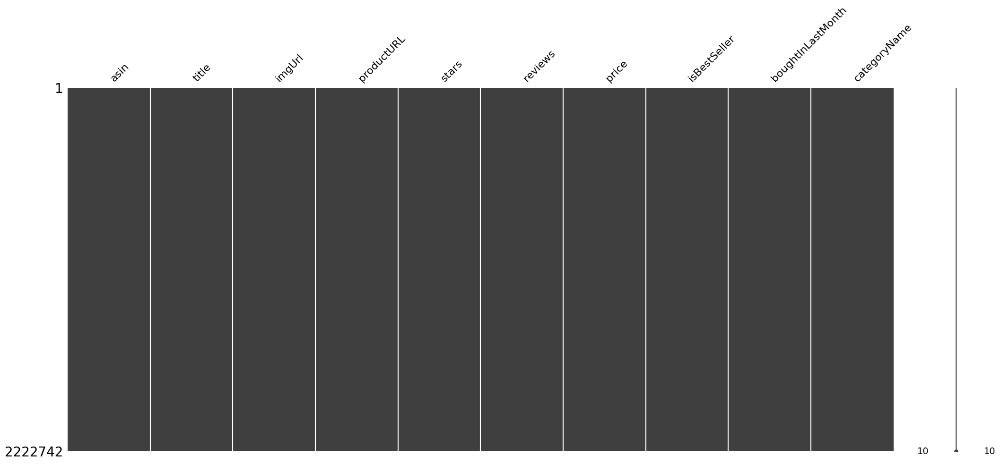

In [20]:
import missingno as msno

ax = msno.matrix(df)

Getting `Duplicates` of the data frame using the command "`.duplicated()`", shows whether the data set exists observations duplicated, in this case, there are no duplicated observations to be handled.

In [21]:
df[df.duplicated()].shape

(0, 10)

Next, it using the command "`.nunique()`" to get the unique values for each feature, in this case: 

- asin 2222742
- title 2073245
- imgUrl 1770232
- productURL 2222742
 -stars 42
 -reviews 17216
- price 82687
- isBestSeller 2
- boughtInLastMonth 25
- categoryName 296

In [22]:
df.nunique()

asin                 2222742
title                2073245
imgUrl               1770232
productURL           2222742
stars                     42
reviews                17216
price                  82687
isBestSeller               2
boughtInLastMonth         25
categoryName             296
dtype: int64

## 2.4 Finding Unique Values  

Getting all column names of the data frame using the command "`.columns`" to quickly list all the features and be easy to use next. After that, using the command "`.unique()`", to understand how the values are in each feature, and this case, look normal without finding or needing to handle it later.

In [23]:
df.columns

Index(['asin', 'title', 'imgUrl', 'productURL', 'stars', 'reviews', 'price',
       'isBestSeller', 'boughtInLastMonth', 'categoryName'],
      dtype='object')

In [24]:
df["stars"].unique()

array([4.7, 4.6, 4.5, 4.8, 0. , 4.4, 4.3, 4.1, 4.9, 5. , 3.8, 3.6, 4. ,
       4.2, 3. , 3.9, 2.5, 3.4, 3.7, 3.2, 3.3, 3.5, 2.7, 2.1, 1. , 3.1,
       2. , 2.9, 2.8, 1.5, 2.2, 2.3, 2.6, 2.4, 1.4, 1.9, 1.8, 1.7, 1.6,
       1.2, 1.3, 1.1])

## 2.5 Overview 

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2222742 entries, 0 to 2222741
Data columns (total 10 columns):
 #   Column             Dtype  
---  ------             -----  
 0   asin               object 
 1   title              object 
 2   imgUrl             object 
 3   productURL         object 
 4   stars              float64
 5   reviews            int64  
 6   price              float64
 7   isBestSeller       bool   
 8   boughtInLastMonth  int64  
 9   categoryName       object 
dtypes: bool(1), float64(2), int64(2), object(5)
memory usage: 154.7+ MB


With the approaches used before and also with using a “`ProfileReport`” from “`ydata_profiling`” it was possible to get the first steps and understanding of the data frame, the Amazon UK Products Data has **10** features, **2222742** observations, there are **no features missing values**, there are **none duplicate rows**, the size in memory is **154.7 MiB**, there are **4** features numeric (Numerical), **5** categorical (Object/Text) and **1** Boolean (Categorical).

There is one feature named "`title`" with large texts to be analysed and handled, after checking the statistical description using “`describe`” of the features it was noticed that there exist some different scales comparing the min and max values between the features that seems understandable due the feature names and the categorical feature "`categoryName`" could be encoded to be numerical.

Also some alert about the date was provided as: 
- "`reviews`" is highly overall correlated with "`stars`" - **High correlation**
- "`stars`" is highly overall correlated with "`reviews`" - **High correlation**
- "`isBestSeller`" is highly imbalanced (97.3%) - **Imbalance**
- "`reviews`" is highly skewed (γ1 = 137.457883) - **Skewed**
- "`price`" is highly skewed (γ1 = 26.53619436) - **Skewed**
- "`boughtInLastMonth`" is highly skewed (γ1 = 53.27920738) - **Skewed**
- "`asin`" has unique values - **Unique**
- "`productURL`" has unique values - **Unique**
- "`stars`" has 1174420 (52.8%) zeros - **Zeros**
- "`reviews`" has 1174420 (52.8%) zeros - **Zeros**
- "`boughtInLastMonth`" has 2061427 (92.7%) zeros - **Zeros**

Besides it is possible to get information on each feature separately, also a distribution graphic, interactions between the features, graphical missing values count a sample of the data set for the first and last observations and so on. 

In [26]:
# pip install ydata-profiling

In [27]:
# pip install ipywidgets

Left the command below and commented to not turn the document even larger.

In [28]:
# from ydata_profiling import ProfileReport

# ProfileReport(df)

# 3. DATA PREPARATION

After having the first impressions of the data set it is time to handle the seen points, prepare the data set for the next steps, in addition, do a deep analysis with graphics, functions and so on.

## 3.1 Dropping Irrelevant Columns 

After analyses, it opted not to delete any feature, because these features could be used in some specific analysis, also, there is no reason to drop any feature, until here.

Looking from another perspective, these features could be analysed using, for example, an approach of Feature Selection: UFS (Univariate Feature Selection) and RFE (Recursive Feature Elimination) to get an understandable reason for not using a specific feature, also if starting to drop features just in the beginning there is no reason to use Feature Extraction such as LDA (Linear Discriminant Analysis), PCA (Principal Component Analysis) or t-DSNE (t-Distributed Stochastic Neighbor Embedding).

But in case needed to drop some features in the beginning, in this case, it would be the features: "`asin, imgUrl and productURL`" once these features do not add up as much with values such as ID and Url values.

Below is an example of feature dropping:

``` python
df = df.drop(columns = ["asin", "imgUrl", "productURL"])
```

## 3.2 Renaming Columns 

After analyses, it opted to rename all features: "`asin to Asin, title to Title, stars to Stars, reviews to Reviews, price to PriceGBP, isBestSeller to BestSeller, boughtInLastMonth to boughtLastMonth and categoryName to Category`" using the command "`.rename()`" and comparing before and after using the command "`.columns`".

In [29]:
df.columns

Index(['asin', 'title', 'imgUrl', 'productURL', 'stars', 'reviews', 'price',
       'isBestSeller', 'boughtInLastMonth', 'categoryName'],
      dtype='object')

In [30]:
df = df.rename(columns = {'asin': 'Asin', 'title': 'Title', 'stars': 'Stars', 'reviews': 'Reviews', 'price': 'PriceGBP', 'isBestSeller': 'BestSeller', 'boughtInLastMonth': 'boughtLastMonth', 'categoryName': 'Category'})

In [31]:
df.columns

Index(['Asin', 'Title', 'imgUrl', 'productURL', 'Stars', 'Reviews', 'PriceGBP',
       'BestSeller', 'boughtLastMonth', 'Category'],
      dtype='object')

## 3.3 Replacing Values (Syntax Errors)

After analyses, there are no syntax errors to be handled like categorical data with descriptions in texts, or other syntax divergence, the features with text: "`Title and Category`", were already well-typed, but once something does not seem right, it will be dealt with.

## 3.4 Handling/Imputing Missing Values 

After analysis, it was checked that there are no missing values through the observations existing to be handled, but once there are, it could be handled with the approach below using "`bfill`", and also could be tested with `Mean or Median`, or other algorithm, like IterativeImputer, etc.

``` python
df[["PriceGBP"]] = df[["PriceGBP"]].fillna(df[["PriceGBP"]].fillna(method = 'bfill'))

```

## 3.5 Handling Duplicate Rows

After analysis, it was checked that there are no duplicate observations existing to be removed, but once there are, it could be handled with the approach below to drop them all.

``` python
df = df.drop_duplicates()
```

## 3.6 Variable Encoding

Importing the method "`LabelEncoder`" in "3.6 topic", from "sklearn.preprocessing" to encode the categorical data.

In [32]:
# pip install joblib

In [33]:
from sklearn.preprocessing import LabelEncoder

### 3.6.1 Variable Encoding - Category Feature

Encoding the values from the feature "`Category`" in a new feature named "`CategoryEncoded`", first checking the unique values using the command "`.unique()`", next counting the values using the command "`.value_counts()`", encoding using the method "`LabelEncoder`", next checking once again unique values and counting the values after encoded the values, also getting the Head. Next, doing the same with BestSeller feature.

In [34]:
df['Category'].unique()

array(['Hi-Fi Speakers', 'CD, Disc & Tape Players', 'Wearable Technology',
       'Light Bulbs', 'Bathroom Lighting',
       'Heating, Cooling & Air Quality', 'Coffee & Espresso Machines',
       'Lab & Scientific Products', 'Smart Speakers',
       'Motorbike Clothing', 'Motorbike Accessories',
       'Motorbike Batteries', 'Motorbike Boots & Luggage',
       'Motorbike Chassis', 'Handmade Home & Kitchen Products',
       'Hardware', 'Storage & Home Organisation',
       'Fireplaces, Stoves & Accessories', 'PC Gaming Accessories',
       'USB Gadgets', 'Blank Media Cases & Wallets', 'Car & Motorbike',
       'Boys', 'Sports & Outdoors', 'Microphones', 'String Instruments',
       'Karaoke Equipment', 'PA & Stage',
       'General Music-Making Accessories', 'Wind Instruments',
       'Handmade Gifts', 'Fragrances', 'Calendars & Personal Organisers',
       'Furniture & Lighting', 'Computer Printers', 'Ski Goggles',
       'Snowboards', 'Skiing Poles', 'Downhill Ski Boots',
       'Hiki

In [35]:
df['Category'].value_counts()

Category
Sports & Outdoors                 826076
Skin Care                          18755
Fragrances                         18563
Make-up                            18453
Manicure & Pedicure Products       17212
                                   ...  
Torches                               64
Smart Home Security & Lighting        57
Lighting                              50
Smart Speakers                        25
Cameras                               12
Name: count, Length: 296, dtype: int64

In [36]:
encoder = LabelEncoder()
df['CategoryEncoded'] = encoder.fit_transform(df['Category'])

In [37]:
df['CategoryEncoded'].unique()

array([130,  38, 290, 169,  18, 127,  51, 163, 255, 196, 191, 192, 193,
       195, 118, 123, 265,  92, 217, 284,  30,  46,  35, 262, 183, 268,
       153, 215, 103, 291, 117,  94,  41,  95,  58, 248, 260, 250,  81,
       131, 221, 225,  99,  28, 266, 172,  21,  64, 251, 155, 158, 132,
       165, 235, 108,  56, 190, 230,  39,  59, 267,   0,  13, 294, 174,
         6, 216, 242, 185,  29, 121,   2, 234,  67, 178, 218, 229,   5,
       277,  31,  68,  16, 136, 275, 161, 162,  62, 289,  25, 177,  93,
        60, 134, 237,  47, 295, 170, 253, 199, 197, 194, 200, 201, 205,
       159, 240, 188,  40, 110, 220, 245, 247, 212,  98,  20, 175,  65,
       140, 292, 139,  78, 135, 160, 179,  48,  22,  97,  79, 264, 189,
       144,  55, 152, 232, 276, 114, 146, 278,   1,  14, 176, 270, 223,
       283, 186,  85, 236, 214, 287, 166, 203, 204, 202, 198, 171, 226,
       138, 106, 219,  37, 243, 273, 154, 164, 124,   9, 256, 224,  83,
       271, 208, 210, 102, 211,  72, 279, 227, 126,  73,  45, 24

In [38]:
df['CategoryEncoded'].value_counts()

CategoryEncoded
262    826076
251     18755
94      18563
176     18453
177     17212
        ...  
280        64
254        57
170        50
255        25
44         12
Name: count, Length: 296, dtype: int64

### 3.6.2 Variable Encoding - BestSeller Feature

`BestSeller` values: before "`False`" with 2216724 values and now encoded with the number 0, and, before "`True`" with 6018 values and now encoded with the number 1.

Shorter explanation: False = 2216724 and True = 6018.

In [39]:
df["BestSeller"].unique()

array([False,  True])

In [40]:
df['BestSeller'].value_counts()

BestSeller
False    2216724
True        6018
Name: count, dtype: int64

In [41]:
df['BestSeller'].replace(False, 0, inplace = True)
df['BestSeller'].replace(True, 1, inplace = True)
df["BestSeller"].unique()

array([0, 1])

In [42]:
df['BestSeller'].value_counts()

BestSeller
0    2216724
1       6018
Name: count, dtype: int64

In [43]:
df[["Title", "BestSeller"]].head(3)

,Title,BestSeller
0,"Echo Dot (5th generation, 2022 release) | Big ...",0
1,"Anker Soundcore mini, Super-Portable Bluetooth...",1
2,"Echo Dot (5th generation, 2022 release) | Big ...",0


## 3.7 Type Conversion 

After encoding the required features, it checked with the command "`.dtypes`" if needed any conversion, and in this case, there is no need to convert any features, all features are in their respective data type correctly.

Below is an example of a feature convert using `.astype` to (int) numerical value:
```python
df[['CategoryEncoded']] = df[['CategoryEncoded']].astype(int)
```

In [44]:
df.dtypes

Asin                object
Title               object
imgUrl              object
productURL          object
Stars              float64
Reviews              int64
PriceGBP           float64
BestSeller           int64
boughtLastMonth      int64
Category            object
CategoryEncoded      int64
dtype: object

## 3.8 Exploratory Data Analysis

Importing "`matplotlib.pyplot`" and "`seaborn`" in "3.8 topic" to get a data visualisation of the features. In this case, a "`heatmap`" is essential to visualise the density, patterns and relationships of the features. 

Creating a new data frame named `"numeric_cols`" and getting all numeric columns from the "`df`" data frame, after using the algorithm "`.corr`" in "`numeric_cols.corr()`" to save the correlations into a new variable "`correlation_matrix`" to show the correlation matrix and check the relations between them. In this case, there do not seem to exist a few correlations between the features, a strong sign, a pattern or a relationship between them.

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

,Stars,Reviews,PriceGBP,BestSeller,boughtLastMonth,CategoryEncoded
Stars,1.000000,0.085124,-0.122505,0.056826,0.106259,-0.294748
Reviews,0.085124,1.000000,-0.012482,0.061835,0.095229,-0.039215
PriceGBP,-0.122505,-0.012482,1.000000,-0.010241,-0.021390,0.029695
BestSeller,0.056826,0.061835,-0.010241,1.000000,0.222299,-0.023498
boughtLastMonth,0.106259,0.095229,-0.021390,0.222299,1.000000,-0.045713
CategoryEncoded,-0.294748,-0.039215,0.029695,-0.023498,-0.045713,1.000000


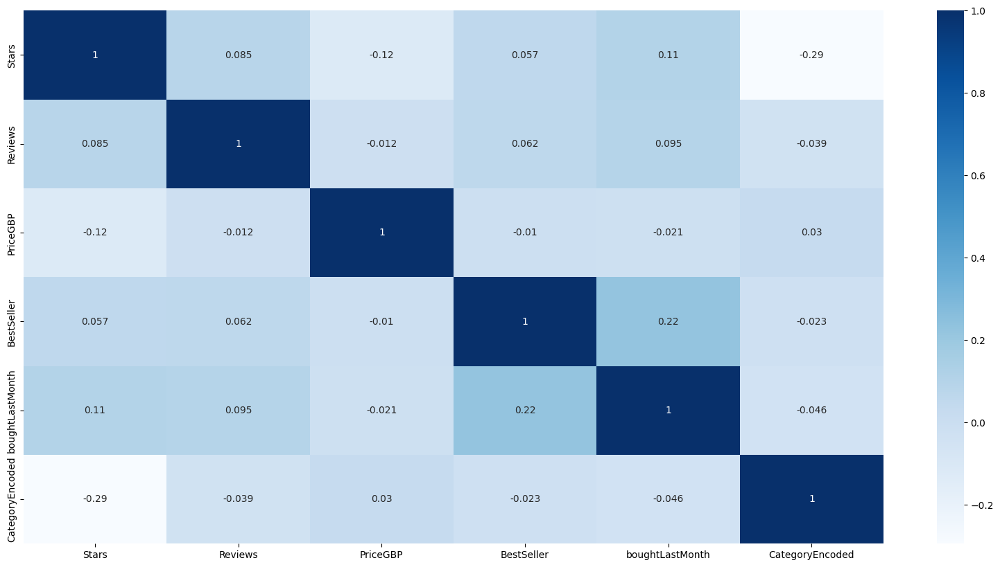

In [46]:
numeric_cols = df.select_dtypes(include = ['number'])

plt.figure(figsize = (20, 10))
correlation_matrix = numeric_cols.corr()

sns.heatmap(correlation_matrix, cmap = "Blues", annot = True)
correlation_matrix

Next creating a "`pairplot`" to visualise all the features and their respective signals.

Note: Add a comment on the line below, to run this document faster, also left the result result as the image bellow.

In [47]:
# sns.pairplot(df);

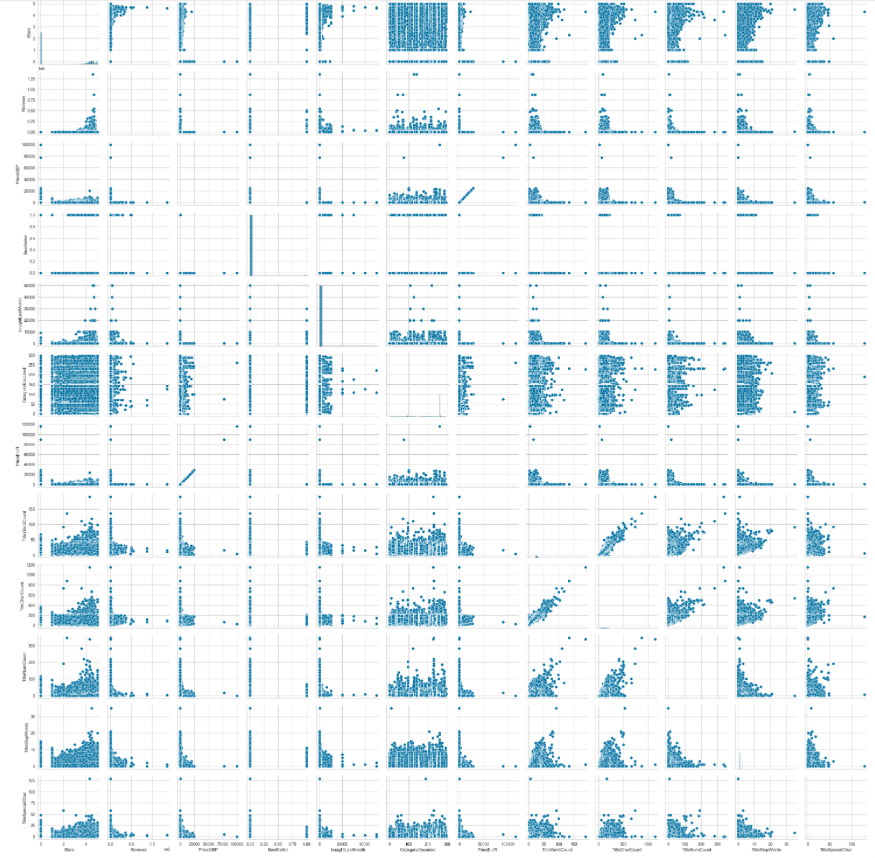

### 3.8.1 Checking Data Distribution

First getting all numerical Features "separate Numerical and categorical variables" (Mahadevan, 2022) using "`.select_dtypes()`" to use in the next steps, next, was created a comparison using "`distplot`" and "`kdeplot`" graphics using a "`for loop`", to check the distribution of all numerical features: "`Stars, Reviews, PriceGBP, BestSeller, boughtLastMonth and CategoryEncoded`", for each distribution feature it will be shown how skew this feature is, the mean, median and standard deviation value.

For the graphics to be more understandable it will add a mark to show, the mean and median on the graphic, learned an example from the GitHub Gist using the command "`.axvline`" to get a "Distribution plot with mean and median" (Cereniyim, 2019), also checked about the parameters on matplotlib website for "Add a vertical line across the Axes" (The Matplotlib Development Team, 2024).

Also the example for use "`for loop`" it was learned from the website "analyticsvidhya.com" tutorial "Step-by-Step Exploratory Data Analysis (EDA) using Python" in "Step 9: EDA Univariate Analysis" (Mahadevan, 2022).

In [48]:
numeric_cols = df.select_dtypes(exclude = ['object']).columns
print("Numerical Variables:", numeric_cols)

Numerical Variables: Index(['Stars', 'Reviews', 'PriceGBP', 'BestSeller', 'boughtLastMonth',
       'CategoryEncoded'],
      dtype='object')


Feature: Stars
Skew: 0.19
Mean: 2.03, Median: 0.00
Standard Deviation: 2.19


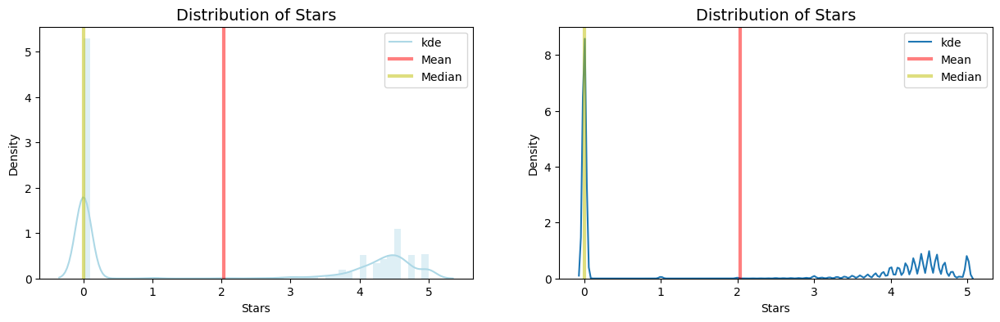

Feature: Reviews
Skew: 137.46
Mean: 382.16, Median: 0.00
Standard Deviation: 5020.75


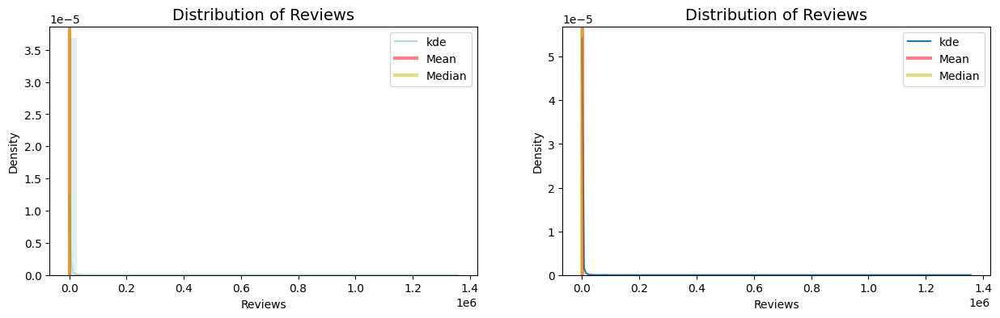

Feature: PriceGBP
Skew: 26.54
Mean: 94.26, Median: 19.90
Standard Deviation: 360.62


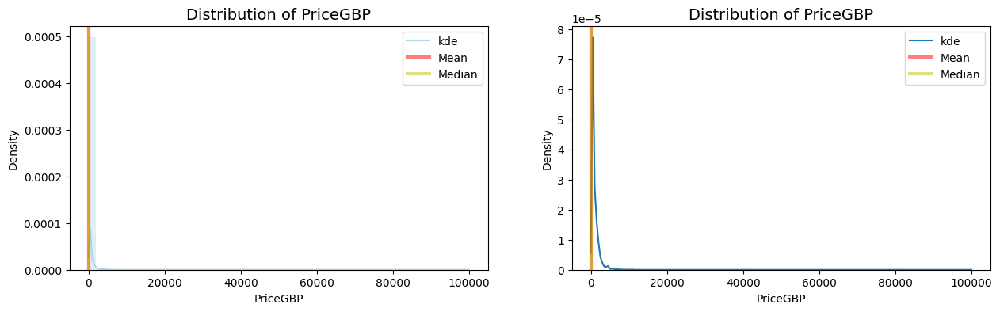

Feature: BestSeller
Skew: 19.14
Mean: 0.00, Median: 0.00
Standard Deviation: 0.05


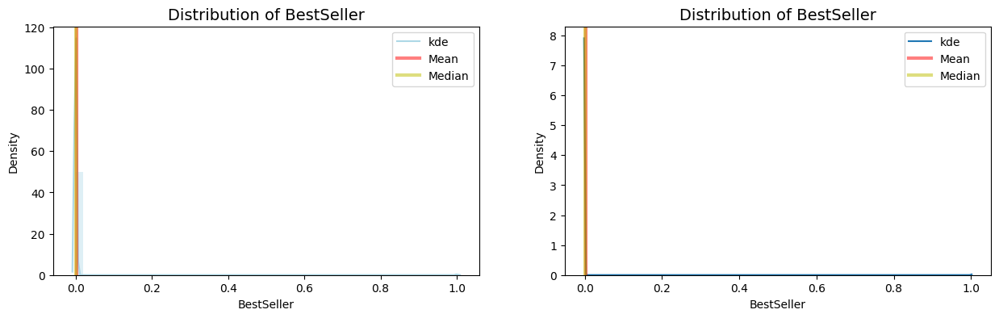

Feature: boughtLastMonth
Skew: 53.28
Mean: 18.57, Median: 0.00
Standard Deviation: 191.90


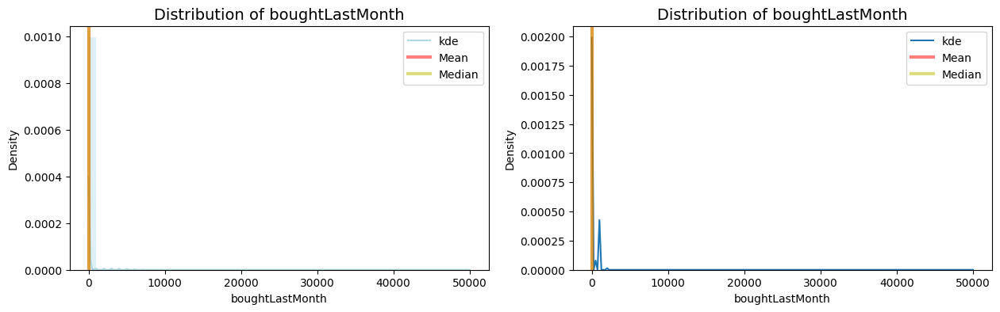

Feature: CategoryEncoded
Skew: -0.72
Mean: 190.60, Median: 232.00
Standard Deviation: 84.48


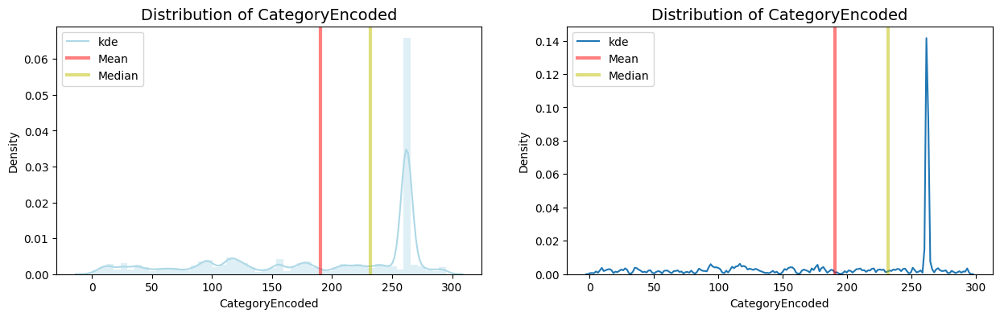

In [49]:
for col in numeric_cols:
    print('Feature:', col)
    print('Skew:', round(df[col].skew(), 2))
    print('Mean: {:.2f}, Median: {:.2f}'.format(df[col].mean(), df[col].median()))
    print('Standard Deviation: {:.2f}'.format(df[col].std()))
    
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    sns.distplot(df[col], axlabel = col, color = "lightblue");
    plt.axvline(df[col].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
    plt.axvline(df[col].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
    plt.title("Distribution of " + col, size = 14)
    plt.legend(["kde", "Mean", "Median"])
    
    plt.subplot(1, 2, 2)
    sns.kdeplot(data = df, x = col, bw_adjust = .2)
    plt.axvline(df[col].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
    plt.axvline(df[col].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
    plt.title("Distribution of " + col, size = 14)
    plt.legend(["kde", "Mean", "Median"])
    plt.show()

- **Stars**: The distribution “`looks like have two different distribution`” in this case the data is bimodal showing an up, down, up, down. Skew: 0.19 - Statistical Values: Mean: 2.03, Median: 0.00 and Standard Deviation: 2.19.
  
- **Reviews**: The distribution is “`skewed to the left side`”. Skew: 137.46 - Statistical Values: Mean: 382.16, Median: 0.00 and Standard Deviation: 5020.75.
  
- **PriceGBP**: The distribution is “`skewed to the left side`”. Skew: 26.54 - Statistical Values: Mean: 94.26, Median: 19.90 and Standard Deviation: 360.62.
  
- **BestSeller**: The distribution is “`skewed to the left side`”. Skew: 19.14 - Statistical Values: Mean: 0.00, Median: 0.00 and Standard Deviation: 0.05.
  
- **boughtLastMonth**: The distribution is “`skewed to the left side`”. Skew: 53.28 - Statistical Values: Mean: 18.57, Median: 0.00 and Standard Deviation: 191.90.
  
- **CategoryEncoded**: The distribution is “`skewed to the right side`”. Skew: -0.72 - Statistical Values: Mean: 190.60, Median: 232.00 and Standard Deviation: 84.48.

Also to check from another perspective it was created a "`hist`" and a "`boxplot`". "In the below fig, a histogram and box plot is used to show the pattern of the variables, as some variables have skewness and outliers." (Mahadevan, 2022).

Feature: Stars
Skew: 0.19


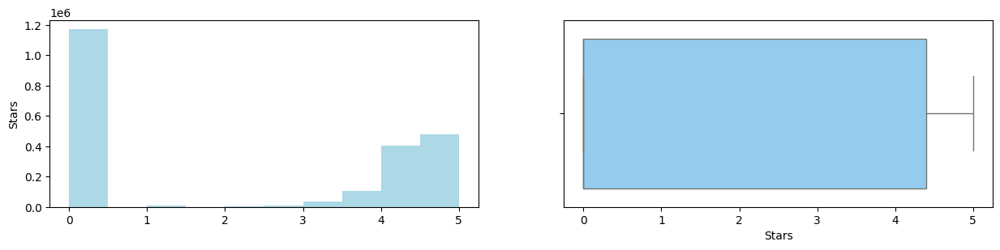

Feature: Reviews
Skew: 137.46


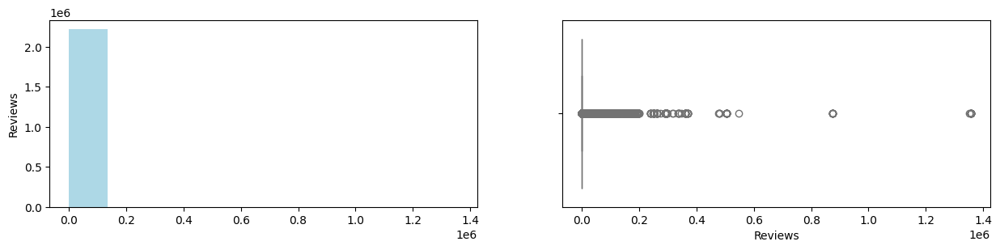

Feature: PriceGBP
Skew: 26.54


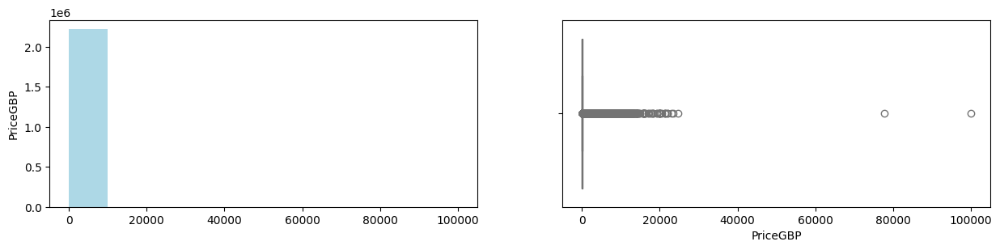

Feature: BestSeller
Skew: 19.14


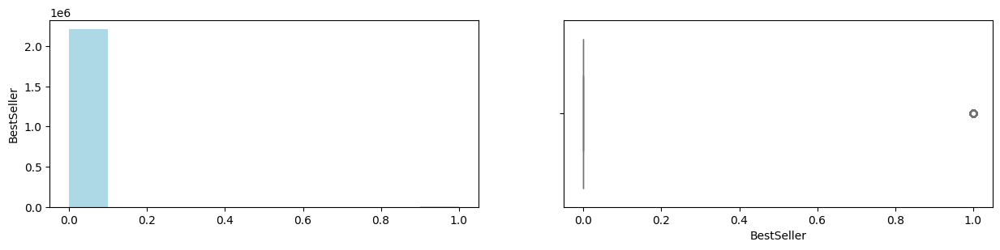

Feature: boughtLastMonth
Skew: 53.28


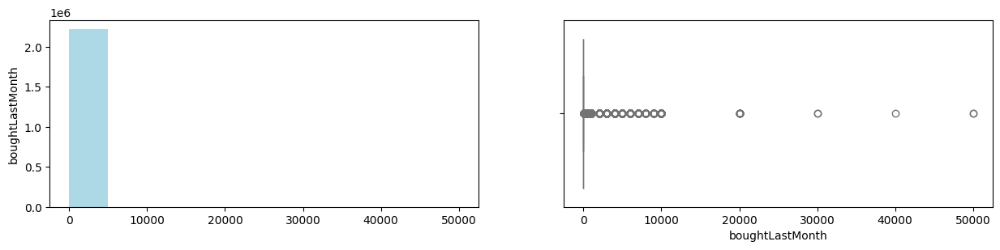

Feature: CategoryEncoded
Skew: -0.72


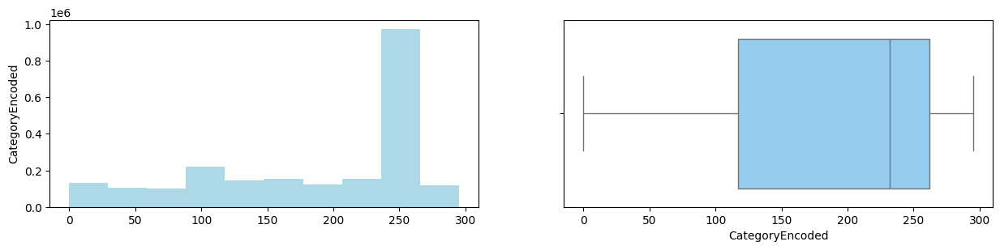

In [50]:
for col in numeric_cols:
    print("Feature: " + col)
    print('Skew:', round(df[col].skew(), 2))
    
    plt.figure(figsize = (15, 3))
    
    plt.subplot(1, 2, 1)
    df[col].hist(grid = False, color = "lightblue")
    plt.ylabel(col)
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x = df[col], color = "lightskyblue")
    plt.show()

Next getting all Categorical Features "separate Numerical and categorical variables" (Mahadevan, 2022) using "`.select_dtypes()`". 

In [51]:
categorical_cols = df.select_dtypes(include = ['object']).columns
print("Categorical Variables:", categorical_cols)

Categorical Variables: Index(['Asin', 'Title', 'imgUrl', 'productURL', 'Category'], dtype='object')


Tried to plot a Bar plot for all categorical variables in the dataset, more specifically the features Title and Category, from the example "Step-by-Step Exploratory Data Analysis (EDA) using Python" (Mahadevan, 2022) in "Step 8: Statistics Summary" from analyticsvidhya.com, but it was not possible, the data is too large for it, even leaving the algorithm calculating for a long period, got no feedback, also, the results would not be well represented due to the large number of values in these features. 

In [52]:
# print("Bar plot for all categorical variables in the dataset:\n")

# for col, i in zip(categorical_cols, range(len(categorical_cols))):
#     plt.figure(figsize = (6, 4))
#     sns.countplot(x = col, data = df, palette = "Blues_r", order = df[col].value_counts().index);
#     plt.title('Feature: ' + col)
#     plt.xticks([])
#     plt.show()

Next, it created a "`boxplot`" graphic to check all features and their respective distribution in a boxplot, seems that the features "`Reviews, PriceGBP, BestSeller and boughtLastMonth`" have some signals of outliers.

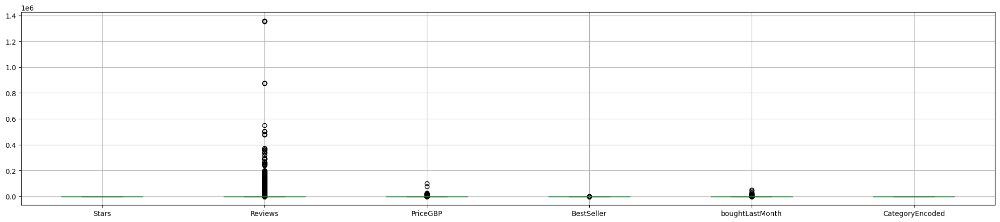

In [53]:
df.boxplot(figsize = (25, 5));

Now, checking and comparing the features side by side using "`boxplot`", this example it was learned from the website "proclusacademy" for creating a "Boxplot With Separate Y-Axis for Each Column" (Yashmeet Singh, 2022).

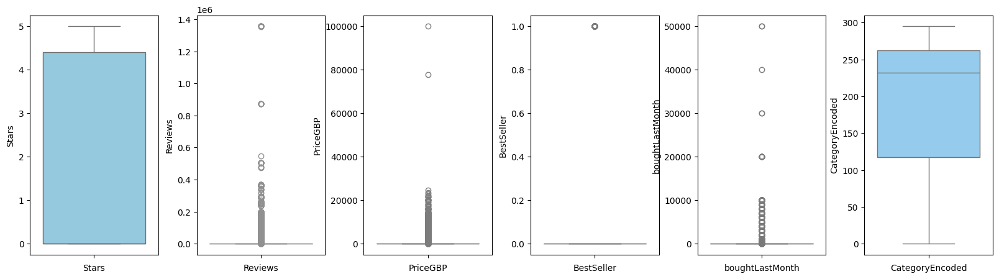

In [54]:
fig, ax = plt.subplots(1, 6, figsize = (20, 5))

plt.subplots_adjust(wspace = 0.3) 

sns.boxplot(data = df['Stars'], ax = ax[0], color = 'skyblue')
ax[0].set_xlabel('Stars')

sns.boxplot(data = df['Reviews'], ax = ax[1], color = 'lightcyan')
ax[1].set_xlabel('Reviews')
 
sns.boxplot(data = df['PriceGBP'], ax = ax[2], color = 'paleturquoise')
ax[2].set_xlabel('PriceGBP')
 
sns.boxplot(data = df['BestSeller'], ax = ax[3], color = 'powderblue')
ax[3].set_xlabel('BestSeller')

sns.boxplot(data = df['boughtLastMonth'], ax = ax[4], color = 'lightblue')
ax[4].set_xlabel('boughtLastMonth')

sns.boxplot(data = df['CategoryEncoded'], ax = ax[5], color = 'lightskyblue')
ax[5].set_xlabel('CategoryEncoded')
    
plt.show()

Getting a "`kdeplot`" for "`CategoryEncoded and BestSeller as a hue`", "Relative to a histogram, KDE can produce a plot that is less cluttered and more interpretable, especially when drawing multiple distributions." (Seaborn, 2012), it is possible to see that the feature data is overfitting.

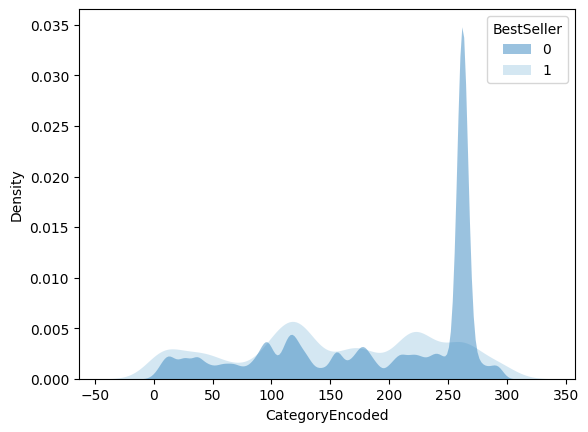

In [55]:
sns.kdeplot(
   data = df, x = "CategoryEncoded", hue = df['BestSeller'],
   fill = True, common_norm = False, palette = "Blues_r",
   alpha = .5, linewidth = 0
);

Using the scatter plot next to see in the graphic how the features "`Stars`" and "`Reviews`" have a high correlation between them, as analysed before.

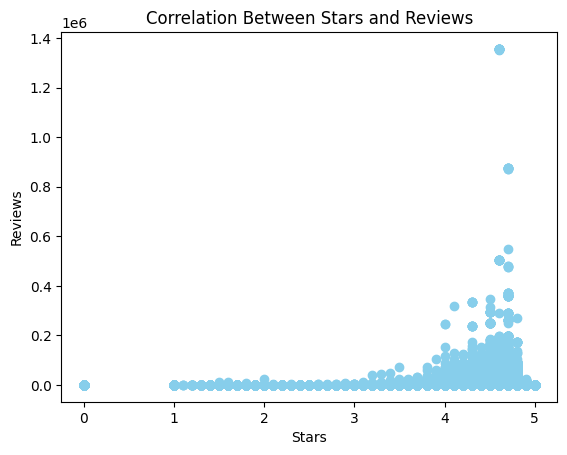

In [56]:
plt.scatter(data = df, x = "Stars", y = "Reviews", color = "skyblue")

plt.title("Correlation Between Stars and Reviews")
plt.xlabel("Stars")
plt.ylabel("Reviews")

plt.show()

### 3.8.2 Analysis

#### 3.8.2.1 Analysing Customer ratings

1. Analysing customer ratings with stars obtained from the products to show the best products by category and which are the easiest niches to make sales.

**Categories by Stars**

Next, plotted in a barplot graphic to find out which are the easiest niches to make sales, after the results, the graphic presented that "Sports & Outdoors, Skin Care, Fragrances, Makeup and Manicure & Pedicure Products" are the best niches to make sales. 

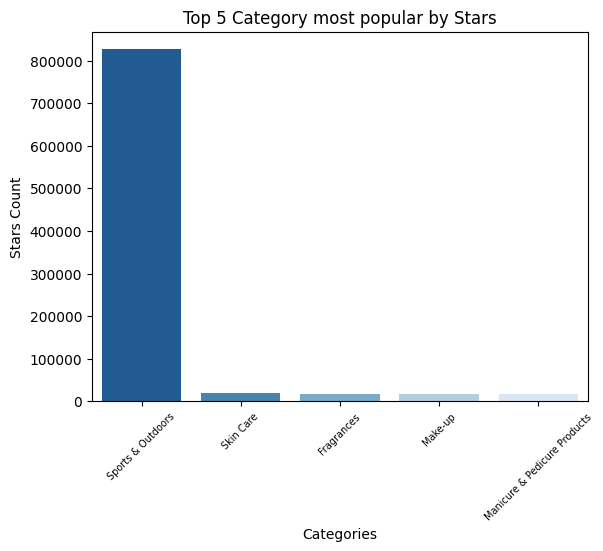

In [57]:
filter = df.groupby("Category", as_index = False).count().sort_values(by = "Stars", ascending = False).head(5)

sns.barplot(data = filter, x = "Category", y = "Stars", palette = "Blues_r")

plt.title('Top 5 Category most popular by Stars')
plt.xlabel('Categories')
plt.ylabel('Stars Count')

plt.xticks(rotation = 45, size = 7)
plt.show()

#### 3.8.2.2 Analysing Customer ratings

1. Analysing the best product items by stars to check which are the top 5 products.

**Title by Stars**

Next, it plotted a bar plot graphic of the top 5 Titles grouped by stars, after the results, the graphic presented the items below are the best with star ratings. 

1. Ohmc Portable Pedal Exerc
2. ScibOr Outdoor Sleeveless Fishing Vest
3. Breathable Lace-Up Football Shoes Non-Slip Outdoor Boys Junior Soccer Shoes Training Professional Boots Soccer Sneakers Athletics Training Shoes for Teenager
4. CMP Women's T-shirt
5. SHOPPRO Kids Golf Shoes Set, White, with Shoes Bag, UV Sun Protection Arm Sleeves, Golf Pro Cap and Instant Cooling Towel, Outdoor Sneakers, Girls Sport Training, POSMA GSHO07WHT39_B (White)

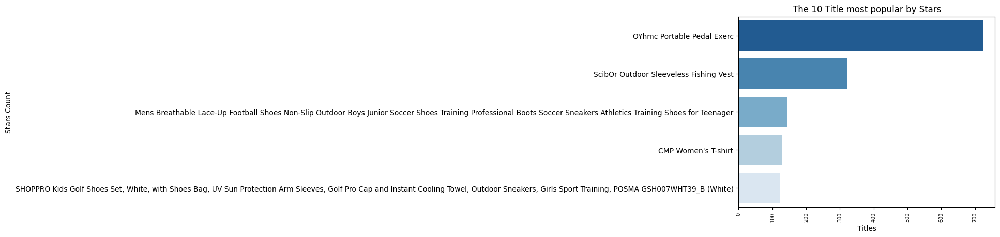

In [58]:
filter = df.groupby("Title", as_index = False).count().sort_values(by = "Stars", ascending = False).head(5)

sns.barplot(data = filter, y = "Title", x = "Stars", palette = "Blues_r")

plt.title('The 10 Title most popular by Stars')
plt.xlabel('Titles')
plt.ylabel('Stars Count')

plt.xticks(rotation = 90, size = 7)
plt.show()

#### 3.8.2.3 Analysing Customer ratings

1. Analysing the best category by Reviews received to check which are the top 5 categories.

**Category by Review Ratings**

Next, it plotted a bar plot graphic of the top 5 Categories grouped by Reviews, after the results, the graphic presented the items below are the best with review ratings.
1. Data Storage	51617783
2. Cables & Accessories	50789444
3. Household Batteries, Chargers & Accessories	35792629
4. Sports & Outdoors	33807471
5. Health & Personal Care	30535773

Importing "`plotly.express`" in "`3.8.2 topic`", to use the graphing libraries with a high-level interface to Plotly.

In [59]:
import plotly.express as px

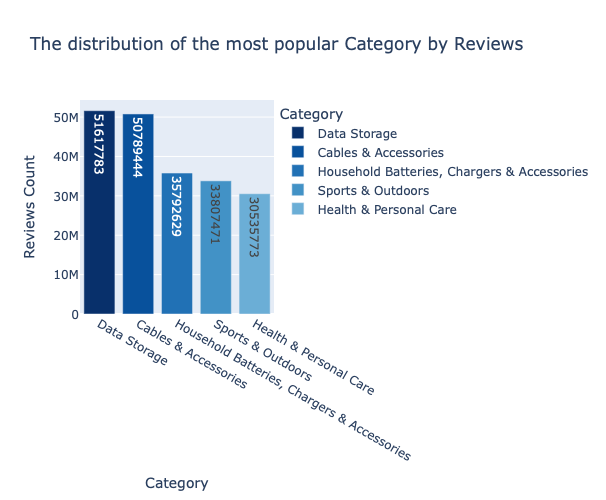

In [60]:
filter = df.groupby("Category")["Reviews"].sum().nlargest(5).reset_index()

fig = px.bar(filter, x = "Category", y = "Reviews", 
             text_auto ='.8', title = "The distribution of the most popular Category by Reviews",
             color = "Category", color_discrete_sequence = px.colors.sequential.Blues_r,
             height = 500)

fig.update_layout(xaxis_title = "Category", yaxis_title = "Reviews Count")
fig.show()

#### 3.8.2.4 Analysing Customer ratings

1. Analysing the best category by Stars received to check which are the top 5 categories.

**Category by Stars Ratings**

Next, it plotted a bar plot and a pie graphic of the top 5 Categories grouped by Stars, after the results, the graphic presented the items below are the best with star ratings.
1. Sports & Outdoors	604871.4
2. Skin Care	77663.8
3. Make-up	70150.6
4. Men	69299.5
5. Women	67729.6

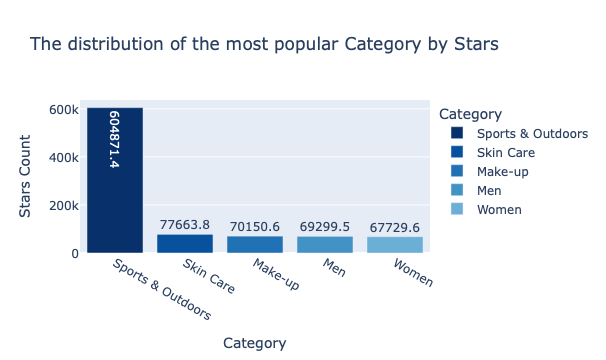

In [61]:
filter = df.groupby("Category")["Stars"].sum().nlargest(5).reset_index()

fig = px.bar(filter, x = "Category", y = "Stars", 
             text_auto ='.8', title = "The distribution of the most popular Category by Stars",
             color = "Category", color_discrete_sequence = px.colors.sequential.Blues_r)

fig.update_layout(xaxis_title = "Category", yaxis_title = "Stars Count")
fig.show()

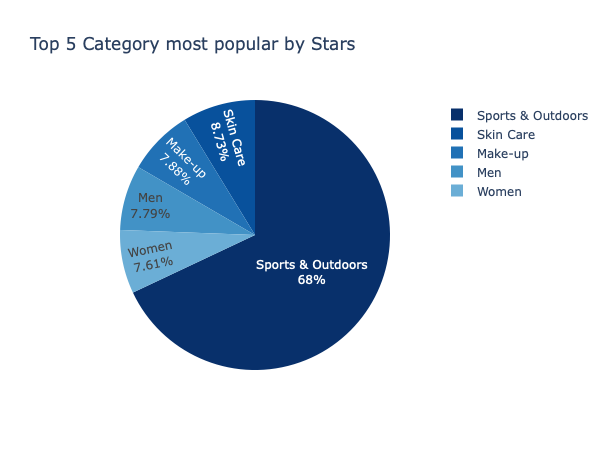

In [62]:
filter = df.groupby("Category")["Stars"].sum().nlargest().to_dict()

fig = px.pie(values = filter.values(), names = filter.keys(), 
             color_discrete_sequence = px.colors.sequential.Blues_r,
             title = "Top 5 Category most popular by Stars", 
             height = 450)
fig.update_traces(textposition = 'inside', textinfo = 'percent+label')
fig.show()

#### 3.8.2.5 Analysing Customer ratings

1. Analysing the best Products by Reviews received to check which are the top 5 performing.

**Title by Review Ratings**

Next, it created a table of the top 5 Titles grouped by Reviews, after the results, the graphic presented the items below are the best with Review ratings.

In [63]:
df.groupby("Title")["Reviews"].sum().nlargest(5).reset_index()

,Title,Reviews
0,Amazon Basics 10-Pack AA High-Performance Alka...,1356658
1,Amazon Basics AA 1.5 Volt Performance Alkaline...,1356658
2,Amazon Basics AA 1.5 Volt Performance Alkaline...,1356658
3,Amazon Basics AA 1.5 Volt Performance Alkaline...,1356658
4,Amazon Basics AA Performance Alkaline Batterie...,1356658


#### 3.8.2.6 Analysing Customer ratings

1. Analysing the best Products by Stars received to check which are the top 5 performing.

**Title by Stars Ratings**

Next, it created a table of the top 5 Titles grouped by Stars, after the results, the graphic presented the items below are the best with Review ratings.

In [64]:
df.groupby("Title")["Stars"].sum().nlargest(5).reset_index()

,Title,Stars
0,Men's Glycerin Gts 20 Running Shoe,286.6
1,Boys Pyjamas,191.5
2,Mens Breathable Lace-Up Football Shoes Non-Sli...,168.0
3,Archer Watch Straps - Silicone Quick Release S...,153.0
4,Girls Pyjamas,152.7


#### 3.8.2.7 Analysing Customer ratings

3. Present possible recommendations to customers through the best-seller products with higher sales.

**BestSeller by Title**

Next, got a table with another point of view, adding the values from BestSeller to get the best 10 Titles to understand better which products are best-selling products, that make sense where the products are from the Sports & Outdoors Category. 
The objective of creating a model for possible recommendations to customers through the best-seller will be analysed further.

In [65]:
df.groupby(['Title']).agg({'BestSeller': sum}).sort_values(by = 'BestSeller', ascending = False).head(5)
# df.groupby("Title")["BestSeller"].sum().nlargest(5).reset_index()

,BestSeller
Title,
Millet Easy Up Climbing Shoes,5
Low Heel PU Tap Shoes,4
Men's Fleece Lined Snow Ski Pants Outdoor Waterproof Softshell Hiking Pants Winter Sweatpants Trousers Snowboarding Pants,4
"Smart Watch 2021, Fitness Tracker 1.69"" Touch Screen Heart Rate Sleep Monitor, IP68 Waterproof Fitness Watch Smartwatch, 24 Modes, Pedometer Activity Trackers Smart Watch for Men Women for Android iOS",4
ELAPHURUS Kids Trainers Mesh Running Shoes Casual Tennis Sneaker for Boys Girls,4


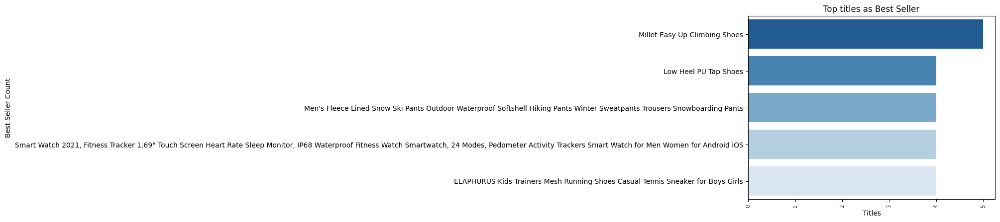

In [66]:
filter = df.groupby(['Title']).agg({'BestSeller': sum}).sort_values(by = 'BestSeller', ascending = False).head(5)
sns.barplot(data = filter, y = "Title", x = "BestSeller", hue = "Title", palette = "Blues_r")

plt.title('Top titles as Best Seller')
plt.xlabel('Titles')
plt.ylabel('Best Seller Count')

plt.xticks(rotation = 90, size = 7)
plt.show()

#### 3.8.2.8 Analysing Customer ratings

Present possible recommendations to customers through the best-seller products with higher sales of Titles bought in the last month.

**Bought in Last Month by Title**

Next, it plotted a bar plot graphic of the top 5 Titles grouped by boughtLastMonth, and got a table with another point of view, in this case, adding the values from boughtLastMonth to get the best 10 Titles.

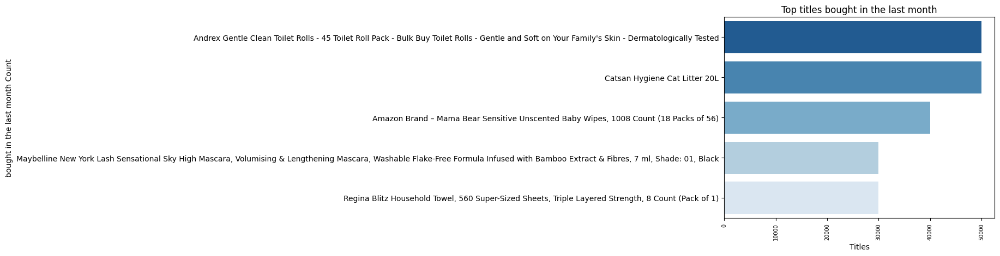

In [67]:
filter = df.groupby("Title")["boughtLastMonth"].sum().nlargest(5).reset_index()
sns.barplot(data = filter, y = "Title", x = "boughtLastMonth", hue = "Title", palette = "Blues_r")

plt.title('Top titles bought in the last month')
plt.xlabel('Titles')
plt.ylabel('bought in the last month Count')

plt.xticks(rotation = 90, size = 7)
plt.show()

In [68]:
df.groupby(['Title']).agg({'boughtLastMonth': sum}).sort_values(by = 'boughtLastMonth', ascending = False).head(5)
# df.groupby("Title")["boughtLastMonth"].sum().nlargest(5).reset_index()

,boughtLastMonth
Title,
Andrex Gentle Clean Toilet Rolls - 45 Toilet Roll Pack - Bulk Buy Toilet Rolls - Gentle and Soft on Your Family's Skin - Dermatologically Tested,50000
Catsan Hygiene Cat Litter 20L,50000
"Amazon Brand – Mama Bear Sensitive Unscented Baby Wipes, 1008 Count (18 Packs of 56)",40000
"Regina Blitz Household Towel, 560 Super-Sized Sheets, Triple Layered Strength, 8 Count (Pack of 1)",30000
"Maybelline New York Lash Sensational Sky High Mascara, Volumising & Lengthening Mascara, Washable Flake-Free Formula Infused with Bamboo Extract & Fibres, 7 ml, Shade: 01, Black",30000


#### 3.8.2.9 Analysing Customer ratings

Present possible recommendations to customers through the best-seller Category with higher sales of Categories bought in the last month.

**Bought in Last Month by Category**

Next, done the same as before, but in this case, with Category instead of Title, it plotted a bar plot graphic of the top 10 "Category" grouped by "boughtLastMonth", and got a table with another point of view, in this case, adding the values from boughtLastMonth to get the best 10 Categories.

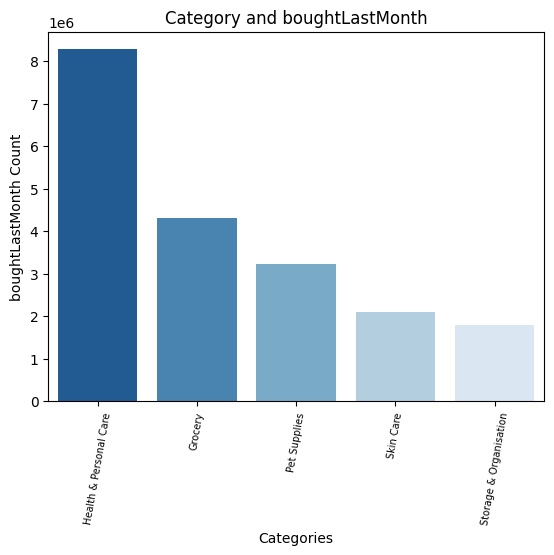

In [69]:
filter = df.groupby(['Category']).agg({'boughtLastMonth': sum}).sort_values(by = 'boughtLastMonth', ascending = False).head(5)
sns.barplot(data = filter, x = "Category", y = "boughtLastMonth", hue = "Category", palette = "Blues_r")

plt.title('Category and boughtLastMonth')
plt.xlabel('Categories')
plt.ylabel('boughtLastMonth Count')

plt.xticks(rotation = 80, size = 7)
plt.show()

In [70]:
df.groupby(['Category']).agg({'boughtLastMonth': sum}).sort_values(by = 'boughtLastMonth', ascending = False).head(5)

,boughtLastMonth
Category,
Health & Personal Care,8282750
Grocery,4320950
Pet Supplies,3231200
Skin Care,2095500
Storage & Organisation,1796900


#### 3.8.2.10 Analysing Customer ratings

2. Figuring out trending products by categories and their sales performance getting an idea of which products have the best sales performance.

**Title, Categories and Bought in Last Month**

Next, got a table which it was the best Bought in Last Month's products, to get an idea of which products had the best sales performance and plotted in a graphic.

In [71]:
df.groupby(['Title', 'Category']).agg({'boughtLastMonth': max}).sort_values(by = 'boughtLastMonth', ascending = False).head(4)

,,boughtLastMonth
Title,Category,
Catsan Hygiene Cat Litter 20L,Pet Supplies,50000
Andrex Gentle Clean Toilet Rolls - 45 Toilet Roll Pack - Bulk Buy Toilet Rolls - Gentle and Soft on Your Family's Skin - Dermatologically Tested,Grocery,50000
"Amazon Brand – Mama Bear Sensitive Unscented Baby Wipes, 1008 Count (18 Packs of 56)",Health & Personal Care,40000
"Regina Blitz Household Towel, 560 Super-Sized Sheets, Triple Layered Strength, 8 Count (Pack of 1)",Grocery,30000


Example learned from the website "geeksforgeeks.org" in the article "Get n-largest values from a particular column in Pandas DataFrame" (GeeksforGeeks, 2018a).

In [72]:
df[["Title", "Category", "boughtLastMonth"]].nlargest(5, ['boughtLastMonth']) 

,Title,Category,boughtLastMonth
205639,Catsan Hygiene Cat Litter 20L,Pet Supplies,50000
1557617,Andrex Gentle Clean Toilet Rolls - 45 Toilet R...,Grocery,50000
1252283,Amazon Brand – Mama Bear Sensitive Unscented B...,Health & Personal Care,40000
995347,Maybelline New York Lash Sensational Sky High ...,Make-up,30000
1557618,"Regina Blitz Household Towel, 560 Super-Sized ...",Grocery,30000


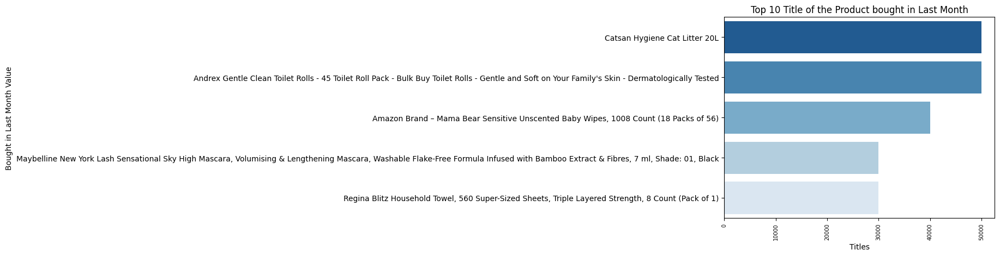

In [73]:
filter = df[["Title", "Category", "boughtLastMonth"]].nlargest(5, ['boughtLastMonth']) 
sns.barplot(data = filter, y = "Title", x = "boughtLastMonth", hue = "Title", palette = "Blues_r")

plt.title('Top 10 Title of the Product bought in Last Month')
plt.xlabel('Titles')
plt.ylabel('Bought in Last Month Value')

plt.xticks(rotation = 90, size = 7)
plt.show()

## 3.9 Handling Outliers 

Outliers are handled with the goal of not getting a negative performance in Machine Learning algorithms and trying to remove some noise, variance or bias existing in the data, in this case, the features "`Reviews, PriceGBP, BestSeller and boughtLastMonth`" contain outliers. However it opted not to remove any outliers, once these outliers could not be errors in the data, but just an unusual value.

Even opted not to handle the outliers and continue using it, it will create a test to check how the result will be after. First, it creates a copy of "`df`" to not mess up the original data until here, in the new Data Frame named "`df_outliers`" and plotting a "`boxplot`" to visualise before applying the "`Interquartile Range`" technique.

In [74]:
start_time = time.time()
df_outliers = df.copy()

print("%s seconds" % (time.time() - start_time))

0.055665016174316406 seconds


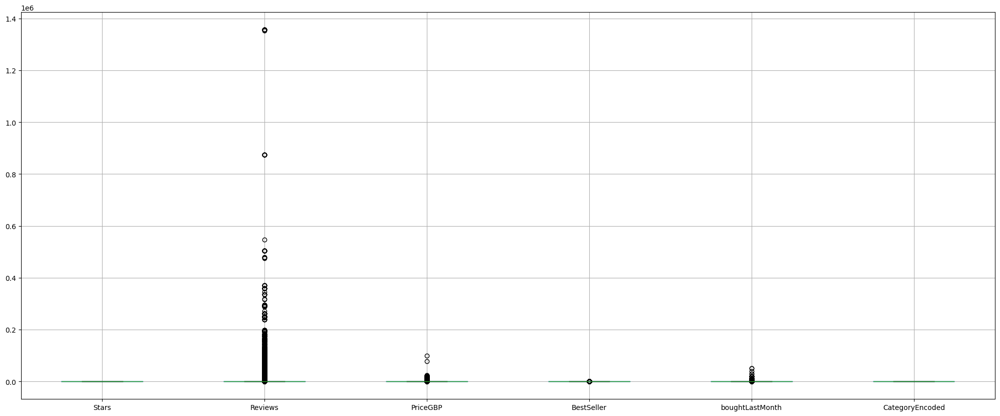

In [75]:
df_outliers.boxplot(figsize = (25, 10));

Using the IQR (Interquartile Range) Scoring technique to detect and remove any outliers. "instead look at individual features and identify extreme values in those features using interquartile range (IQR)" (Albon, 2018, p.85) in "`df_outliers`".

In [76]:
Q1 = df_outliers[["Stars", "Reviews", "PriceGBP", "BestSeller", "boughtLastMonth"]].quantile(0.25)
Q3 = df_outliers[["Stars", "Reviews", "PriceGBP", "BestSeller", "boughtLastMonth"]].quantile(0.75)
IQR = Q3 - Q1

In [77]:
df_outliers = df_outliers[~((df_outliers[["Stars", "Reviews", "PriceGBP", "BestSeller", "boughtLastMonth"]] < (Q1 - 1.5 * IQR)) | 
                            (df_outliers[["Stars", "Reviews", "PriceGBP", "BestSeller", "boughtLastMonth"]] > (Q3 + 1.5 * IQR))).any(axis=1)]

Next, using the command "`.shape`" to compare "`df`" with "`df_outliers`" after the IQR (Interquartile Range) changes to remove the outliers, and plotting a "`boxplot`" to visualise after applying the Interquartile Range technique.

The "`df`" had **2222742** observations and after removing the outliers the "`df_outliers`" has **1484942** observations in total, less **737800** observations.

In [78]:
df.shape, df_outliers.shape

((2222742, 11), (1484942, 11))

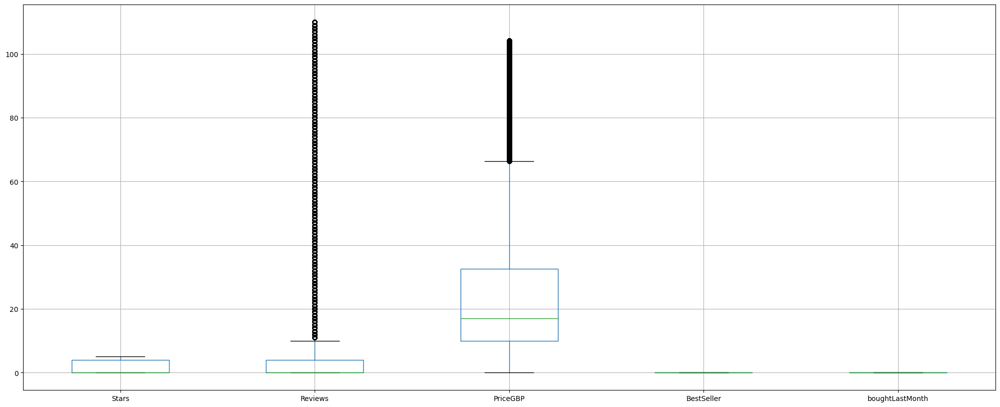

In [79]:
df_outliers[["Stars", "Reviews", "PriceGBP", "BestSeller", "boughtLastMonth"]].boxplot(figsize = (25, 10));

## 3.9 Feature Scaling

Importing "`preprocessing`" from "sklearn" in "3.9 topic" to use some scaling algorithm to scale the features to get a normal distribution or as close as possible and get better performance in Machine Learning algorithms. First, it will be tested: "`MinMaxScaler, StandardScaler, Normalisation and RobustScaler`" to understand which one is a better approach to this case. Next, it creates a copy from "`df`" in "`df_MinMaxScaler, df_StandardScaler, df_Normalisation and df_RobustScaler`" to not miss the data until here, in case success will keep the results on the feature whose name will be "`df_scaled`".

In [80]:
from sklearn import preprocessing

In [81]:
start_time = time.time()

df_MinMaxScaler = df_outliers.copy()
df_StandardScaler = df_outliers.copy() 
df_Normalisation = df_outliers.copy() 
df_RobustScaler = df_outliers.copy() 

print("%s seconds" % (time.time() - start_time))

0.12637996673583984 seconds


The features that will be scaled are: "`Stars, Reviews, boughtLastMonth and CategoryEncoded`" due to these features being numerical values with different scales and not scaling the features: "`PriceGBP and BestSeller`" where one feature is categorical, with 0 and 1 as a value and the feature "`PriceGBP`" could be used as a Target feature in Machine Learning Algorithms. After using the scale algorithm, it will be plotted in a "`boxplot`" graphic to check what the scale looks like.

**MinMaxScaler**

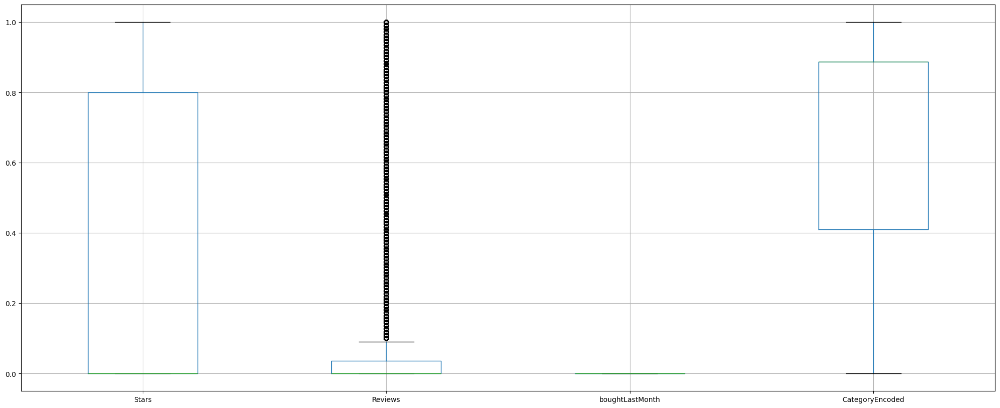

In [82]:
df_MinMaxScaler[["Stars", "Reviews", "boughtLastMonth", 
                 "CategoryEncoded"]] = preprocessing.minmax_scale(df_MinMaxScaler[["Stars", 
                                                                                   "Reviews", "boughtLastMonth", "CategoryEncoded"]])

df_MinMaxScaler.boxplot(column = ["Stars", "Reviews", "boughtLastMonth", "CategoryEncoded"], figsize = (25, 10));

**StandardScaler**

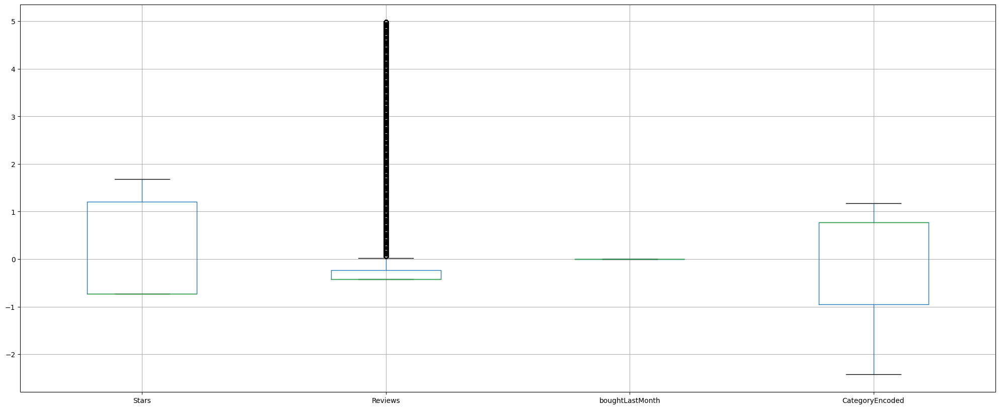

In [83]:
df_StandardScaler[["Stars", "Reviews", "boughtLastMonth", 
                   "CategoryEncoded"]] = preprocessing.StandardScaler().fit_transform(df_StandardScaler[["Stars", "Reviews", 
                                                                                                         "boughtLastMonth", "CategoryEncoded"]])

df_StandardScaler.boxplot(column = ["Stars", "Reviews", "boughtLastMonth", "CategoryEncoded"],figsize = (25, 10));

**Normalisation**

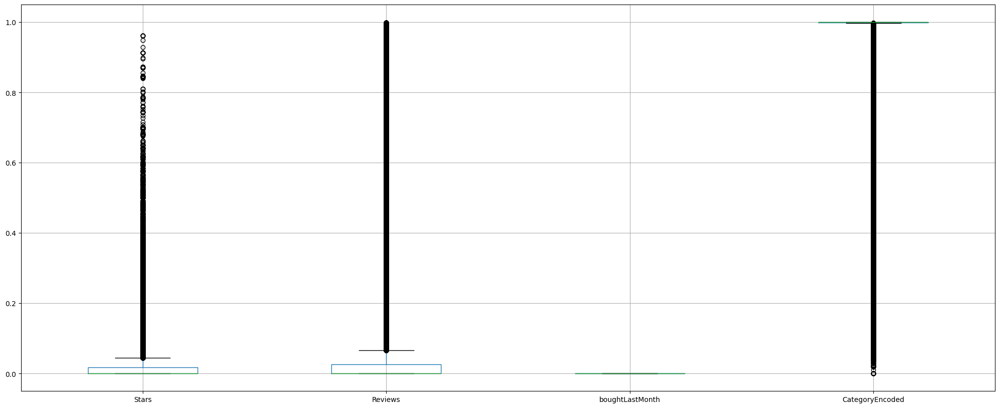

In [84]:
df_Normalisation[["Stars", "Reviews", "boughtLastMonth", 
                  "CategoryEncoded"]] = preprocessing.normalize(df_Normalisation[["Stars", "Reviews", 
                                                                                  "boughtLastMonth", "CategoryEncoded"]])

df_Normalisation.boxplot(column = ["Stars", "Reviews", "boughtLastMonth", "CategoryEncoded"],figsize = (25, 10));

**RobustScaler**

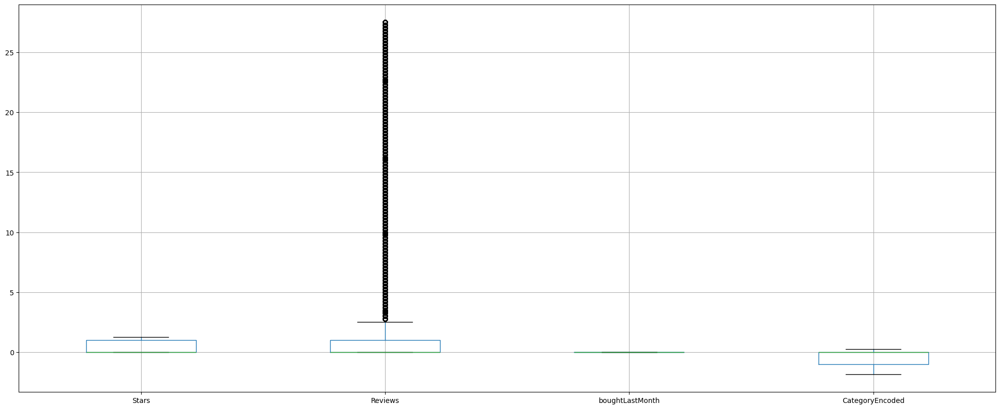

In [85]:
scaler = preprocessing.RobustScaler()
df_RobustScaler[["Stars", "Reviews", "boughtLastMonth", 
                 "CategoryEncoded"]] = scaler.fit_transform(df_RobustScaler[["Stars", "Reviews", "boughtLastMonth", "CategoryEncoded"]])

df_RobustScaler.boxplot(column = ["Stars", "Reviews", "boughtLastMonth", "CategoryEncoded"],figsize = (25, 10));

After analyses opted to keep "`RobustScaler`" as a good scaled this time due to this algorithm being “[…] robust to outliers. This Scaler removes the median and scales the data according to the quantile range (defaults to IQR: Interquartile Range). The IQR is the range between the 1st quartile (25th quantile) and the 3rd quartile (75th quantile).” (scikit-learn developers, 2024a). Copying the "`df_RobustScaler`" Data Frame to the new "`df_scaled`" Data Frame that it will be kept, next getting its head.

In [86]:
df_scaled = df_RobustScaler.copy()

Using the command "`reset_index`" to "Reset the index, or a level of it. Reset the index of the DataFrame, and use the default one instead. If the DataFrame has a MultiIndex, this method can remove one or more levels." (The Pandas Development Team, 2024a). It is necessary, that once the outliers were removed, there will be **737800** observations less than the original "`df`" and when it needs to be used, for example, in "`LDA, PCA and t-DSNE`" it will have null values when adding the feature Target back.

In [87]:
df.shape, df_outliers.shape, df_scaled.shape

((2222742, 11), (1484942, 11), (1484942, 11))

## 3.10 Feature Creation

Converting the Feature "`PriceGBP`" from pounds into Euro and renamed as "`PriceEUR`", where: 1 Pound sterling equals - 1.16 Euro and get the Head of it.

In [88]:
df["PriceGBP"] = df["PriceGBP"] * 1.16

df = df.rename(columns = {'PriceGBP': 'PriceEUR'})

df[["Title", "PriceEUR"]].head(2)

,Title,PriceEUR
0,"Echo Dot (5th generation, 2022 release) | Big ...",25.5084
1,"Anker Soundcore mini, Super-Portable Bluetooth...",27.8284


Creating a new feature named "`TitleWordCount`" saves the count of numbers words existing in the "`Title`" feature after a lambda function, and get the Head of it.

In [89]:
df["TitleWordCount"] = df["Title"].apply(lambda x : len(str(x).split()))
df[["Title", "TitleWordCount"]].head(2)

,Title,TitleWordCount
0,"Echo Dot (5th generation, 2022 release) | Big ...",19
1,"Anker Soundcore mini, Super-Portable Bluetooth...",23


Creating a new feature named "`TitleWordCount`" saves the count of characters existing in the "`Title`" feature, and get the Head of it.

In [90]:
df["TitleCharCount"] = df["Title"].str.len()
df[["Title", "TitleCharCount"]].head(2)

,Title,TitleCharCount
0,"Echo Dot (5th generation, 2022 release) | Big ...",115
1,"Anker Soundcore mini, Super-Portable Bluetooth...",194


Creating a new feature named "`TitleNumCount`" saves the count of numbers existing in the "`Title`" feature, and get the Head of it.

In [91]:
df["TitleNumCount"] = df["Title"].str.count('\d')
df[["Title", "TitleNumCount"]].head(2)

,Title,TitleNumCount
0,"Echo Dot (5th generation, 2022 release) | Big ...",5
1,"Anker Soundcore mini, Super-Portable Bluetooth...",4


Creating a new feature named "`TitleStopWords`" saves the count of Stop Words in English existing in the "`Title`" feature after a lambda function, and get the Head of it.

In [92]:
# pip install nltk

In [93]:
from nltk.corpus import stopwords

In [94]:
stop = stopwords.words("english")

df["TitleStopWords"] = df["Title"].apply(lambda x: len([x for x in x.split() if x in stop]))
df[["Title", "TitleStopWords"]].head(2)

,Title,TitleStopWords
0,"Echo Dot (5th generation, 2022 release) | Big ...",2
1,"Anker Soundcore mini, Super-Portable Bluetooth...",3


Creating a new feature named "`TitleSpecialChar`" saves the count of Special Characters existing in the "`Title`" feature, and get the Head of it.

In [95]:
df["TitleSpecialChar"] = df["Title"].str.count(r'[^\w\s,.]')
df[["Title", "TitleSpecialChar"]].head(2)

,Title,TitleSpecialChar
0,"Echo Dot (5th generation, 2022 release) | Big ...",5
1,"Anker Soundcore mini, Super-Portable Bluetooth...",4


Next, getting the Head of the all-new features created. 

In [96]:
df[['PriceEUR', 'TitleWordCount', 'TitleCharCount', 'TitleNumCount', 'TitleStopWords', 'TitleSpecialChar']].head()

,PriceEUR,TitleWordCount,TitleCharCount,TitleNumCount,TitleStopWords,TitleSpecialChar
0,25.5084,19,115,5,2,5
1,27.8284,23,194,4,3,4
2,25.5084,21,120,5,2,5
3,37.1084,22,130,5,3,5
4,20.8684,16,97,0,2,3


Next, it using the command "`iloc`" after the data frame name to get all information about it, and next it does the same, but in this case, getting just the feature "Title". 

In [97]:
df.iloc[0]

Asin                                                       B09B96TG33
Title               Echo Dot (5th generation, 2022 release) | Big ...
imgUrl              https://m.media-amazon.com/images/I/71C3lbbeLs...
productURL                     https://www.amazon.co.uk/dp/B09B96TG33
Stars                                                             4.7
Reviews                                                         15308
PriceEUR                                                      25.5084
BestSeller                                                          0
boughtLastMonth                                                     0
Category                                               Hi-Fi Speakers
CategoryEncoded                                                   130
TitleWordCount                                                     19
TitleCharCount                                                    115
TitleNumCount                                                       5
TitleStopWords      

In [98]:
df["Title"].iloc[0]

'Echo Dot (5th generation, 2022 release) | Big vibrant sound Wi-Fi and Bluetooth smart speaker with Alexa | Charcoal'

## 3.12 Text Data Processing

As a feature engineering step has no categorical data feature to be processed, this step "If dealing with text data, perform tasks such as tokenization, stemming, and removing stop words." (Domino Data Lab, 2024).

## 3.13 Time Series Features

As a feature engineering step has no time series feature to be handled, this step "Extract relevant timebased features such as lag features or rolling statistics for time series data." (Domino Data Lab, 2024).

## 3.14 Feature Selection

Following the line of reasoning of the Case Study "Advertisement click classification case study in Python" by "Farukh Hashmi" from "Thinking Neuron" (Hashmi, 2021) after analyses, it was interesting how some steps were covered, therefore, some codes for checking Feature Selection were reused and adapted in this project to sequence some activities.

After analysis until here, it was chosen the "`BestSeller`" feature to be the Target for the next analyses, as this column is categorical and there are Continuous features, it was got the Box Plot to visualise their respective distribution and relationship, and testing next with ANOVA test.  
First, it getting the numeric feature names, and plotting in a boxplot graphic side by side. 

### 3.14.1 Relationship exploration - Target Vs Continuous Features - Box Plots

In [99]:
numeric_cols = df.select_dtypes(exclude = ['object']).columns
numeric_cols

Index(['Stars', 'Reviews', 'PriceEUR', 'BestSeller', 'boughtLastMonth',
       'CategoryEncoded', 'TitleWordCount', 'TitleCharCount', 'TitleNumCount',
       'TitleStopWords', 'TitleSpecialChar'],
      dtype='object')

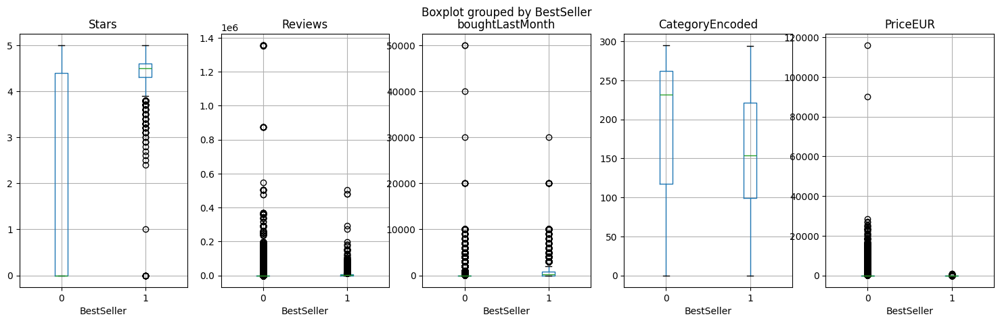

In [100]:
numeric_cols_name = 'Stars', 'Reviews', 'boughtLastMonth', 'CategoryEncoded', 'PriceEUR'

fig, ax = plt.subplots(nrows = 1, ncols = len(numeric_cols_name), figsize = (18,5))

for PredictorCol , i in zip(numeric_cols_name, range(len(numeric_cols_name))):
    df.boxplot(column = PredictorCol, by = 'BestSeller', figsize = (5, 5), vert = True, ax = ax[i])

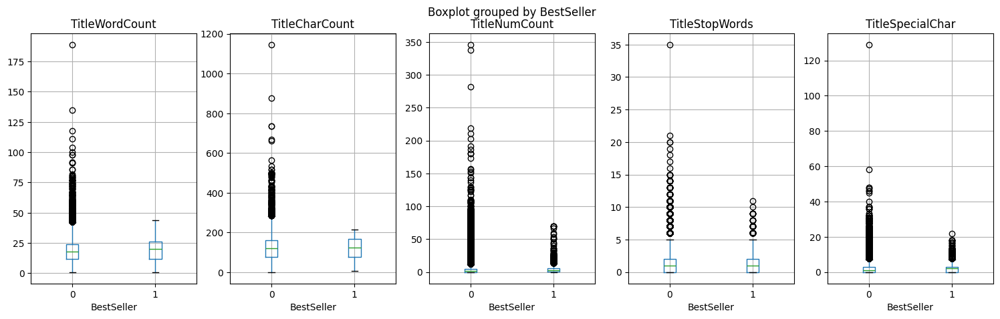

In [101]:
numeric_cols_name = 'TitleWordCount', 'TitleCharCount', 'TitleNumCount', 'TitleStopWords', 'TitleSpecialChar'

fig, ax = plt.subplots(nrows = 1, ncols = len(numeric_cols_name), figsize = (18, 5))

for PredictorCol , i in zip(numeric_cols_name, range(len(numeric_cols_name))):
    df.boxplot(column = PredictorCol, by = 'BestSeller', figsize = (5, 5), vert = True, ax = ax[i])

"These plots gives an idea about the data distribution of continuous predictor in the Y-axis for each of the category in the X-Axis.

If the distribution looks similar for each category(Boxes are in the same line), that means the the continuous variable has NO effect on the target variable. Hence, the variables are not correlated to each other." (Hashmi, 2021).

In this case, due to the number of points of outliers showing, it is not easy to make a first impression of it, so the ANOVA test would help to confirm the correlations between them.

### 3.14.2 Feature Selection - Categorical Target Vs Continuous Features using ANOVA test

Now, checking and confirming if there is any relationship between them using the ANOVA test. 
- "Assumption($H_0$): There is NO relation between the given variables, ANOVA Test result: Probability of $H_0$ being true" (Hashmi, 2021).

First, creating a function, getting three values: "`data, target and ContinuousPredictorList`" next, creating a list called "`selectedPredictors`" to save the results. 
Using a for-loop to check the list of Continous Predictor list, in this case, it will be 
the variable "`numeric_cols`" which has the feature names: 'Stars', 'Reviews', 'PriceGBP', 'boughtLastMonth', 'CategoryEncoded', 'PriceEUR', 'TitleWordCount', 'TitleCharCount', 'TitleNumCount', 'TitleStopWords', 'TitleSpecialChar', and it will be calculated feature by feature and getting the p-value of it, next it will check in an if condition, whether the p-value obtained from the ANOVA test is less than alpha value 0.5, in a positive case, it will reject the null hypothesis once there is evidence of a significant relationship, otherwise it will not reject the null hypothesis.

Next, it is being used the new function passes the values for data in the "`df`" dataset, target the "BestSeller" feature, and ContinuousPredictorList the list of continuous feature names in the variable numeric_cols. 

In [102]:
from scipy.stats import f_oneway

def FunctionAnova(data, target, ContinuousPredictorList):
    selectedPredictors = []
    
    print('ANOVA Results\n')
    for predictor in ContinuousPredictorList:
        CategoryGroupLists = data.groupby(target)[predictor].apply(list)
        results = f_oneway(*CategoryGroupLists)
        
        if (results[1] < 0.05):
            print(predictor, 'is correlated with', target, '| P-Value:', results[1])
            selectedPredictors.append(predictor)
        else:
            print(predictor, 'is NOT correlated with', target, '| P-Value:', results[1])
    return(selectedPredictors)

In [103]:
FunctionAnova(data = df, target = 'BestSeller', ContinuousPredictorList = numeric_cols)

ANOVA Results

Stars is correlated with BestSeller | P-Value: 0.0
Reviews is correlated with BestSeller | P-Value: 0.0
PriceEUR is correlated with BestSeller | P-Value: 1.2313628009413724e-52
BestSeller is correlated with BestSeller | P-Value: 0.0
boughtLastMonth is correlated with BestSeller | P-Value: 0.0
CategoryEncoded is correlated with BestSeller | P-Value: 5.859177953734799e-269
TitleWordCount is correlated with BestSeller | P-Value: 4.123803627266946e-26
TitleCharCount is correlated with BestSeller | P-Value: 1.1956542722615017e-05
TitleNumCount is NOT correlated with BestSeller | P-Value: 0.06067776050069144
TitleStopWords is correlated with BestSeller | P-Value: 6.1024320256705574e-167
TitleSpecialChar is correlated with BestSeller | P-Value: 2.6956644014842463e-67


['Stars',
 'Reviews',
 'PriceEUR',
 'BestSeller',
 'boughtLastMonth',
 'CategoryEncoded',
 'TitleWordCount',
 'TitleCharCount',
 'TitleStopWords',
 'TitleSpecialChar']

In this case, it will reject the null hypothesis once there is evidence of a significant relationship in the features: 'Stars', 'Reviews', 'PriceGBP', 'BestSeller', 'boughtLastMonth', 'CategoryEncoded', 'PriceEUR', 'TitleWordCount', 'TitleCharCount', 'TitleStopWords', 'TitleSpecialChar', and it will not reject the null hypothesis for the feature 'TitleNumCount'. 

Nonetheless, it will keep this feature "TitleNumCount" for future analyses once it is created in the **Feature Creation** task.

### 3.14.3 Relationship exploration - Target Vs Categorical Features - Bar Charts

Now, as the Target feature is categorical and there are Categorical features, it will use Bar Charts to visualise their respective distribution and relationship, and testing next with the Chi-Square test.

First, it getting the categorical feature names, next, using a "crosstab" to check the tabulation of the Categories by BestSeller, and used the cross table to visualise a bar plot between them.

In [104]:
categorical_cols = df.select_dtypes(include = ['object']).columns
categorical_cols

Index(['Asin', 'Title', 'imgUrl', 'productURL', 'Category'], dtype='object')

In [105]:
cross_tab = pd.crosstab(index = df['Category'], columns = df['BestSeller'])
cross_tab

BestSeller,0,1
Category,,
3D Printers,247,1
3D Printing & Scanning,4020,2
Abrasive & Finishing Products,245,5
Action Cameras,1014,0
Adapters,248,3
...,...,...
Wind Instruments,243,7
Window Treatments,234,5
Women,16101,183


Left the code commented below, once there are over 2 million observations and requires a lot of time to load, and will probably not gets an acceptable result, due to the amount of information.

In [106]:
# categorical_cols = df.select_dtypes(include = ['object']).columns

# fig, PlotCanvas = plt.subplots(nrows = len(categorical_cols), ncols = 1, figsize = (15, 60))

# for CategoricalCol, i in zip(categorical_cols, range(len(categorical_cols))):
#     cross_tab = pd.crosstab(index = df[CategoricalCol], columns = df['BestSeller'])
#     cross_tab.plot.bar(color = ['lightblue', 'lightgreen'], ax = PlotCanvas[i])

The results should be considered: "These grouped bar charts show the frequency in the Y-Axis and the category in the X-Axis. If the ratio of bars is similar across all categories, then the two columns are not correlated." (Hashmi, 2021).

In this case, due to the large number of data, it will be used Chi-Square test, to confirm the correlations between them.

### 3.14.4 Feature Selection - Categorical Target Vs Categorical Features using Chi-Square test

Now it will be similar to before, checking and confirming if there is any relationship between them using the Chi-Square test. 
- "Assumption($H_0$): The two columns are NOT related to each other. Result of Chi-Sq Test: The Probability of H0 being True" (Hashmi, 2021).

First, creating a function, getting three values: "`data, target and CategoricalVariablesList`" next, creating a list called "`SelectedPredictors`" to save the results. 
Using a for-loop to check the list of Categorical Predictor list, in this case, it will be the variable "`categorical_cols`" which has the feature names: 'Asin', 'Title', 'imgUrl', 'productURL', 'Category', and it will be calculated feature by feature and create a crosstab of it, next it will check in an if condition, whether the p-value obtained from the Chi-Square test is less than alpha value 0.5, in a positive case, it will reject the null hypothesis once there is evidence of a significant relationship, otherwise it will not reject the null hypothesis.

Next, it is being used the new function passes the values for data in the "`df`" dataset, target the "BestSeller" feature, and CategoricalVariablesList the list of categorical feature names in the variable categorical_cols.

In [107]:
from scipy.stats import chi2_contingency

def FunctionChisq(data, target, CategoricalVariablesList):
    SelectedPredictors = []

    print('Chi-Square Test Results\n')
    for predictor in CategoricalVariablesList:
        cross_tab = pd.crosstab(index = data[target], columns = data[predictor])
        ChiSqResult = chi2_contingency(cross_tab)
        
        if (ChiSqResult[1] < 0.05):
            print(predictor, 'is correlated with', target, '| P-Value:', ChiSqResult[1])
            SelectedPredictors.append(predictor)
        else:
            print(predictor, 'is NOT correlated with', target, '| P-Value:', ChiSqResult[1])        
            
    return(SelectedPredictors)

In [108]:
FunctionChisq(data = df, target = 'BestSeller', CategoricalVariablesList = categorical_cols)

Chi-Square Test Results

Asin is NOT correlated with BestSeller | P-Value: 0.4996846453066547
Title is correlated with BestSeller | P-Value: 0.0
imgUrl is correlated with BestSeller | P-Value: 0.0
productURL is NOT correlated with BestSeller | P-Value: 0.4996846453066547
Category is correlated with BestSeller | P-Value: 0.0


['Title', 'imgUrl', 'Category']

In this case, it will reject the null hypothesis once there is evidence of a significant relationship in the features: 'Title', 'imgUrl', 'Category', and it will not reject the null hypothesis for the feature 'Asin', 'productURL'.

Nonetheless, it could also not reject the null hypothesis for the feature '`imgUrl`', once their are similar to '`productURL`' with URL values.

After analysis, it will reject the null hypothesis once there is evidence of a significant relationship to the following features: 
- Numerical features: 'Stars', 'Reviews', 'PriceGBP', 'BestSeller', 'boughtLastMonth', 'CategoryEncoded', 'PriceEUR', 'TitleWordCount', 'TitleCharCount', 'TitleStopWords', 'TitleSpecialChar', 'TitleNumCount'
- Categorical features: 'Title', 'imgUrl', 'Category'

## 3.15 Feature Extraction

Next, Feature Extraction opted to use LDA (Linear Discriminant Analysis), which returns the number of best features to be used, compared to PCA which needs to use the Elbow technique to analyse the best number of features that should be chosen.

### 3.15.1 LDA (Linear Discriminant Analysis)

First creating a new data frame named "`df_feature_selection`" from "`df`" and encoding the categorical features: "`Asin, Title, imgUrl, productURL and Category`" to use in the LDA algorithm.  

In [109]:
df.columns

Index(['Asin', 'Title', 'imgUrl', 'productURL', 'Stars', 'Reviews', 'PriceEUR',
       'BestSeller', 'boughtLastMonth', 'Category', 'CategoryEncoded',
       'TitleWordCount', 'TitleCharCount', 'TitleNumCount', 'TitleStopWords',
       'TitleSpecialChar'],
      dtype='object')

In [110]:
df_feature_selection = df.copy()

In [111]:
encoder_Asin = LabelEncoder()
df_feature_selection['Asin'] = encoder_Asin.fit_transform(df_feature_selection['Asin'])

encoder_Title = LabelEncoder()
df_feature_selection['Title'] = encoder_Title.fit_transform(df_feature_selection['Title'])

encoder_imgUrl = LabelEncoder()
df_feature_selection['imgUrl'] = encoder_imgUrl.fit_transform(df_feature_selection['imgUrl'])

encoder_productURL = LabelEncoder()
df_feature_selection['productURL'] = encoder_productURL.fit_transform(df_feature_selection['productURL'])

encoder_Category = LabelEncoder()
df_feature_selection['Category'] = encoder_Category.fit_transform(df_feature_selection['Category'])

,Asin,Title,imgUrl,productURL,Stars,Reviews,PriceEUR,BestSeller,boughtLastMonth,Category,CategoryEncoded,TitleWordCount,TitleCharCount,TitleNumCount,TitleStopWords,TitleSpecialChar
Asin,1.000000,0.016684,-0.100267,1.000000,-0.596694,-0.079293,0.086731,-0.042669,-0.077085,0.225275,0.225275,0.307572,0.363002,-0.031329,0.064329,-0.045810
Title,0.016684,1.000000,0.015745,0.016684,-0.020599,0.000091,0.002511,-0.003117,-0.009496,0.052125,0.052125,-0.006543,0.000519,-0.070908,-0.004764,-0.018824
imgUrl,-0.100267,0.015745,1.000000,-0.100267,0.207304,0.032745,-0.056383,0.017675,0.042203,-0.045137,-0.045137,0.047164,0.024769,-0.031115,0.078730,0.015509
productURL,1.000000,0.016684,-0.100267,1.000000,-0.596694,-0.079293,0.086731,-0.042669,-0.077085,0.225275,0.225275,0.307572,0.363002,-0.031329,0.064329,-0.045810
Stars,-0.596694,-0.020599,0.207304,-0.596694,1.000000,0.085124,-0.122505,0.056826,0.106259,-0.294748,-0.294748,-0.061877,-0.122996,0.088701,0.108729,0.095657
Reviews,-0.079293,0.000091,0.032745,-0.079293,0.085124,1.000000,-0.012482,0.061835,0.095229,-0.039215,-0.039215,0.005580,-0.002229,0.016949,0.025300,0.029392
PriceEUR,0.086731,0.002511,-0.056383,0.086731,-0.122505,-0.012482,1.000000,-0.010241,-0.021390,0.029695,0.029695,0.027461,0.042332,0.077172,-0.034400,0.047179
BestSeller,-0.042669,-0.003117,0.017675,-0.042669,0.056826,0.061835,-0.010241,1.000000,0.222299,-0.023498,-0.023498,0.007089,0.002937,0.001258,0.018470,0.011625
boughtLastMonth,-0.077085,-0.009496,0.042203,-0.077085,0.106259,0.095229,-0.021390,0.222299,1.000000,-0.045713,-0.045713,0.018369,0.006423,0.004282,0.040355,0.020753
Category,0.225275,0.052125,-0.045137,0.225275,-0.294748,-0.039215,0.029695,-0.023498,-0.045713,1.000000,1.000000,-0.031040,0.017322,-0.150921,-0.078722,-0.077251


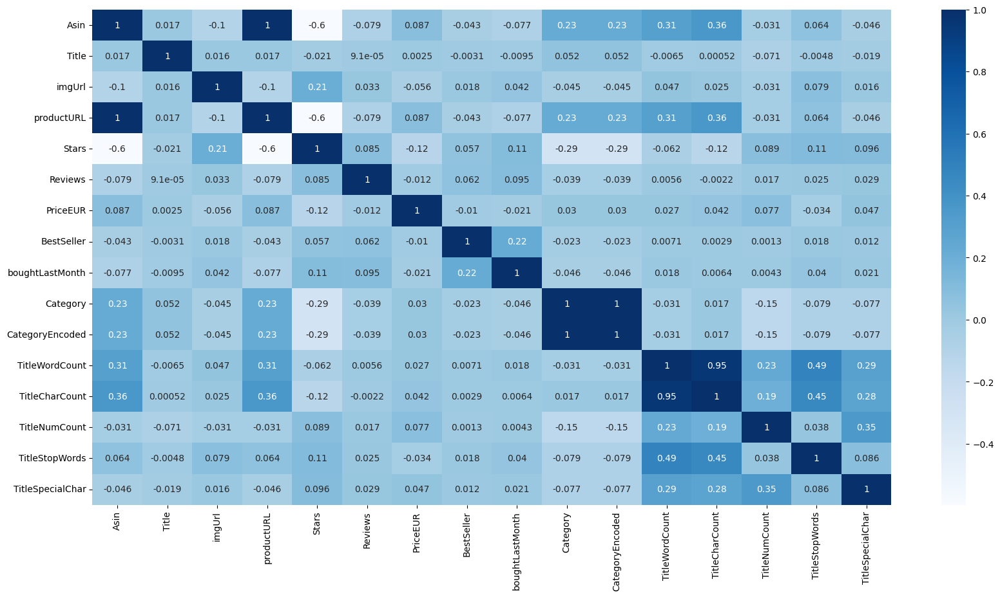

In [112]:
numeric_cols = df_feature_selection.select_dtypes(include = ['number'])

plt.figure(figsize = (20, 10))
correlation_matrix = numeric_cols.corr()

sns.heatmap(correlation_matrix, cmap = "Blues", annot = True);
correlation_matrix

First, splitting the features into X and y to transform, train and test, "`X`" by getting the features "`'Asin', 'Title', 'imgUrl', 'productURL' 'Stars', 'Reviews', 'boughtLastMonth', 'Category', 'CategoryEncoded', 'PriceEUR', 'TitleWordCount', 'TitleCharCount', 'TitleNumCount', 'TitleStopWords', 'TitleSpecialChar'`" and "`y`" variable the feature "`BestSeller`" as a Target.

In [113]:
X = df_feature_selection.drop(df_feature_selection[["BestSeller"]], axis = 1)
y = df_feature_selection["BestSeller"].copy()

Importing the method “`LinearDiscriminantAnalysis`” from "sklearn.discriminant_analysis" in “3.15.1 topic”. Next creating the variable "lda" to get the LinearDiscriminantAnalysis method and transforming "`X`" and "`y`" in a new variable named "`X_lda`".

Next, getting the "`shape`" of the new data frame "`X_lda`" after transforming and also the original data frame "`df_feature_selection`", in this case, both have the same quantity of observations 2222742 and after transform from 17 features in total it was reduced in just 1 and showing the "explained_variance_ratio_" of the feature.

In [114]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis()
X_lda = lda.fit_transform(X, y)

In [115]:
X_lda.shape, df_feature_selection.shape

((2222742, 1), (2222742, 16))

In [116]:
lda.explained_variance_ratio_

array([1.])

Importing the method “`train_test_split`” from "sklearn.model_selection" in “3.15.1 topic”.
Creating the variables "`X_train, X_test, y_train, y_test`", for training and testing the model, choosing 25% of the data for testing with a set random_state = 43 and 75% of the data for training.

75% Training, 25% Test

In [117]:
from sklearn.model_selection import train_test_split  

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 43) 

Importing the method “`DecisionTreeClassifier`” and "`confusion_matrix`" from "sklearn tree and metrics" in “3.15.1 topic”. Next using "`DecisionTreeClassifier`" to fit and create a prediction using a "`Confusion Matrix`" also plotted a "`heatmap`" to get a visualisation of it.

In [118]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix

dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[552552,   1636],
       [  1291,    207]])

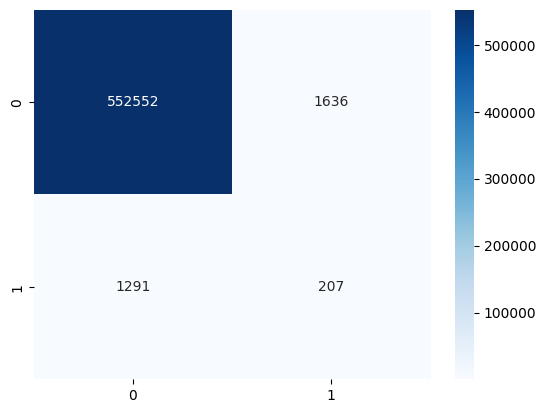

In [119]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot = True, fmt = 'd', cmap = "Blues");

Next, creating a new data frame named "`df_lda`" with the columns obtained from the LDA algorithm, also creating the columns with a for loop learned in the website "geeksforgeeks.org" article "Principal Component Analysis(PCA)", "PCA using Using Sklearn" (GeeksforGeeks, 2018b), printing the new Data Frame and comparing the shape of "`df_lda`" and "`df_feature_selection`" Data Frames.

In [120]:
n_components = X_lda.shape[1]
df_lda = pd.DataFrame(X_lda, columns=['LDA{}'.format(i + 1) for i in range(n_components)])
print(df_lda)

             LDA1
0        0.604212
1        3.585056
2        0.601772
3        0.348334
4        0.117073
...           ...
2222737 -0.237119
2222738 -0.145179
2222739 -0.153120
2222740  0.107213
2222741  0.011608

[2222742 rows x 1 columns]


In [121]:
df_lda.shape, df_feature_selection.shape

((2222742, 1), (2222742, 16))

4. Train a model to predict and improve sales.

Next, creating a new feature whose name is "`BestSeller`" copying from the original data frame "`df_feature_selection`" and getting the Head of it.

In [122]:
df_lda["BestSeller"] = df_feature_selection["BestSeller"].copy()

In [123]:
df_lda.head()

,LDA1,BestSeller
0,0.604212,0
1,3.585056,1
2,0.601772,0
3,0.348334,0
4,0.117073,0


Creating an array variable to copy all ".values" from the data frame "`df_lda`" for use in Machine Learning tests and training. Next, creating the variables "`X`" and "`y`", X for getting the features (Independent variables) and y for getting the feature Target for the prediction, creating the variables "`X_train, X_test, y_train and y_test`", for training and testing the model, choosing 30% of the data for testing with a set random_state = 43 and 70% of the data for training.

70% Training, 30% Test.

In [124]:
df_array = df_lda.values

In [125]:
X = df_array[:, 0:1].copy()
y = df_array[:, 1].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43)

Importing the method “`KNeighborsClassifier, GaussianNB, SVC, RandomForestClassifier, MLPClassifier and LogisticRegression`" from "sklearn neighbors, naive_bayes, svm, ensemble, neural_network and linear_model" in “3.15.1 topic”. Next, creating an empty list whose name is models to save the models and using ".append" method to add a short description and model itself.

In [126]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

*If needed to run this document faster, add a comment on the lines below as an example:

``` python
# models.append(('NB', GaussianNB()))
# models.append(('SVM', SVC(gamma = 'auto')))
# models.append(('RFC', RandomForestClassifier()))
# models.append(('ANN', MLPClassifier()))
```

In [127]:
models = []
models.append(('LR', LogisticRegression(solver = 'liblinear', multi_class = 'ovr')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
# models.append(('NB', GaussianNB()))
# models.append(('SVM', SVC(gamma = 'auto')))
# models.append(('RFC', RandomForestClassifier()))
# models.append(('ANN', MLPClassifier()))

Importing the method “`cross_val_score and StratifiedKFold`" from "sklearn.model_selection" in “3.15.1 topic”. Next, creating two empty lists whose names are "results" and "names", next, using a for loop for each "name" and "model" in "models".

Using "StratifiedKFold and cross_val_score" to split, random state, shuffle and do a cross with the X_train and y_train variables to train and get a scoring, also adding the results in results and names.

Next, print the short description of the function's name, the mean of the results and the standard deviation of them.

In [128]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

In [129]:
results = []
names = []
for name, model in models:
    kfold = StratifiedKFold(n_splits = 10, random_state = 33, shuffle = True)
    cv_results = cross_val_score(model, X_train, y_train, cv = kfold, scoring = 'accuracy')
    results.append(cv_results)
    names.append(name)
    print('%s: %f (%f)' % (name, cv_results.mean(), cv_results.std()))
    
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43)

LR: 0.997231 (0.000042)
LDA: 0.992467 (0.000274)
KNN: 0.997168 (0.000035)
CART: 0.995053 (0.000078)


Results: 

- LR: 0.997231 (0.000042)
- LDA: 0.992467 (0.000274)
- KNN: 0.997168 (0.000035)
- CART: 0.995053 (0.000078)
- NB: 0.992467 (0.000276)
- SVM: 0.997279 (0.000019)
- RFC: 0.995099 (0.000123)
- ANN: 0.997281 (0.000006)


GaussianNB, SVC, RandomForestClassifier and MLPClassifier getting lots time. 

The "boxplot" below shows in the graphic the difference scale between the Algorithm Comparison.

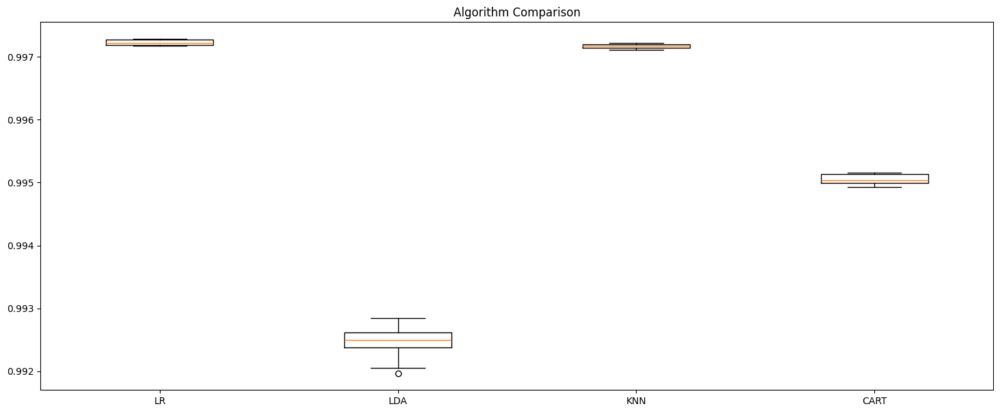

In [130]:
plt.figure(figsize = (18, 7))
plt.boxplot(results, labels = names)
plt.title('Algorithm Comparison')
plt.show()

Next, getting the results using the algorithm "`LR - Logistic Regression`" to get the percentage of predictions in this model.

In [131]:
model = LogisticRegression(solver = 'liblinear', multi_class = 'ovr')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

Importing the method “`accuracy_score and classification_report`" from "sklearn.metrics" library in “3.15.1 topic”. Next getting the Classification Report to get informations "precision, recall, f1-score, support, accuracy, macro avg and weighted avg" results, next a Confusion Matrix of the model and the Accuracy Score of the model, and plotting a "heatmap" of the Confusion Matrix results. 

In [132]:
from sklearn.metrics import accuracy_score, classification_report

In [133]:
print("Classification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.2f} \n")

Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    665037
         1.0       0.50      0.05      0.09      1786

    accuracy                           1.00    666823
   macro avg       0.75      0.52      0.54    666823
weighted avg       1.00      1.00      1.00    666823


Confusion Matrix:
 [[664954     83]
 [  1703     83]]

Accuracy: 1.00 



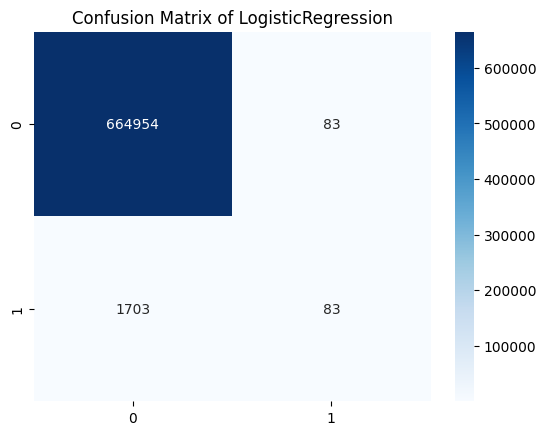

In [134]:
plt.title('Confusion Matrix of LogisticRegression', fontsize = 12)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot = True, fmt = 'd', cmap = "Blues");
plt.show()

# 4. Machine Learning - Supervised

For this step of Machine Learning it will be loading the data once again, but in this time with a short amount of observations set in "2.2 Loading Data" where choosing **5000** observations as a sample to use in this project once 2 million is too large and requires plenty of time to run the algorithms and sometimes it crashes.

Next, applying the essential techniques to use the dataset properly such as: Loading the data, renaming the features, converting pounds to euro, renaming the price feature, encoding: "Asin, imgUrl and productURL" and changing the "BestSeller" feature from boolean to int change the values False and True to 0 and 1, running in **0.04** seconds.

In [135]:
start_time = time.time()

df = pd.read_csv("amz_uk_processed_data.csv",
                 nrows = num_rows)

df = df.rename(columns = {'asin': 'Asin', 'title': 'Title', 'stars': 'Stars', 'reviews': 'Reviews', 'price': 'PriceGBP', 'isBestSeller': 'BestSeller', 'boughtInLastMonth': 'boughtLastMonth', 'categoryName': 'Category'})

df["PriceGBP"] = df["PriceGBP"] * 1.16
df = df.rename(columns = {'PriceGBP': 'PriceEUR'})

encoder_Asin = LabelEncoder()
df['Asin'] = encoder_Asin.fit_transform(df['Asin'])

encoder_imgUrl = LabelEncoder()
df['imgUrl'] = encoder_imgUrl.fit_transform(df['imgUrl'])

encoder_productURL = LabelEncoder()
df['productURL'] = encoder_productURL.fit_transform(df['productURL'])

df['BestSeller'].replace(False, 0, inplace = True)
df['BestSeller'].replace(True, 1, inplace = True)

end_time = time.time()

print("Calculated in {:.2f} seconds.".format(end_time - start_time))

Calculated in 0.20 seconds.


After analysis with ANOVA Test, it will reject the null hypothesis once there is evidence of a significant relationship to the following features: 'Stars', 'Reviews', 'PriceEUR', 'BestSeller', 'boughtLastMonth', after Chi-Square Test Results: 'Title', 'Category', and it will used in the next steps on Machine Learning.

It will not be considered: 'Asin', 'imgUrl', 'productURL', also the features created in steps before: 'CategoryEncoded', 'TitleWordCount', 'TitleCharCount', 'TitleNumCount', 'TitleStopWords' and 'TitleSpecialChar'.

There is no need to get nominal features once it is going to be encoded, also, there is no need to create new numeric features using dummies.

Create a new list to save the feature names, called "`selectedColumns`", next created a new data frame to use in Machine Learning algorithms from the original "`df`" data frame whose name is "`df_ML`" and get the Head of it.

In [136]:
df.head(3)

,Asin,Title,imgUrl,productURL,Stars,Reviews,PriceEUR,BestSeller,boughtLastMonth,Category
0,1666,"Echo Dot (5th generation, 2022 release) | Big ...",2508,1666,4.7,15308,25.5084,0,0,Hi-Fi Speakers
1,280,"Anker Soundcore mini, Super-Portable Bluetooth...",1798,280,4.7,98099,27.8284,1,0,Hi-Fi Speakers
2,1664,"Echo Dot (5th generation, 2022 release) | Big ...",1948,1664,4.7,15308,25.5084,0,0,Hi-Fi Speakers


In [137]:
selectedColumns = ['Title', 'Stars', 'Reviews', 'PriceEUR', 'BestSeller', 'boughtLastMonth', 'Category']

In [138]:
df_ML = df[selectedColumns].copy()
df_ML.head(2)

,Title,Stars,Reviews,PriceEUR,BestSeller,boughtLastMonth,Category
0,"Echo Dot (5th generation, 2022 release) | Big ...",4.7,15308,25.5084,0,0,Hi-Fi Speakers
1,"Anker Soundcore mini, Super-Portable Bluetooth...",4.7,98099,27.8284,1,0,Hi-Fi Speakers


Encoded the "`Title`" feature using "LabelEncoder()" and getting the Head of it. 

In [139]:
encoder_Title = LabelEncoder()
df_ML['Title'] = encoder_Title.fit_transform(df_ML['Title'])

encoder_Category = LabelEncoder()
df_ML['Category'] = encoder_Category.fit_transform(df_ML['Category'])

In [140]:
df_ML.head(2)

,Title,Stars,Reviews,PriceEUR,BestSeller,boughtLastMonth,Category
0,1454,4.7,15308,25.5084,0,0,1
1,198,4.7,98099,27.8284,1,0,1


## 4.1 Logistic Regression

4. Train a model to predict and improve sales.

First, splitting the features into `X and y` to transform, train and test, "`X`" by getting all features except "`BestSeller`" and "`y`" variable the feature "`BestSeller`" as a Target.

In [141]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

Next, transform all numerical features, to get a better distribution ande performance in the algorithms using "`RobustScaler()`" as chosen and tested in tasks before. 
Next, creating the variables "`X_train, X_test, y_train and y_test`", for training and testing the model, choosing 30% of the data for testing with a set random_state = 43 and 70% of the data for training.

70% Training, 30% Test.

In [142]:
scaler = preprocessing.RobustScaler()

X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

First, testing with the "`Logistic Regression`" Machine Learning algorithm once got good results before using LDA.

Next, creating the variable "`lr`" to get the "`LogisticRegression`" method, with the parameters: C = 1, penalty = 'l2' and solver = 'newton-cg', next fitting into `X_train and y_train` and getting a prediction of "`X_test`" to "`y_pred`". 

In [143]:
lr = LogisticRegression(C = 1, penalty = 'l2', solver = 'newton-cg')

lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

Importing the method “`ConfusionMatrixDisplay`" from "sklearn.metrics" library in “4.1.1 topic”. Next, getting the Classification Report to get information on "`precision, recall, f1-score, support, accuracy, macro avg and weighted avg`" results, next a Confusion Matrix of the model and the Accuracy Score of the model, and plotting a "ConfusionMatrixDisplay" of the Confusion Matrix results.

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1495
           1       0.00      0.00      0.00         5

    accuracy                           1.00      1500
   macro avg       0.50      0.50      0.50      1500
weighted avg       0.99      1.00      1.00      1500


Accuracy: 1.00 


Confusion Matrix:
 [[1495    0]
 [   5    0]]


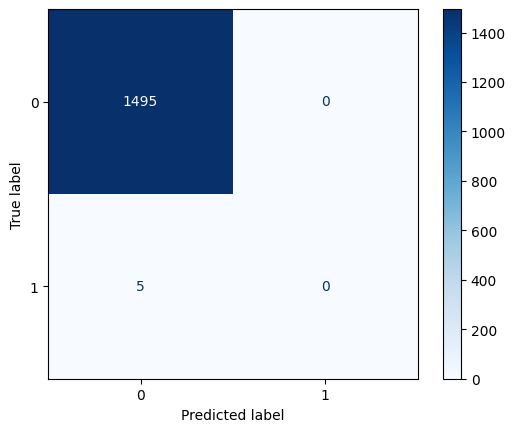

In [144]:
from sklearn.metrics import ConfusionMatrixDisplay

print("Classification Report:\n", classification_report(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.2f} \n")

print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels = lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = lr.classes_)
disp.plot(cmap = "Blues")
disp.ax_.grid(False)
plt.show()

Importing the method “`ConfusionMatrix`" from "yellowbrick.classifier" library in “4.1 topic”, to create a Confusion Matrix labelled and easier to understand the results, with True and False Positives and True and False Negatives. 

In [145]:
from yellowbrick.classifier import ConfusionMatrix

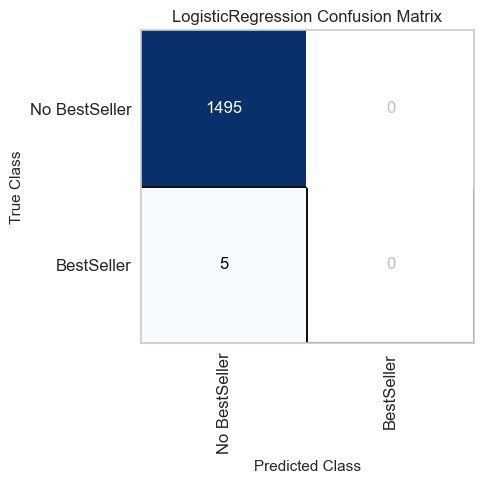

In [146]:
mapping = {0: "No BestSeller", 1: "BestSeller"}

fig, ax = plt.subplots(figsize = (5, 5))
cm_viz = ConfusionMatrix(lr, classes = ["No BestSeller", "BestSeller"], cmap = "Blues")
cm_viz.score(X_test, y_test)
cm_viz.poof();

Next creating a "`Confusion Matrix`" table labelled and easier to understand the results.

In [147]:
pd.DataFrame(confusion_matrix(y_test, lr.predict(X_test)), 
             columns = ["Predict no BestSeller", "Predict BestSeller"],
             index = ["True BestSeller", "False BestSeller"],)

,Predict no BestSeller,Predict BestSeller
True BestSeller,1495,0
False BestSeller,5,0


Importing the method “`ClassificationReport`" from "yellowbrick.classifier" library in “4.1.1 topic”, to create a Classification Report labelled and easier to understand the results of Precision, Recall and f1-score.

In [148]:
from yellowbrick.classifier import ClassificationReport

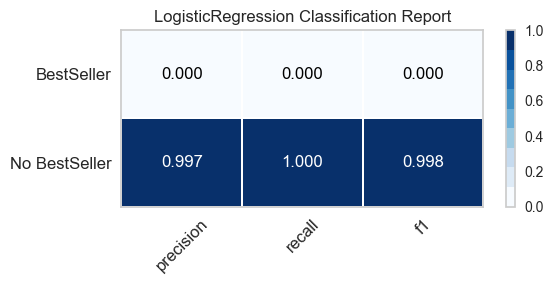

In [149]:
fig, ax = plt.subplots(figsize = (6, 3))
cm_viz = ClassificationReport(lr, classes = ["No BestSeller", "BestSeller"], label_encoder = mapping, cmap = "Blues")
cm_viz.score(X_test, y_test)
cm_viz.poof();

Importing the method “`ClassPredictionError`" from "yellowbrick.classifier" library in “4.1.1 topic”, to create a Class Prediction Error labelled and easier to understand the results.

In [150]:
from yellowbrick.classifier import ClassPredictionError

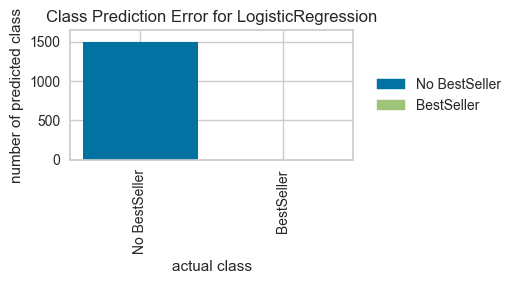

In [151]:
fig, ax = plt.subplots(figsize = (6, 3))

cpe_viz = ClassPredictionError(lr, classes = ["No BestSeller", "BestSeller"])

cpe_viz.score(X_test, y_test)
cpe_viz.poof();

Importing the method “`ROCAUC`" from "yellowbrick.classifier" library in “4.1.1 topic”, to create a ROC AUC Graphic labelled and easier to understand the results of the ROC Currver for Logistic Regression.

In [152]:
from yellowbrick.classifier import ROCAUC

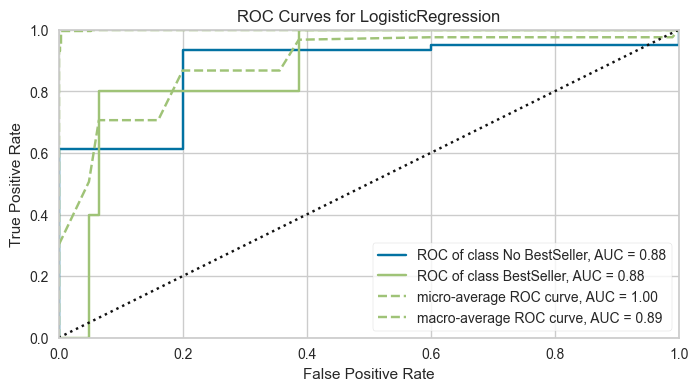

In [153]:
visualizer = ROCAUC(lr, classes = ["No BestSeller", "BestSeller"])

fig, ax = plt.subplots(figsize = (8, 4))
visualizer.fit(X_train, y_train)     
visualizer.score(X_test, y_test)     
visualizer.show(); 

Importing the method “`ClassBalance`" from "yellowbrick.classifier" library in “4.1 topic”, to create a Class Balance Visual labelled and easier to understand the difference between No BestSeller and BestSeller.

In [154]:
from yellowbrick.classifier import ClassBalance

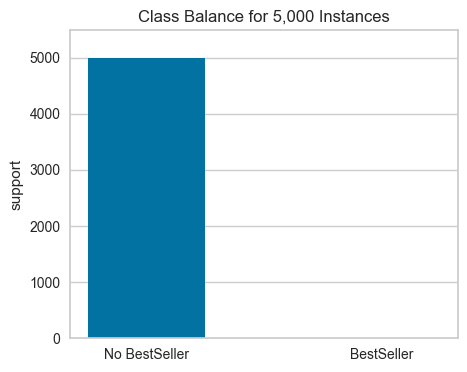

In [155]:
fig, ax = plt.subplots(figsize = (5, 4))

cb_viz = ClassBalance(
    labels = ["No BestSeller", "BestSeller"])

cb_viz.fit(y)
cb_viz.poof();

### 4.1.1 Logistic Regression - LIME

Next, using LIME to attempt an interpretation of the algorithm model. Learned from "datacamp" website, "Explainable AI - Understanding and Trusting Machine Learning Models" (Keita, 2023).

"Local Interpretable Model-agnostic Explanations (LIME for short). Instead of providing a global understanding of the model on the entire dataset, LIME focuses on explaining the model’s prediction for individual instances.

LIME explainer can be set up using two main steps: (1) import the lime module, and (2) fit the explainer using the training data and the targets. During this phase, the mode is set to classification, which corresponds to the task being performed." (Keita, 2023).

First pip install of "`lime`" dependences, next split the data in "`X ans y`" creating a "LogisticRegression" model to train, test and predict, getting the R2 Score as **0.996**.

In [156]:
# pip install lime

In [157]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

lr = LogisticRegression(C = 1, penalty = 'l2', solver = 'newton-cg', random_state = 43)

lr.fit(X_train, y_train)

print('R2 score for the model on test set =', lr.score(X_test, y_test))

R2 score for the model on test set = 0.9966666666666667


Importing "`lime_tabular`" from "`lime`" in "4.1 topic". Next, get the class names and fit the explainer on the training data set using LIME.

In [158]:
from lime import lime_tabular

In [159]:
class_names = ['BestSeller', 'No BestSeller']

explainer_lime = lime_tabular.LimeTabularExplainer(X_train, 
                  feature_names = X.columns, verbose = True, 
                  class_names = class_names, mode = 'classification')

Creating the variable "i" to pass the number of random_state, in this case, **43**, and the variable "k" to the Number denoting the top features, in this case, tested with **1667** values. Next plotting the explanations using a notebook.

In [160]:
i = 43
k = 1667

In [161]:
exp = explainer_lime.explain_instance(X_test[i], lr.predict_proba, num_features = k)
exp.show_in_notebook()

Intercept 0.001993025883477004
Prediction_local [0.00033447]
Right: 0.0005327187463657292


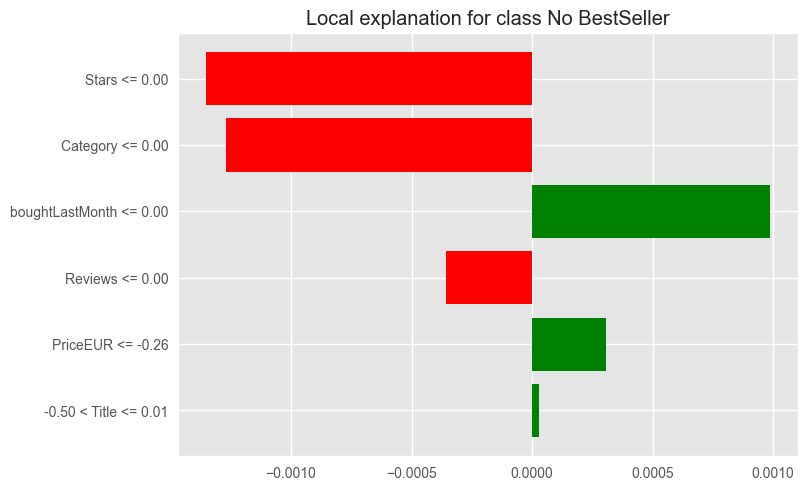

In [162]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

"The result contains three main pieces of information from left to right: (1) the model’s predictions, (2) features contributions, and (3) the actual value for each feature." (Keita, 2023).

## 4.2 Decision Tree Classifier

Second, testing with the "Decision Tree" Machine Learning algorithm.

Just so as not to mess up the results and tests, starting over again splitting the features into `X and y` to transform, train and test, "`X`" by getting all features except "`BestSeller`" and "`y`" variable the feature "`BestSeller`" as a Target, not transforming the features, and creating the variables "`X_train, X_test, y_train and y_test`", for training and testing the model, choosing 30% of the data for testing with a set random_state = 42 and 70% of the data for training.  

In [163]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Next, creating the variable "`dt`" to get the "`DecisionTreeClassifier`" method, with the parameters: max_depth = 2 and criterion = 'entropy', next fitting into `X_train and y_train` and getting a prediction of "`X_test`" to "`y_pred`". 

In [164]:
dt = DecisionTreeClassifier(max_depth = 2, criterion = 'entropy')

dt = dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)

Next, getting the Classification Report to get information on "`precision, recall, f1-score, support, accuracy, macro avg and weighted avg`" results, next a Confusion Matrix of the model and the Accuracy Score of the model, and plotting a "ConfusionMatrixDisplay" of the Confusion Matrix results.

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1495
           1       0.00      0.00      0.00         5

    accuracy                           1.00      1500
   macro avg       0.50      0.50      0.50      1500
weighted avg       0.99      1.00      1.00      1500


Accuracy: 1.00 


Confusion Matrix:
 [[1495    0]
 [   5    0]]


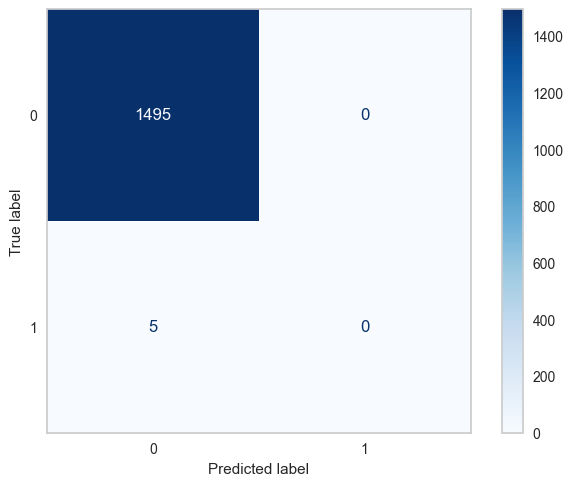

In [165]:
print("Classification Report:\n", classification_report(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.2f} \n")

print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels = dt.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = dt.classes_)
disp.plot(cmap = "Blues")
disp.ax_.grid(False)
plt.show()

Importing the method “`plot_tree`" from "sklearn.tree" library in “4.1.2 topic”, to plot a tree to get two nodes as determined before in max_depth = 2 from the Decision Tree.

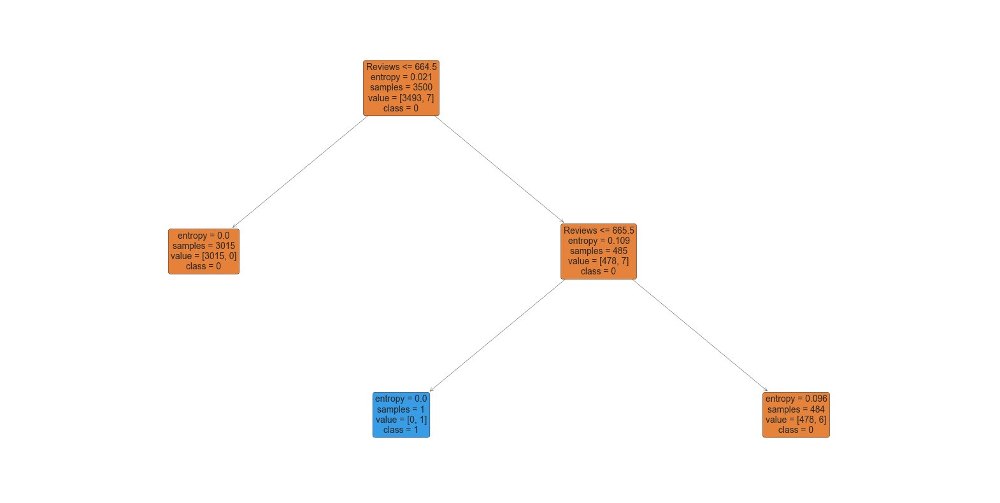

In [166]:
from sklearn.tree import plot_tree 

plt.figure(figsize = (20, 10))
plot_tree(dt, filled = True, feature_names = X.columns.tolist(), class_names = [str(label) for label in df_ML["BestSeller"].unique()], rounded = True, fontsize = 10)
plt.show()

### 4.2.1 Decision Tree Classifier - LIME

Next split the data in "X ans y" creating a "DecisionTreeClassifier" model to train, test and predict, getting the R2 Score as **0.995**.

In [167]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

dt = DecisionTreeClassifier(max_depth = 3, random_state = 43)

dt.fit(X_train, y_train)

print('R2 score for the model on test set =', dt.score(X_test, y_test))

R2 score for the model on test set = 0.9953333333333333


Next, get the class names and fit the explainer on the training data set using LIME.

In [168]:
class_names = ['BestSeller', 'No BestSeller']

explainer_lime = lime_tabular.LimeTabularExplainer(X_train.values, 
                  feature_names = X.columns, verbose = True, 
                  class_names = class_names, mode = 'classification')

Creating the variable "i" to pass the number of random_state, in this case, **43**, and the variable "k" to the Number denoting the top features, in this case, tested with **1667** values. Next plotting the explanations using a notebook.

In [169]:
i = 43
k = 1667

In [170]:
exp = explainer_lime.explain_instance(X_test.iloc[i].values, dt.predict_proba, num_features = k)
exp.show_in_notebook()

Intercept 0.005941778585811661
Prediction_local [0.00106964]
Right: 0.0


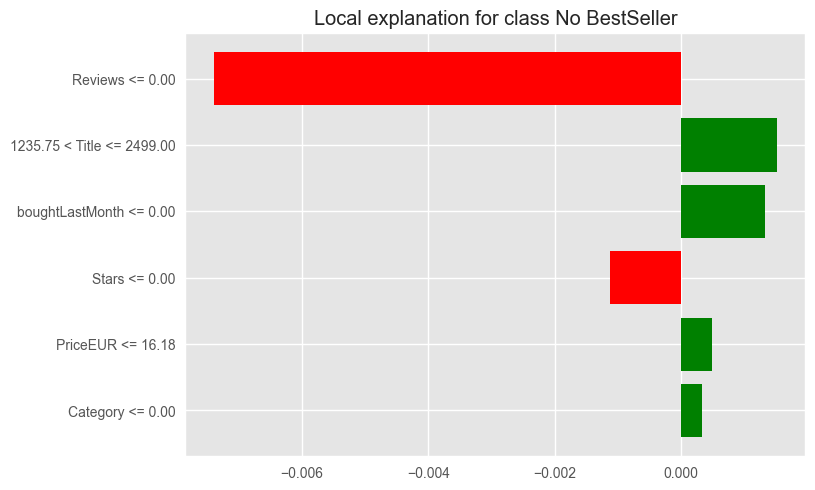

In [171]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

## 4.3 Random Forest Classifier

Third, testing with the "Random Forest" Machine Learning algorithm.

Just so as not to mess up the results and tests, starting over again splitting the features into `X and y` to transform, train and test, "`X`" by getting all features except "`BestSeller`" and "`y`" variable the feature "`BestSeller`" as a Target, not transforming the features, and creating the variables "`X_train, X_test, y_train and y_test`", for training and testing the model, choosing 30% of the data for testing with a set random_state = 43 and 70% of the data for training. 

In [172]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Next, creating the variable "`rf`" to get the "`RandomForestClassifier`" method, with the parameters: n_estimators = 100, next fitting into `X_train and y_train` and getting a prediction of "`X_test`" to "`y_pred`".

In [173]:
rfc = RandomForestClassifier(n_estimators = 100)

rfc.fit(X_train, y_train)

y_pred = rfc.predict(X_test)

Next, getting the Classification Report to get information on "`precision, recall, f1-score, support, accuracy, macro avg and weighted avg`" results, next a Confusion Matrix of the model and the Accuracy Score of the model, and plotting a "ConfusionMatrixDisplay" of the Confusion Matrix results.

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1495
           1       0.00      0.00      0.00         5

    accuracy                           1.00      1500
   macro avg       0.50      0.50      0.50      1500
weighted avg       0.99      1.00      0.99      1500


Accuracy: 1.00 


Confusion Matrix:
 [[1494    1]
 [   5    0]]


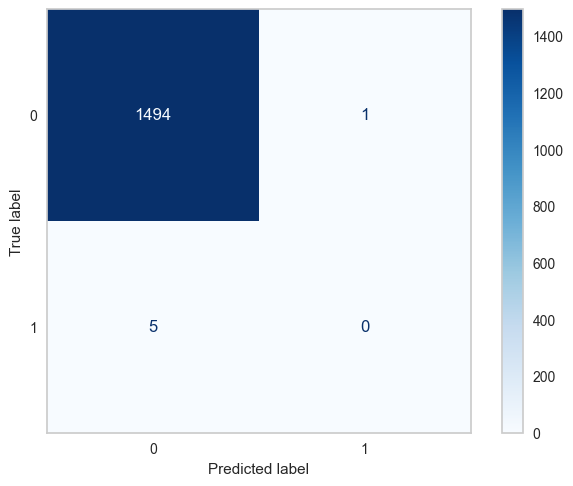

In [174]:
print("Classification Report:\n", classification_report(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.2f} \n")

print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels = rfc.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = rfc.classes_)
disp.plot(cmap = "Blues")
disp.ax_.grid(False)
plt.show()

Importing the method “`tree`" from "sklearn" library in “4.1.3 topic”, to plot "plot a first Decision Tree from the Random Forest (with index 0 in the list)" (Płoński, 2020).

In [175]:
from sklearn import tree

The command below were left commented and an image below it to visually the results.

In [176]:
# plt.figure(figsize = (20, 20))
# _ = tree.plot_tree(rfc.estimators_[0], feature_names = X.columns, filled = True)

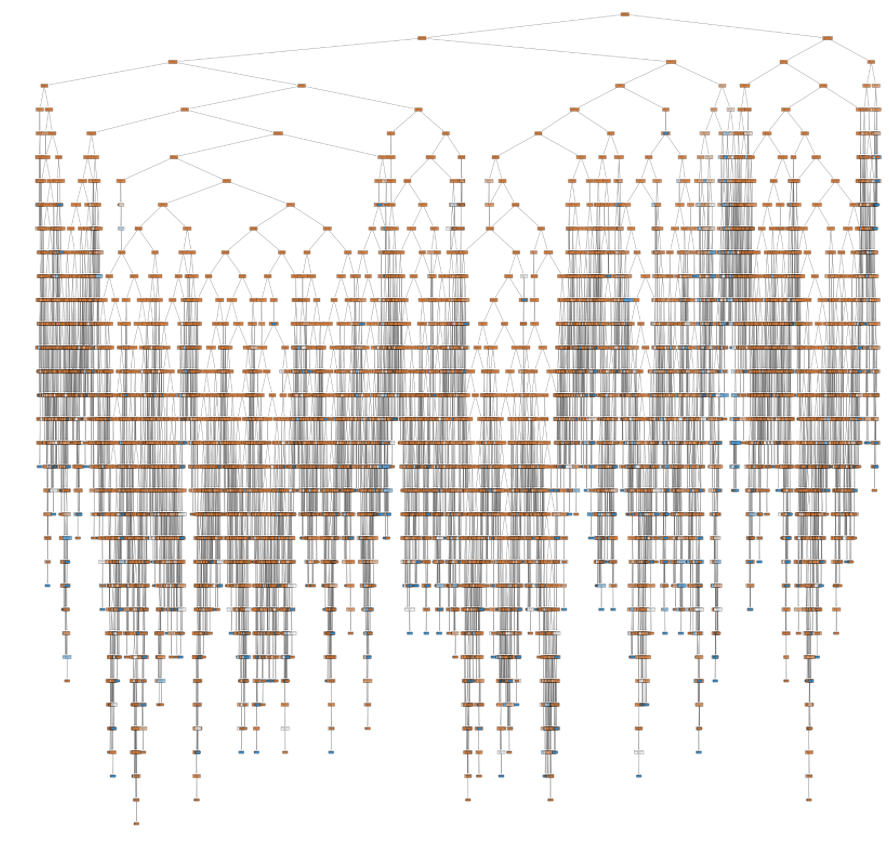

Next "check the depth of the first tree from the Random Forest:" (Płoński, 2020)

In [177]:
rfc.estimators_[0].tree_.max_depth

9

### 4.3.1 Random Forest Classifier - LIME

Getting the R2 Score as **0.996**.

In [178]:
print('R2 score for the model on test set =', rfc.score(X_test, y_test))

R2 score for the model on test set = 0.996


Next, get the class names and fit the explainer on the training data set using LIME.

In [179]:
class_names = ['BestSeller', 'No BestSeller']

explainer_lime = lime_tabular.LimeTabularExplainer(X_train.values, 
                  feature_names = X.columns, verbose = True, 
                  class_names = class_names,mode = 'classification')

Creating the variable "i" to pass the number of random_state, in this case, **43**, and the variable "k" to the Number denoting the top features, in this case, tested with **1667** values. Next plotting the explanations using a notebook.

In [180]:
i = 43
k = 1667

In [181]:
exp = explainer_lime.explain_instance(X_test.iloc[i].values, rfc.predict_proba, num_features = k)
exp.show_in_notebook()

Intercept 0.005162173325952694
Prediction_local [-0.00288287]
Right: 0.0


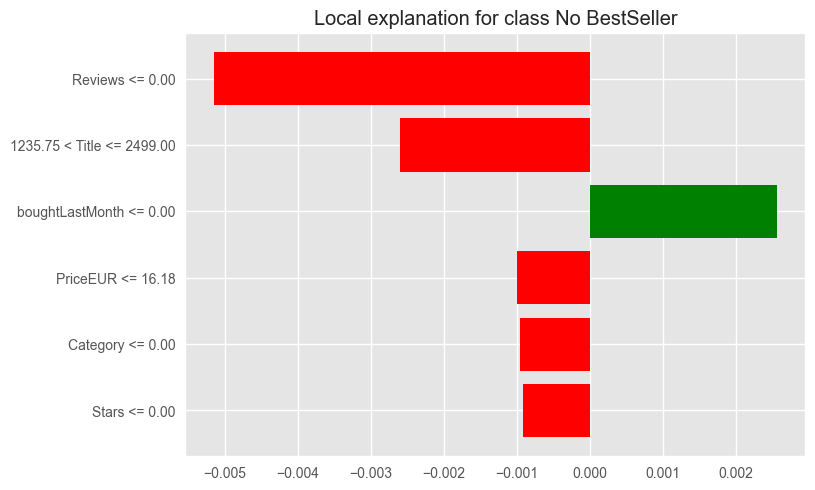

In [182]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

### 4.3.2 Random Forest Classifier - SHAP

Next, trying with SHAP "It stands for SHapley Additive exPlanations. This method aims to explain the prediction of an instance/observation by computing the contribution of each feature to the prediction." (Keita, 2023).

First, Importing "`shap`" in "4.3.2 topic", and initialising using "initjs" to load the JS visualisation.

In [183]:
import shap

shap.initjs()

Create the explainer using a "TreeExplainer" and testinf it, "after instantiating the TreeExplainer class with the random forest classifier, the shape values are computed for each feature of each instance in the test dataset." (Keita, 2023).

In [184]:
explainer = shap.TreeExplainer(rfc)

shap_values = explainer.shap_values(X_test)

In this plot, features are ranked by their average SHAP values showing the most important features at the top and the least important ones at the bottom using the summary_plot() function. This helps to understand the impact of each feature on the model’s predictions. (Keita, 2023).

Variable Importance Plot - Global Interpretation


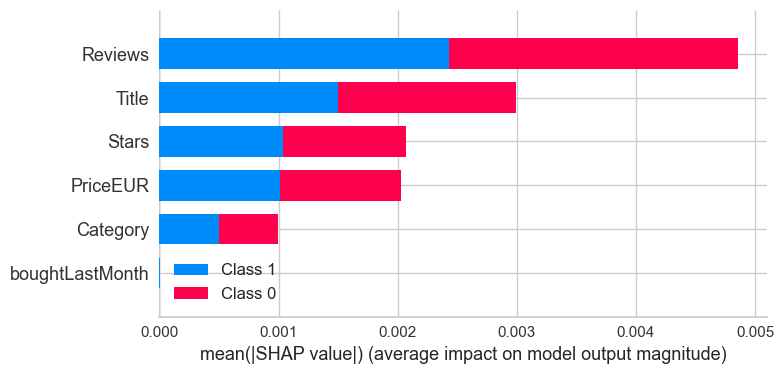

In [185]:
print("Variable Importance Plot - Global Interpretation")

figure = plt.figure()
shap.summary_plot(shap_values, X_test)

"Using this approach can provide a more granular overview of the impact of each feature on a specific outcome (label).

In the example below, shap_values[1] is used to represent the SHAP values for instances classified as label 1" BestSeller (Keita, 2023).

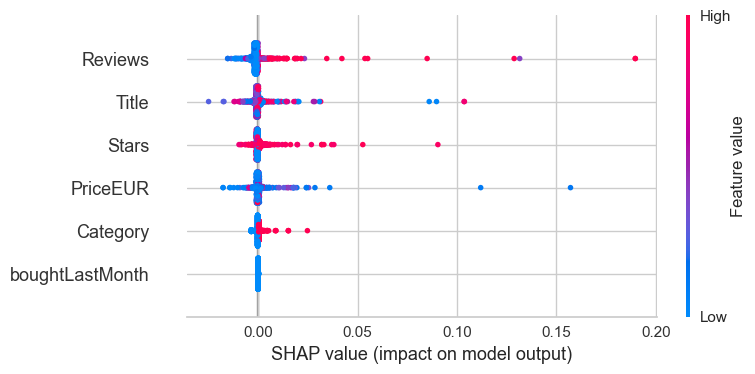

In [186]:
shap.summary_plot(shap_values[1], X_test)

"Unlike summary plots, dependence plots show the relationship between a specific feature and the predicted outcome for each instance within the data. This analysis is performed for multiple reasons and is not limited to gaining more granular information and validating the importance of the feature being analyzed by confirming or challenging the findings from the summary plots or other global feature importance measures." (Keita, 2023).

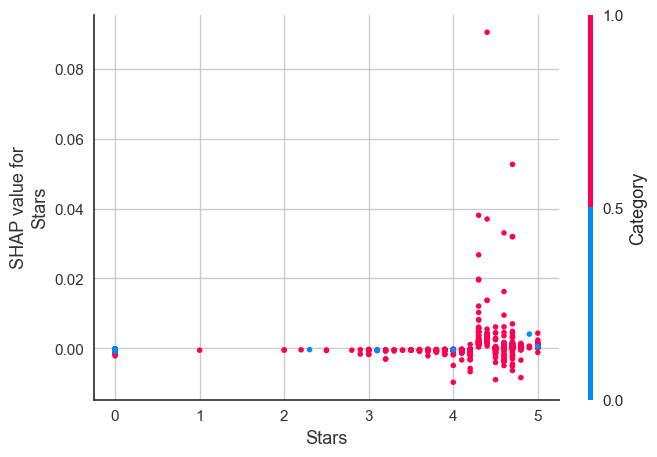

In [187]:
shap.dependence_plot("Stars", shap_values[1], X_test)

## 4.4 Random Forest Regressor

Importing the method “`RandomForestRegressor`" from "sklearn.ensemble" library in “4.1.3 topic”, to "train the Random Forest again with max_depth = 3" and "To make visualization readable" (Płoński, 2020) instead, use 35 depth of the tree as before.  

In [188]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(n_estimators = 100, max_depth = 3)
rfr.fit(X, y)

RandomForestRegressor(max_depth=3)

Next, plotting the Decision Tree

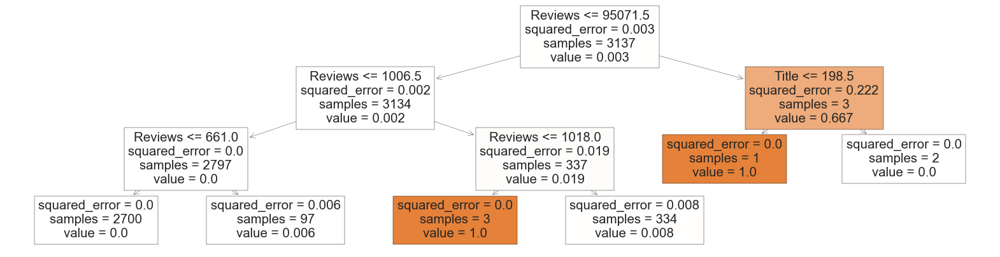

In [189]:
plt.figure(figsize = (20, 5))
_ = tree.plot_tree(rfr.estimators_[0], feature_names = X.columns, filled = True)

Examples from Decision Tree learned on the website "datacamp.com" "Random Forest Classification with Scikit-Learn" (Shafi, 2023) and from the website "mljar.com" "How to visualize a single Decision Tree from the Random Forest in Scikit-Learn (Python)?" (Płoński, 2020). 

### 4.4.1 Random Forest Regressor - LIME

Getting the R2 Score as **0.663**.

In [190]:
print('R2 score for the model on test set =', rfr.score(X_test, y_test))

R2 score for the model on test set = 0.6672623471467314


Next, get the class names and fit the explainer on the training data set using LIME.

In [191]:
explainer_lime = lime_tabular.LimeTabularExplainer(X_train.values, 
                  feature_names = X.columns, verbose = True, mode = 'regression')

Creating the variable "i" to pass the number of random_state, in this case, **43**, and the variable "k" to the Number denoting the top features, in this case, tested with **1667** values. Next plotting the explanations using a notebook.

In [192]:
i = 43
k = 1667

In [193]:
exp = explainer_lime.explain_instance(X_test.iloc[i].values, rfr.predict, num_features = k)
exp.show_in_notebook()

Intercept 0.0051739233634297685
Prediction_local [-0.00020581]
Right: 0.0


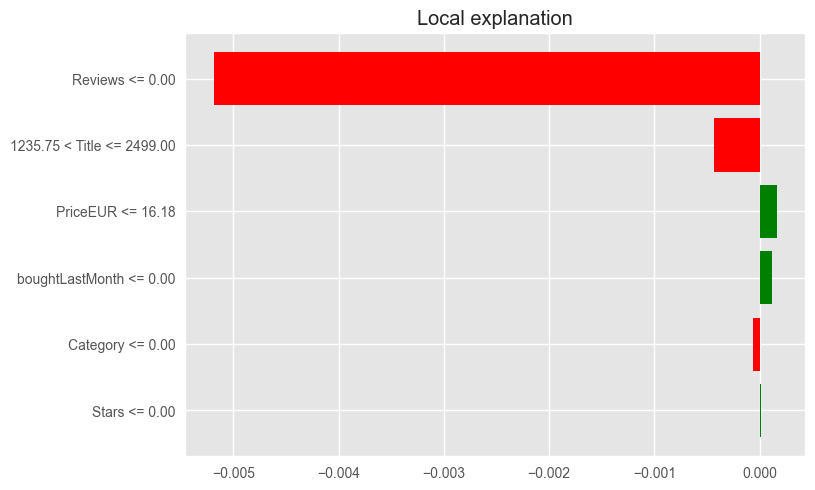

In [194]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

## 4.5 K Neighbors Classifier

Fouth, testing with the "K Neighbors Classifier" Machine Learning algorithm.

Just so as not to mess up the results and tests, starting over again splitting the features into `X and y` to transform, train and test, "`X`" by getting all features except "`BestSeller`" and "`y`" variable the feature "`BestSeller`" as a Target, transforming the features this time with "`RobustScaler()`", and creating the variables "`X_train, X_test, y_train and y_test`", for training and testing the model, choosing 30% of the data for testing with a set random_state = 43 and 70% of the data for training.  

In [195]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

scaler = preprocessing.RobustScaler()

X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Importing the method “`KNeighborsClassifier`" from "sklearn.neighbors" library in “4.1.4 topic”. Next, creating the variable "`knc`" to get the "`KNeighborsClassifier`" method, with the parameters: n_neighbors = 3, next fitting into `X_train and y_train` and getting a prediction of "`X_test`" to "`y_pred`". 

In [196]:
from sklearn.neighbors import KNeighborsClassifier

knc = KNeighborsClassifier(n_neighbors = 3)

KNN = knc.fit(X_train,y_train)
y_pred = KNN.predict(X_test)

Next, getting the Classification Report to get information on "`precision, recall, f1-score, support, accuracy, macro avg and weighted avg`" results, next a Confusion Matrix of the model and the Accuracy Score of the model, and plotting a "ConfusionMatrixDisplay" of the Confusion Matrix results.

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1495
           1       0.00      0.00      0.00         5

    accuracy                           1.00      1500
   macro avg       0.50      0.50      0.50      1500
weighted avg       0.99      1.00      1.00      1500


Accuracy: 1.00 


Confusion Matrix:
 [[1495    0]
 [   5    0]]


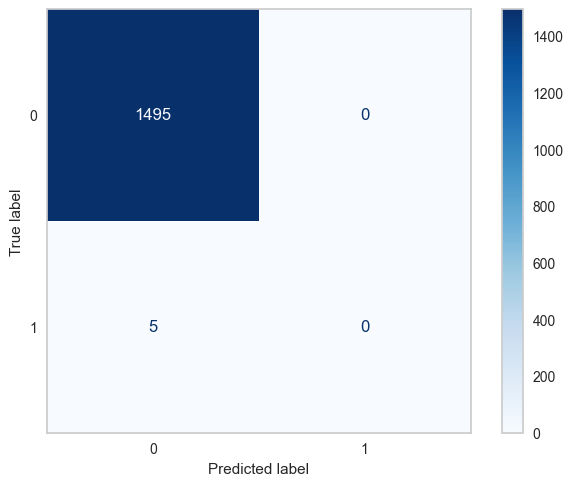

In [197]:
print("Classification Report:\n", classification_report(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.2f} \n")

print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels = knc.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = knc.classes_)
disp.plot(cmap = "Blues")
disp.ax_.grid(False)
plt.show()

Importing the method “`mglearn`" library in “4.1.4 topic”, to plot a graphic to see the k-neighbors classifier with 3 neighbors.

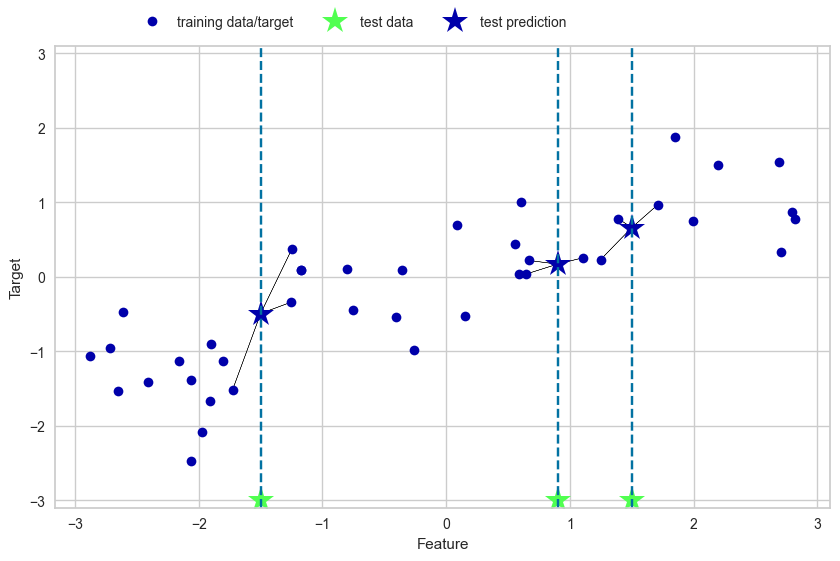

In [198]:
import mglearn 

mglearn.plots.plot_knn_regression(n_neighbors = 3)

### 4.5.1 K Neighbors Classifier - LIME

Next split the data in "X ans y" creating a "KNeighborsClassifier" model to train, test and predict, getting the R2 Score as **0.996**.

In [199]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

knc = KNeighborsClassifier(n_neighbors = 3)

knc.fit(X_train,y_train)

print('R2 score for the model on test set =', knc.score(X_test, y_test))

R2 score for the model on test set = 0.9966666666666667


Next, get the class names and fit the explainer on the training data set using LIME.

In [200]:
class_names = ['BestSeller', 'No BestSeller']

explainer_lime = lime_tabular.LimeTabularExplainer(X_train, 
                  feature_names = X.columns, verbose = True, 
                   class_names = class_names, mode = 'regression')

Creating the variable "i" to pass the number of random_state, in this case, **43**, and the variable "k" to the Number denoting the top features, in this case, tested with **1667** values. Next plotting the explanations using a notebook.

In [201]:
i = 43
k = 1667

In [202]:
exp = explainer_lime.explain_instance(X_test[i], knc.predict_proba, num_features = k)
exp.show_in_notebook()

Intercept 0.994839750266269
Prediction_local [1.00101691]
Right: 1.0


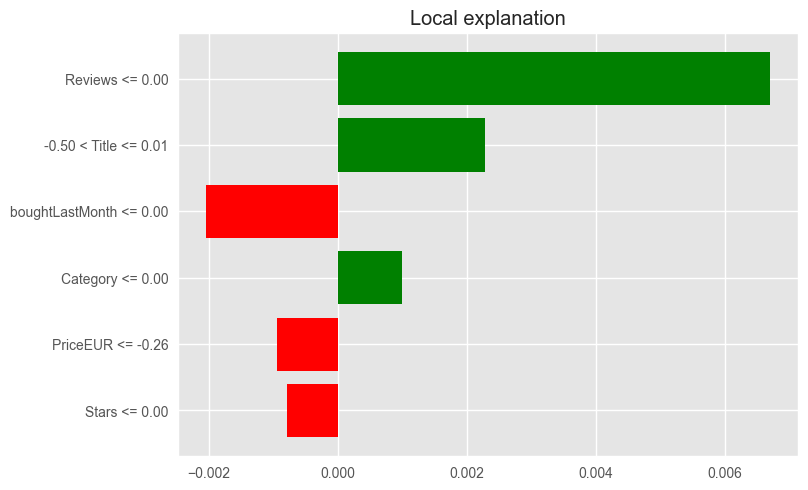

In [203]:
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()

## 4.6 Machine Learning Supervised Model Comparison

Creating a model comparison with the previous algorithms tested before: "`Logistic Regression, Decision Tree Classifier, Random Forest Classifier, Random Forest Regressor and K Neighbors Classifier`" also add three more modules to compare "`Linear Regression, Linear Discriminant Analysis and Ada Boost Classifier`". 

Examples of Comparing the performance of the algorithms model learned from "Comparing the performance of different machine learning algorithms" (Deb, 2020) and "Comparing ML algorithms, train ACCURACY > 90%" (aldemuro, 2018).

Importing the method "`AdaBoostClassifier and LinearRegression`" from "sklearn.ensemble and" in "4.6 topic".

In [204]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LinearRegression

Creating an empty list whose name is "`AL`" to save the models and using ".append" method to add a short description and model itself.

In [205]:
AL = []
AL.append(('LOGR', LogisticRegression()))
AL.append(('CART', DecisionTreeClassifier()))
AL.append(('RFC', RandomForestClassifier()))
AL.append(('RFR', RandomForestRegressor()))
AL.append(('KNN', KNeighborsClassifier()))

AL.append(('LR', LinearRegression()))
AL.append(('LDA', LinearDiscriminantAnalysis()))
AL.append(('ADA', AdaBoostClassifier()))

Next, splitting it into "X and y" to train and test.

In [206]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Next, importing "`precision_score, recall_score, mean_squared_error, r2_score`" from "sklearn.metrics" in "4.6 topic", created a for loop to train, test, predict and create the result in a data frame in new features, next plotting it.

In [207]:
from sklearn.metrics import precision_score, recall_score, mean_squared_error, r2_score

MLA_columns = []
MLA_compare = pd.DataFrame(columns = MLA_columns)

row_index = 0
names = []
train_results = []
test_results = []
mean_squared_error_train_results = []
mean_squared_error_test_results = []

for name, alg in AL:  
    names.append(name)
    
    alg.fit(X_train, y_train)
    # predicted = alg.predict(X_test)
    predicted = alg.fit(X_train, y_train).predict(X_test)

    MLA_compare.loc[row_index,'MLA Name'] = name
    
    MLA_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_train, y_train), 4)
    train_results.append(alg.score(X_train, y_train))
    
    MLA_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 4)
    test_results.append(alg.score(X_test, y_test))
    
    # MLA_compare.loc[row_index, 'MLA Precission'] = precision_score(y_test, predicted)
    # MLA_compare.loc[row_index, 'MLA Recall'] = recall_score(y_test, predicted)

    MLA_compare.loc[row_index, 'Mean Squared Error Train'] = mean_squared_error(y_train, alg.predict(X_train))
    mean_squared_error_train_results.append(r2_score(y_train, alg.predict(X_train)))
    
    MLA_compare.loc[row_index, 'Mean Squared Error Test'] = mean_squared_error(y_test, alg.predict(X_test))
    mean_squared_error_test_results.append(r2_score(y_test, alg.predict(X_test)))
    
    row_index += 1
    
MLA_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True) 
MLA_compare

,MLA Name,Train Accuracy,Test Accuracy,Mean Squared Error Train,Mean Squared Error Test
0,LOGR,0.9980,0.9967,0.002000,0.003333
2,RFC,0.9997,0.9967,0.000286,0.003333
4,KNN,0.9980,0.9967,0.002000,0.003333
1,CART,0.9997,0.9960,0.000286,0.004000
7,ADA,0.9997,0.9960,0.000286,0.004000
6,LDA,0.9871,0.9887,0.012857,0.011333
5,LR,0.0174,-0.0090,0.001961,0.003352
3,RFR,0.7853,-0.1721,0.000429,0.003894


Next, plotting the MLA Train Accuracy Comparison.

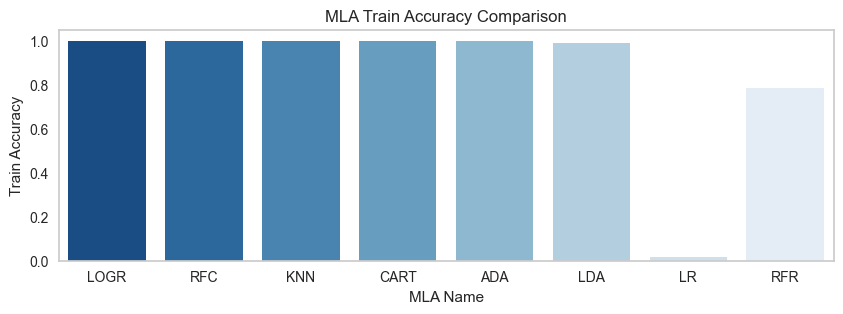

In [208]:
plt.subplots(figsize = (10, 3))
sns.barplot(x = "MLA Name", y = "Train Accuracy", data = MLA_compare, palette = 'Blues_r')
plt.xticks()
plt.title('MLA Train Accuracy Comparison')
plt.grid(False)
plt.show()

Next, the Algorithm Comparison Train and Test Accuracy.

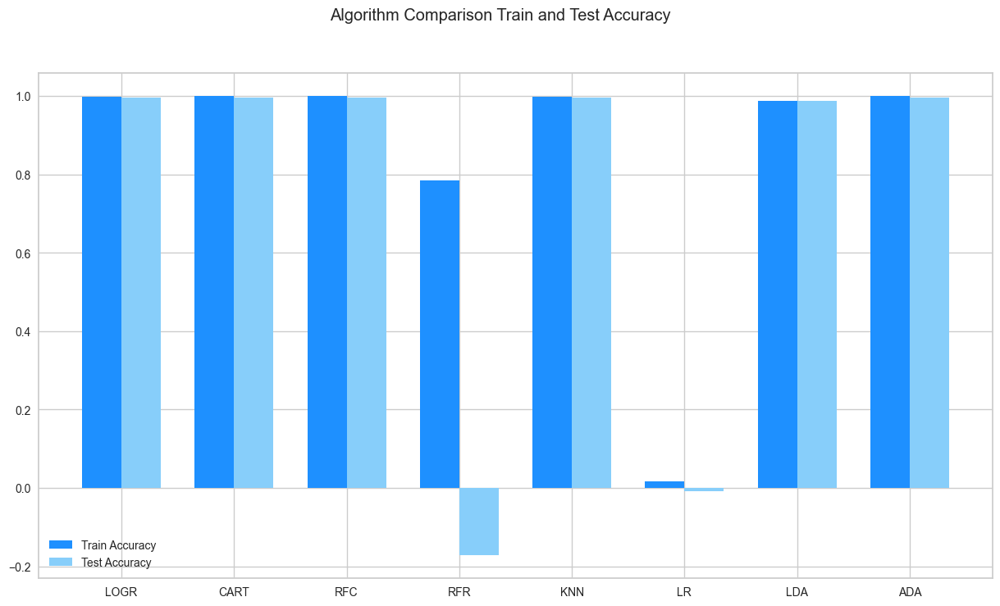

In [209]:
fig = plt.figure()

ind = np.arange(len(names))
width = 0.35  

fig.suptitle('Algorithm Comparison Train and Test Accuracy')

ax = fig.add_subplot(111)
plt.bar(ind - width / 2, train_results,  width = width, label = 'Train Accuracy', color = "dodgerblue")
plt.bar(ind + width / 2, test_results, width = width, label = 'Test Accuracy', color = "lightskyblue")

fig.set_size_inches(15, 8)
plt.legend(loc = "best")
ax.set_xticks(ind)
ax.set_xticklabels(names)
plt.show()

Comparing Train and Test Accuracy, the best performer, could choose "Logistic Regression, Decision Tree Classifier, Random Forest Classifier, K Neighbors Classifier, Linear Discriminant Analysis and Ada Boost Classifier".

Next, the Algorithm Comparison Mean Squared Error Train and Test.

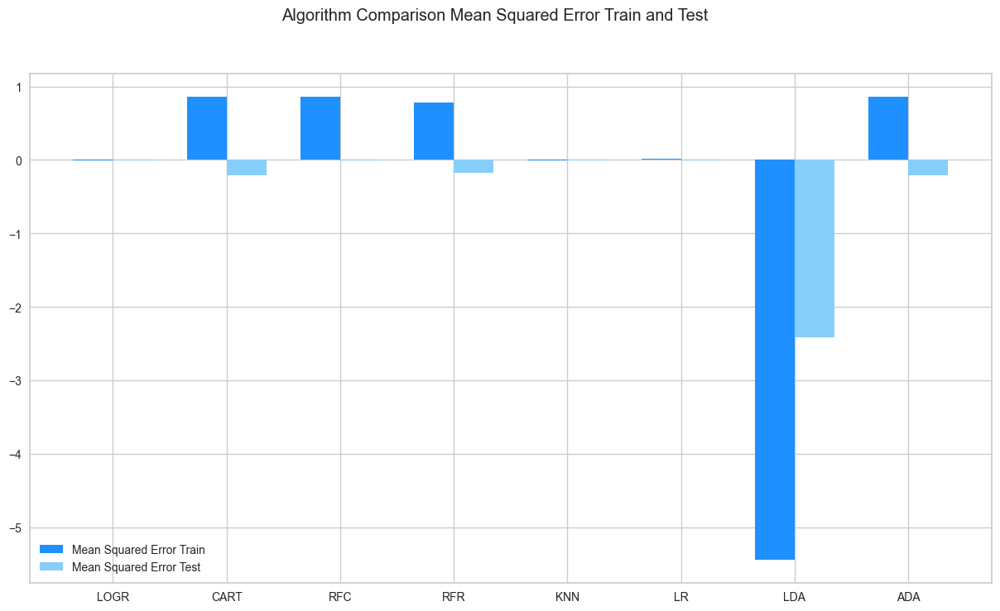

In [210]:
fig = plt.figure()

ind = np.arange(len(names))
width = 0.35  

fig.suptitle('Algorithm Comparison Mean Squared Error Train and Test')

ax = fig.add_subplot(111)
plt.bar(ind - width / 2, mean_squared_error_train_results,  width = width, label = 'Mean Squared Error Train', color = "dodgerblue")
plt.bar(ind + width / 2, mean_squared_error_test_results, width = width, label = 'Mean Squared Error Test', color = "lightskyblue")

fig.set_size_inches(15, 8)
plt.legend(loc = "best")
ax.set_xticks(ind)
ax.set_xticklabels(names)
plt.show()

Comparing Train Error and Test Error, based on minor values, the best performs, could choose "LogisticRegression, KNeighborsClassifier and LinearRegression" they have a low train error and the test error in comparison to the others.

## 4.7 Model Comparison with K Fold Analysis

Creating an algorithm comparison between "`LogisticRegression, DecisionTreeClassifier, RandomForestClassifier, RandomForestRegressor, KNeighborsClassifier, SVC and MLPClassifier`" and another one with "`LinearRegression, Lasso, ElasticNet, KNeighborsRegressor, DecisionTreeRegressor, SVR, LinearDiscriminantAnalysis and AdaBoostClassifier`" using K Fold, at this time.

### 4.7.1 Model Comparison - LogisticRegression, DecisionTreeClassifier, RandomForestClassifier, RandomForestRegressor, KNeighborsClassifier, SVC  and MLPClassifier

Creating an empty list whose name is models to save the models and using ".append" method to add a short description and model itself.

In [211]:
models = []
models.append(('LOGR', LogisticRegression()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('RFC', RandomForestClassifier()))
models.append(('RFR', RandomForestRegressor()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('ANN', MLPClassifier()))

Importing the method "`KFold`" from "sklearn.model_selection" and "`mean_squared_error and r2_score`" from "sklearn.metrics" in "4.7.1 topic". 

In [212]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

Next, after selecting all the models, it loops over each of them. First, running the K-fold analysis and running the model on the entire training and testing dataset.

In [213]:
num_folds = 10
scoring = 'neg_mean_squared_error' 

names = []
kfold_results = []
mse_train_results = []
mse_test_results = []
r2_train_results = []
r2_test_results = []

for name, model in models:
    names.append(name)
    
    ## K Fold analysis:
    kfold = KFold(n_splits = num_folds)
    #converted mean square error to positive. The lower the better
    cv_results = -1* cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    kfold_results.append(cv_results)
    
    # Full Training period
    res = model.fit(X_train, y_train)
    # Train results
    mse_train_results.append(mean_squared_error(y_train, res.predict(X_train)))
    r2_train_results.append(r2_score(y_train, res.predict(X_train)))
    
    # Test results
    mse_test_results.append(mean_squared_error(y_test, res.predict(X_test)))
    r2_test_results.append(r2_score(y_test, res.predict(X_test)))
    
    msg = "%s: %f (%f) %f %f %f" % (name, cv_results.mean(), cv_results.std(), mse_train_results[-1], 
                                    mse_test_results[-1], r2_test_results[-1])
    print(msg)

LOGR: 0.002000 (0.002871) 0.002000 0.003333 -0.003344
CART: 0.004286 (0.002634) 0.000286 0.004000 -0.204013
RFC: 0.002286 (0.002799) 0.000286 0.004000 -0.204013
RFR: 0.002635 (0.002474) 0.000485 0.003723 -0.120755
KNN: 0.002000 (0.002871) 0.002000 0.003333 -0.003344
SVM: 0.002000 (0.002871) 0.002000 0.003333 -0.003344
ANN: 0.002286 (0.002799) 0.006000 0.006667 -1.006689


Next, plotting K Fold results.

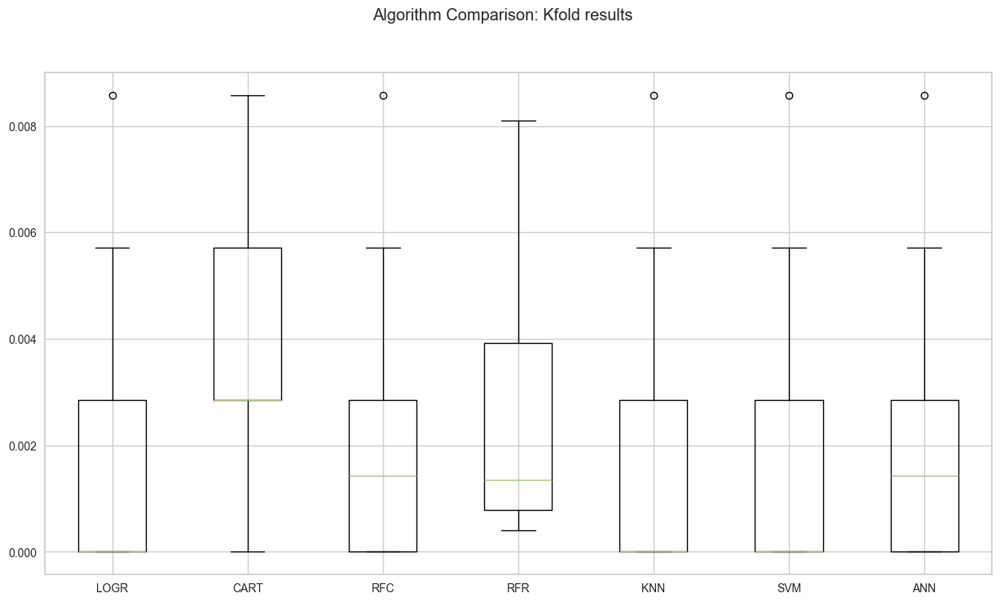

In [214]:
fig = plt.figure()

fig.suptitle('Algorithm Comparison: Kfold results')
ax = fig.add_subplot(111)

plt.boxplot(kfold_results)

ax.set_xticklabels(names)
fig.set_size_inches(15,8)
plt.show()

Above the K-Folds Cross Validation plotted in Boxplots is possible to analyse which algorithms had the best performance, based on minor average error, major accuracy value and boxplot with less variation, is possible to say that "Logistic Regression, KNeighborsClassifier, SVC and MLPClassifier" perform the best. 

Next, plotting the Algorithm Comparison with Train and Test Error

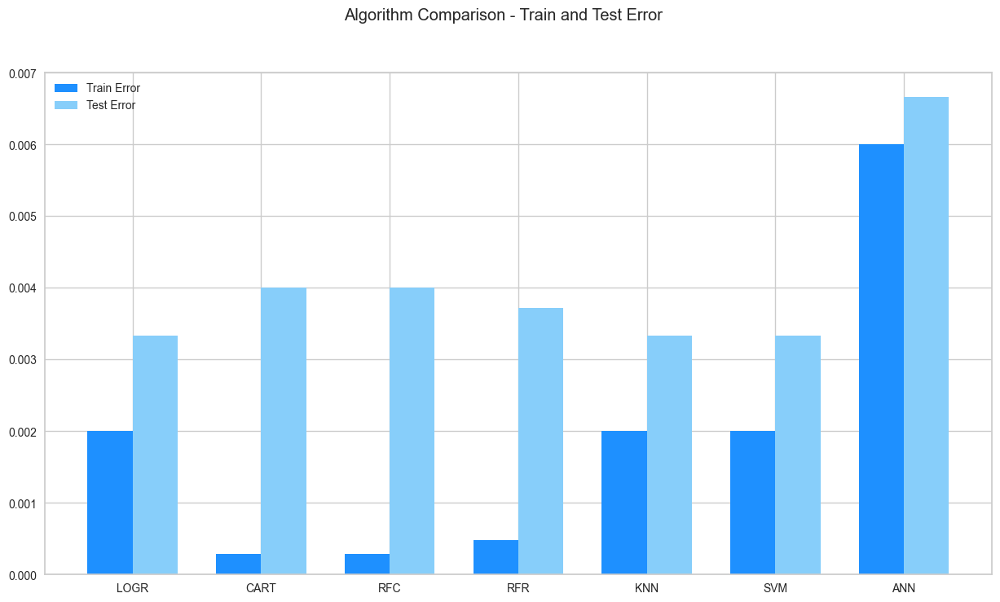

In [215]:
fig = plt.figure()

ind = np.arange(len(names))
width = 0.35 

fig.suptitle('Algorithm Comparison - Train and Test Error')

ax = fig.add_subplot(111)
plt.bar(ind - width / 2, mse_train_results,  width = width, label = 'Train Error', color = "dodgerblue")
plt.bar(ind + width / 2, mse_test_results, width = width, label = 'Test Error', color = "lightskyblue")

fig.set_size_inches(15, 8)
plt.legend()
ax.set_xticks(ind)
ax.set_xticklabels(names)
plt.show()

Comparing Train Error and Test Error, based on minor values, the best perform, could choose "LogisticRegression, KNeighborsClassifier, SVC and MLPClassifier" they have a low train error and the test error in comparison to the others, unlike "DecisionTreeClassifier, RandomForestClassifier, RandomForestRegressor" having train error value too low in comparison of the test error too high, seem that the algorithm is overfitting.

Next, plotting the Algorithm Comparison with Train and Test R2 Score

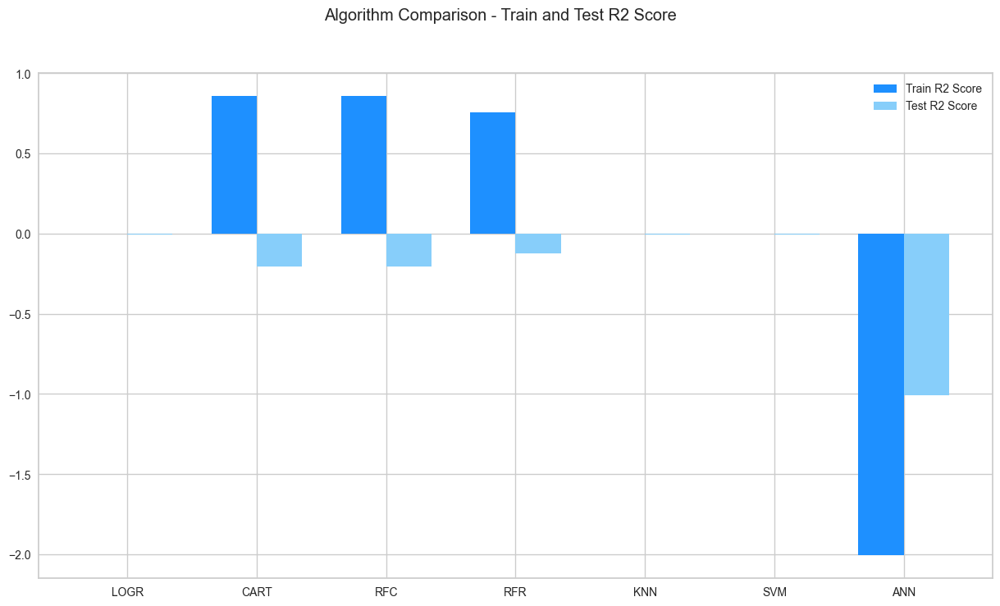

In [216]:
fig = plt.figure()

ind = np.arange(len(names))
width = 0.35 

fig.suptitle('Algorithm Comparison - Train and Test R2 Score')
ax = fig.add_subplot(111)
plt.bar(ind - width / 2, r2_train_results,  width = width, label = 'Train R2 Score', color = "dodgerblue")
plt.bar(ind + width / 2, r2_test_results, width = width, label = 'Test R2 Score', color = "lightskyblue")

fig.set_size_inches(15, 8)
plt.legend()
ax.set_xticks(ind)
ax.set_xticklabels(names)
plt.show()

Comparing Train R2 Score and Test R2 Score, based on values 1 or nearly 1, performs the best and below 0 shows lower variability of data, it could be chosen "RandomForestClassifier" as the best, also "DecisionTreeClassifier and RandomForestRegressor" others are basically zero.

### 4.7.2 Model Comparison - LinearRegression, Lasso, ElasticNet, KNeighborsRegressor, DecisionTreeRegressor, SVR, LinearDiscriminantAnalysis and AdaBoostClassifier

Importing the method "`Lasso and ElasticNet`" from "sklearn.linear_model", importing "`KNeighborsRegressor, DecisionTreeRegressor, SVR and AdaBoostClassifier`" from "sklearn.neighbors, sklearn.tree, sklearn.svm and sklearn.ensemble" in "4.7.2 topic".

In [217]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

Next, creating an empty list whose name is models to save the models and using ".append" method to add a short description and model itself.

In [218]:
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('KNN_R', KNeighborsRegressor()))
models.append(('CART_R', DecisionTreeRegressor()))
models.append(('SVR', SVR()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('ADA', AdaBoostClassifier()))

Next, after selecting all the models, it loops over each of them. First, running the K-fold analysis and running the model on the entire training and testing dataset.

In [219]:
num_folds = 10
scoring = 'neg_mean_squared_error' 

names = []
kfold_results = []
mse_train_results = []
mse_test_results = []
r2_train_results = []
r2_test_results = []

for name, model in models:
    names.append(name)
    
    ## K Fold analysis:
    kfold = KFold(n_splits = num_folds)
    #converted mean square error to positive. The lower the better
    cv_results = -1* cross_val_score(model, X_train, y_train, cv = kfold, scoring = scoring)
    kfold_results.append(cv_results)
    
    # Full Training period
    res = model.fit(X_train, y_train)
    # Train results
    mse_train_results.append(mean_squared_error(y_train, res.predict(X_train)))
    r2_train_results.append(r2_score(y_train, res.predict(X_train)))
    
    # Test results
    mse_test_results.append(mean_squared_error(y_test, res.predict(X_test)))
    r2_test_results.append(r2_score(y_test, res.predict(X_test)))
    
    msg = "%s: %f (%f) %f %f %f" % (name, cv_results.mean(), cv_results.std(), mse_train_results[-1], 
                                    mse_test_results[-1], r2_test_results[-1])
    print(msg)

LR: 0.001997 (0.002811) 0.001961 0.003352 -0.008968
LASSO: 0.001996 (0.002815) 0.001963 0.003358 -0.010834
EN: 0.001996 (0.002813) 0.001962 0.003359 -0.011121
KNN_R: 0.002309 (0.002842) 0.001566 0.003787 -0.139799
CART_R: 0.004000 (0.002619) 0.000143 0.004167 -0.254181
SVR: 0.011443 (0.002295) 0.011491 0.012580 -2.786620
LDA: 0.012000 (0.005686) 0.012857 0.011333 -2.411371
ADA: 0.002857 (0.002556) 0.000286 0.004000 -0.204013


Next, plotting K Fold results.

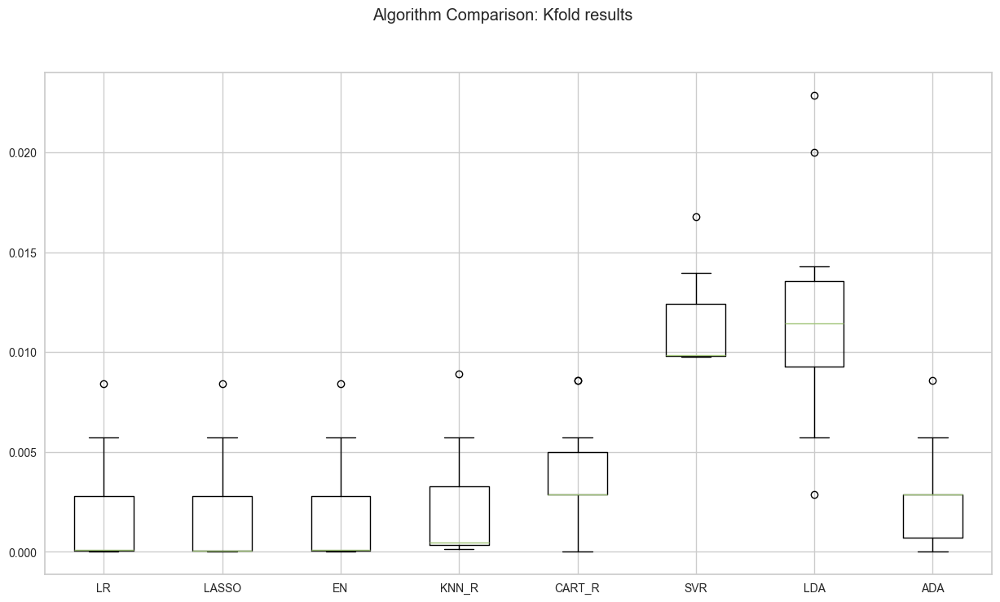

In [220]:
fig = plt.figure()

fig.suptitle('Algorithm Comparison: Kfold results')
ax = fig.add_subplot(111)

plt.boxplot(kfold_results)

ax.set_xticklabels(names)
fig.set_size_inches(15,8)
plt.show()

Above the K-Folds Cross Validation plotted in Boxplots is possible to say that "LinearRegression, Lasso, ElasticNet and AdaBoostClassifier" perform the best. 

Next, plotting the Algorithm Comparison with Train and Test Error

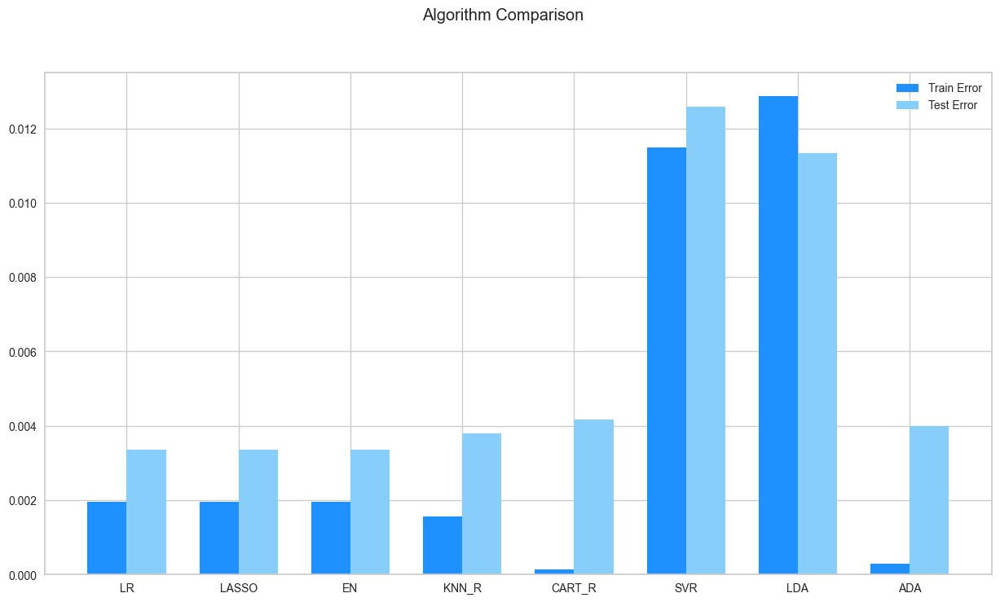

In [221]:
fig = plt.figure()

ind = np.arange(len(names)) 
width = 0.35 

fig.suptitle('Algorithm Comparison')

ax = fig.add_subplot(111)
plt.bar(ind - width / 2, mse_train_results, width = width, label = 'Train Error', color = "dodgerblue")
plt.bar(ind + width / 2, mse_test_results, width = width, label = 'Test Error', color = "lightskyblue")

fig.set_size_inches(15, 8)
plt.legend()
ax.set_xticks(ind)
ax.set_xticklabels(names)
plt.show()

Comparing Train Error and Test Error, in this case, could choose "LinearRegression, Lasso, ElasticNet, KNeighborsRegressor" or even "SVR and LinearDiscriminantAnalysis" once the train error and test error values are almost similar to each other, unlike "DecisionTreeRegressor and AdaBoostClassifier" seems overfitting.

Next, plotting the Algorithm Comparison with Train and Test R2 Score

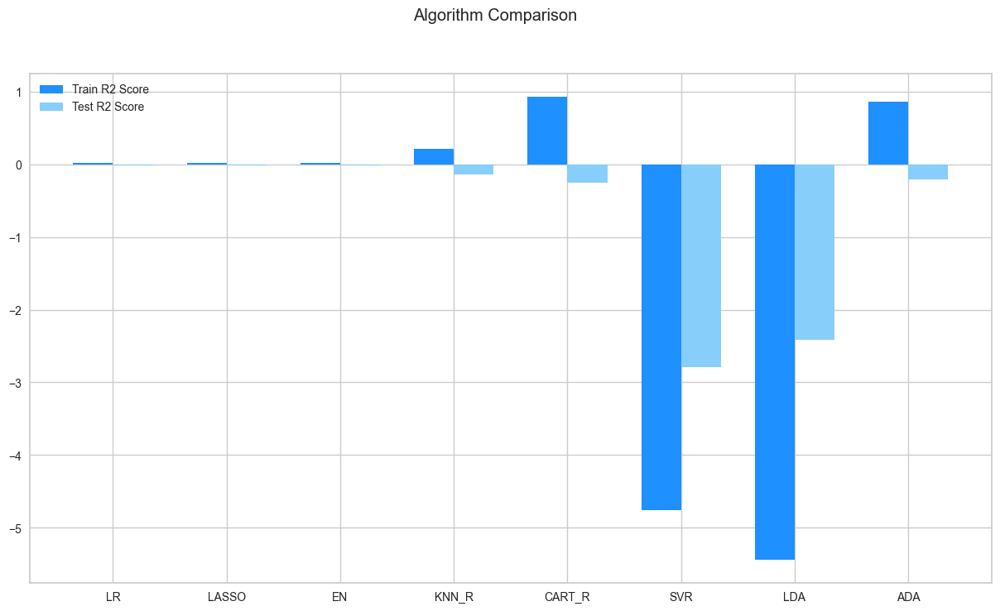

In [222]:
fig = plt.figure()

ind = np.arange(len(names)) 
width = 0.35

fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.bar(ind - width / 2, r2_train_results,  width = width, label = 'Train R2 Score', color = "dodgerblue")
plt.bar(ind + width / 2, r2_test_results, width = width, label = 'Test R2 Score', color = "lightskyblue")

fig.set_size_inches(15, 8)
plt.legend()
ax.set_xticks(ind)
ax.set_xticklabels(names)
plt.show()

In this case, it performs the best "DecisionTreeRegressor and AdaBoostClassifier" others are basically zero or too down to zero.

## 4.8 Evaluation (Hyperparameter tuning and cross-validation)

Applying Evaluation (Hyperparameter tuning and cross-validation) in the "Decision Tree Classifier" model to see if anything can be improved in parameter matters, chose this model once it is more familiar to work with and it is showing good results similar to the other models.

Splitting the features into X and y to transform, train and test, "X" by getting all features excluding the "`BestSeller`" and "y" variables the feature "`BestSeller`" as a Target, also, creating the variables "`X_train, X_test, y_train, y_test`", for training and testing the model, choosing 30% of the data for testing with a set random_state = 43 and 70% of the data for training.

In [223]:
X = df_ML.drop("BestSeller", axis = 1).copy()
y = df_ML["BestSeller"].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Next, creating the variable "`dt`" to get the "`DecisionTreeClassifier`" method, with the parameters: max_depth = 2 and criterion = 'entropy', next fitting into `X_train and y_train` and getting a prediction of "`X_test`" to "`y_pred`". 

In [224]:
dt = DecisionTreeClassifier(max_depth = 2, criterion = 'entropy')

dt = dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)

Next, getting the Classification Report to get information on "`precision, recall, f1-score, support, accuracy, macro avg and weighted avg`" results, next a Confusion Matrix of the model and the Accuracy Score of the model, and plotting a "ConfusionMatrixDisplay" of the Confusion Matrix results.

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1495
           1       0.00      0.00      0.00         5

    accuracy                           1.00      1500
   macro avg       0.50      0.50      0.50      1500
weighted avg       0.99      1.00      1.00      1500


Accuracy: 1.00 


Confusion Matrix:
 [[1495    0]
 [   5    0]]


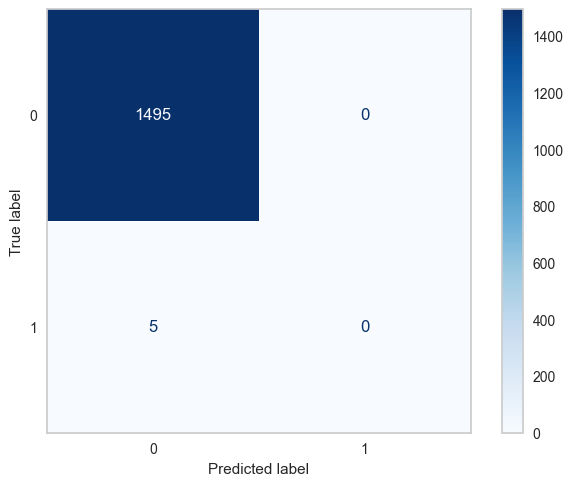

In [225]:
print("Classification Report:\n", classification_report(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.2f} \n")

print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels = dt.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = dt.classes_)
disp.plot(cmap = "Blues")
disp.ax_.grid(False)
plt.show()

### 4.8.1 Evaluation GridSearchCV RandomForestClassifier

Create a "`DecisionTreeClassifier`" model to test and train to get Training and Test score results. 

In [226]:
dt = DecisionTreeClassifier(max_depth = 2, criterion = 'entropy')
dt = dt.fit(X_train, y_train)

print('Training score {}%'.format(round(dt.score(X_train, y_train) * 100,2))) 
print('Test score {}%'.format(round(dt.score(X_test, y_test) * 100,2)))

Training score 99.83%
Test score 99.67%


Results of "`DecisionTreeClassifier without GridSearchCV`": 
- Training score 99.83%
- Test score 99.67%

**GridSearchCV**

Importing "`GridSearchCV`" from "sklearn.model_selection" in "4.8.1 topic".

In [227]:
from sklearn.model_selection import GridSearchCV

Created a dictionary called "parameters" to save a few parameters to test it next in "GridSearchCV".

In [228]:
parameters = {
    'criterion': ['gini', 'entropy'], 
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4], 
    'max_depth': [None, 5, 10, 20]
}

In [229]:
dt = DecisionTreeClassifier() 
dt = GridSearchCV(dt, parameters, cv = 5).fit(X_train, y_train)

print('Training score {}%'.format(round(dt.score(X_train, y_train) * 100,2))) 
print('Test score {}%'.format(round(dt.score(X_test, y_test) * 100,2)))

Training score 99.8%
Test score 99.67%


Results of "`DecisionTreeClassifier with GridSearchCV`": 
- Training score 99.8%
- Test score 99.67%

Next getting the "feature_importances_"

In [230]:
dt.best_estimator_
dt.best_estimator_.feature_importances_

array([0.11538104, 0.        , 0.76583429, 0.11878467, 0.        ,
       0.        ])

**RandomizedSearchCV**

Importing "`RandomizedSearchCV`" from "sklearn.model_selection" in "4.8.1 topic".

In [231]:
from sklearn.model_selection import RandomizedSearchCV

Testing now using "RandomizedSearchCV"

In [232]:
rfr = RandomizedSearchCV(DecisionTreeClassifier(),
                         parameters, cv = 5).fit(X_train, y_train)

print('Training score {}%'.format(round(rfr.score(X_train, y_train) * 100,2))) 
print('Test score {}%'.format(round(rfr.score(X_test, y_test) * 100,2)))

Training score 99.8%
Test score 99.67%


Results of "`DecisionTreeClassifier with RandomizedSearchCV`": 
- Training score 99.8%
- Test score 99.67%

### 4.8.2 Evaluation GridSearchCV RandomForestClassifier

Create a "`RandomForestClassifier`" model to test and train to get Training and Test score results. 

Note: It needs time to run.

In [233]:
rfc = RandomForestClassifier(n_estimators = 100)
rfc.fit(X_train, y_train)

print('Training score {}%'.format(round(dt.score(X_train, y_train) * 100,2))) 
print('Test score {}%'.format(round(dt.score(X_test, y_test) * 100,2)))

Training score 99.8%
Test score 99.67%


Results of "`RandomForestClassifier without GridSearchCV`": 
- Training score 99.83%
- Test score 99.67%

**GridSearchCV**

Created a dictionary called "parameters" to save a few parameters to test it next in "GridSearchCV".

In [234]:
parameters = {
    'n_estimators': [50, 100, 200, 300],
    'bootstrap': [False, True],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2], 
    'max_depth': [None, 5, 10, 20],
    'max_features': ['sqrt', 'log2']
}

Note: A comment command has been left below to run the document a little faster.

In [235]:
# rfc = RandomForestClassifier() 
# rfc = GridSearchCV(rfc, parameters, cv = 5).fit(X_train, y_train)

# print('Training score {}%'.format(round(dt.score(X_train, y_train) * 100,2))) 
# print('Test score {}%'.format(round(dt.score(X_test, y_test) * 100,2)))

Results of "`RandomForestClassifier with GridSearchCV`": 
- Training score 99.8%
- Test score 99.67%

Next getting the "feature_importances_"

Note: A comment command has been left below to run the document a little faster.

In [236]:
# rfc.best_estimator_
# rfc.best_estimator_.feature_importances_

**RandomizedSearchCV**

Testing now using "RandomizedSearchCV"

In [237]:
rfc = RandomizedSearchCV(RandomForestClassifier(),
                         parameters, cv = 5).fit(X_train, y_train)

print('Training score {}%'.format(round(rfr.score(X_train, y_train) * 100,2))) 
print('Test score {}%'.format(round(rfr.score(X_test, y_test) * 100,2)))

Training score 99.8%
Test score 99.67%


Results of "`DecisionTreeClassifier with RandomizedSearchCV`": 
- Training score 99.8%
- Test score 99.67%

## 4.9 Content-Based Recommender System

5. Attempt to train a generator of optimised titles with a short product name.

**Using Binary Feature Matrix Vectorizer**

Next, to resolve this question, it learned and applied a Cosine Similarity "Using Binary Feature Matrix Vectorizer" from the article "Step By Step Content-Based Recommendation System" (Gaurav, 2023) from the webiste "medium.com". 

After reading a few articles about techniques of Text Summarization: "6 Useful Text Summarization Algorithm in Python" (Sarowar Jahan Saurav, 2023), "5 Powerful Text Summarization Techniques in Python" (Turing, 2024) and "Comprehensive Guide to Text Summarization using Deep Learning in Python" (Analytics Vidhya, 2019).

Tried to apply a few techniques of Text Summarization such as "`SUMY, BERT Extractive Summarization, T5 Abstractive Summarization, Gensim, TextTeaser and NLTK`" to transform the text into a better visualisation but did not get good results, so instead decided to create a manual temporarily solution to get the text Title until finds a few symbols like: "|:–,". 

In [238]:
df["Title"] = df["Title"].str.split('[|:–,]').str[0].str.strip()

In [239]:
df[["Title", "Category"]].head()

,Title,Category
0,Echo Dot (5th generation,Hi-Fi Speakers
1,Anker Soundcore mini,Hi-Fi Speakers
2,Echo Dot (5th generation,Hi-Fi Speakers
3,Echo Dot with clock (5th generation,Hi-Fi Speakers
4,Introducing Echo Pop,Hi-Fi Speakers


Next creating a binary feature matrix for the Category using the dummies technique.

In [240]:
category_matrix = df['Category'].str.get_dummies()

Importing "`cosine_similarity`" from "sklearn.metrics.pairwise" in "4.9 topic".

In [241]:
from sklearn.metrics.pairwise import cosine_similarity

Getting the cosine similarity matrix and storing in "similarity"

In [242]:
similarity = cosine_similarity(category_matrix)

Created a function to get the recommended Products

In [243]:
def get_recommendations(title, top_n = 5):
    # Find the index of the movie with the given title
    idx = df[df['Title'] == title].index[0]
    
    # Get the cosine similarity scores for the movie
    similarity_scores = list(enumerate(similarity[idx]))
    
    # Sort the similarity scores in descending order
    similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)
    
    # Get the top_n movie indices
    product_indices = [i[0] for i in similarity_scores[1:top_n+1]]
    
    # Return the top_n most similar Products
    return df['Title'].iloc[product_indices]

Left, "Introducing Echo Pop" product name as default to run the code immediately instead of waiting for a response from the user, and commented on the option to ask for the user.

In [244]:
# Ask the user for the Produte name
# title = input("Enter the title of the Product: ")

title = "Introducing Echo Pop"

# Get the recommended Product
print("Top 5 similar Products for recommendations:")
print(get_recommendations(title))

Top 5 similar Products for recommendations:
1                   Anker Soundcore mini
2               Echo Dot (5th generation
3    Echo Dot with clock (5th generation
4                   Introducing Echo Pop
5    Echo Dot with clock (5th generation
Name: Title, dtype: object


Due to the large amount of data, sometimes, with large samples, the kernel turns down, showing the following message: 

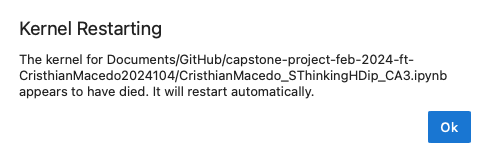

# 5. Machine Learning - Unsupervised

## 5.1 PCA (Principal Component Analysis)

Create a PCA example to get the data's signal and turn it into two features to be able to use and apply unsupervised machine learning.

Created the data frame called "X_pca" from "df_ML" to use in this stage.

In [245]:
X_pca = df_ML.copy()

Importing "`PCA`" from "sklearn.decomposition" in "5.1 topic".

In [246]:
from sklearn.decomposition import PCA

Next, plotting a graphic to analyse the number of components that will be needed to describe the data and show it in a plot graphic.

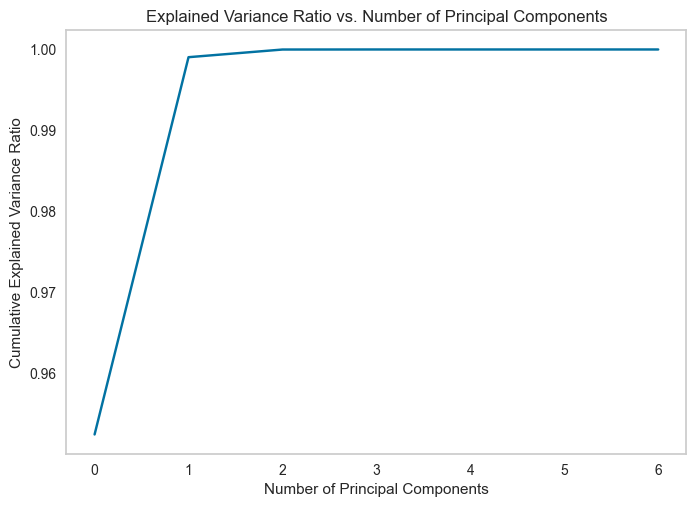

In [247]:
pca = PCA().fit(X_pca) 
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.xlabel('Number of Principal Components') 
plt.ylabel('Cumulative Explained Variance Ratio'); 
plt.title('Explained Variance Ratio vs. Number of Principal Components')

plt.grid(False)
plt.show()

It will choose two components to use and create a new data frame with these information.

In [248]:
pca = PCA(n_components = 2)

df_pca = pca.fit_transform(df_ML).copy()

print("Original shape: {}".format(str(df_ML.shape)))
print("Reduced shape: {}".format(str(df_pca.shape)))
print("Explained_variance_ratio:", pca.explained_variance_ratio_)
print("{:.2f}%".format(sum(pca.explained_variance_ratio_) * 100))

Original shape: (5000, 7)
Reduced shape: (5000, 2)
Explained_variance_ratio: [0.95239133 0.04665448]
99.90%


In [249]:
n_components = df_pca.shape[1]
df_pca = pd.DataFrame(df_pca, columns=['PC{}'.format(i + 1) for i in range(n_components)])
print(df_pca)

               PC1          PC2
0     14208.147142  -832.837077
1     97008.480148 -1005.314314
2     14208.134059  -831.837180
3      6105.613275  -921.804914
4       775.105135  -458.622589
...            ...          ...
4995  -1095.549853 -1262.930979
4996  -1096.347909 -1201.937238
4997  -1096.531070 -1187.938675
4998  -1096.856961 -1162.954209
4999  -1096.202817 -1212.949079

[5000 rows x 2 columns]


After analyses of the data set, tests will be carried out using K-Means Clustering, K-Medoids Clustering and Fuzzy C-means Clustering to check which clustering solution performs the best.

## 5.2 K-Means Clustering

First, splitting the data to use in the Unsupervised Machine Learning model algorithm 

- `X` - Storing the values of all features

In [250]:
X = df_pca.iloc[:, 0:2].values.copy()
X

array([[14208.14714201,  -832.8370769 ],
       [97008.48014764, -1005.31431382],
       [14208.13405912,  -831.83717951],
       ...,
       [-1096.53106957, -1187.9386746 ],
       [-1096.85696136, -1162.95420917],
       [-1096.20281682, -1212.94907859]])

Also created two variables called "feature1_index and feature2_index" with constant numbers to use easily in the graphics and so on, when necessary, at the moment, it set a constant number of 2 to "feature1_index" and 3 to "feature2_index", to analyse the column 2 and 3 of the data frame.

In [251]:
feature1_index = 0
feature2_index = 1

Importing the method “`KMeans`” from "sklearn.cluster" in “5.2 topic”.

In [252]:
from sklearn.cluster import KMeans

Creating the classifier cluster: "`kmeans`" applying "KMeans" with the parameters: "n_clusters = 4, max_iter = 300, n_init = 10, random_state = 38", next using the "fit_predict" in "X" values and storing in the variable "`y_kmeans`" the prediction. 

In [253]:
kmeans = KMeans(n_clusters = 4, max_iter = 300, n_init = 10, random_state = 38)

y_kmeans = kmeans.fit_predict(X)

Next, visualising the clusters using a "Scatter Plot", for the four clusters and plotting their centroid points for each cluster using the features "`PCA Feature 0 and PCA Feature 1`".

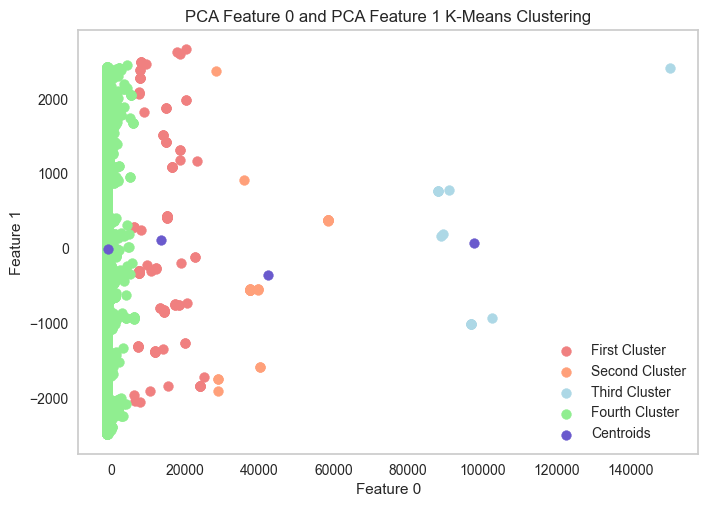

In [254]:
plt.scatter(X[y_kmeans == 0, feature1_index], X[y_kmeans == 0, feature2_index], s = 50, c = 'lightcoral', label = 'First Cluster')
plt.scatter(X[y_kmeans == 1, feature1_index], X[y_kmeans == 1, feature2_index], s = 50, c = 'lightsalmon', label = 'Second Cluster')
plt.scatter(X[y_kmeans == 2, feature1_index], X[y_kmeans == 2, feature2_index], s = 50, c = 'lightblue', label = 'Third Cluster')
plt.scatter(X[y_kmeans == 3, feature1_index], X[y_kmeans == 3, feature2_index], s = 50, c = 'lightgreen', label = 'Fourth Cluster')

plt.title("PCA Feature 0 and PCA Feature 1 K-Means Clustering")
plt.scatter(kmeans.cluster_centers_[:, feature1_index], kmeans.cluster_centers_[:, feature2_index], c = 'slateblue', label = 'Centroids')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')

plt.legend(loc = "best")
plt.grid(False)
plt.show()

### 5.2.1 K-Means Clustering Comparison of Elbow method, Davies-Bouldin Index and Silhouette Score

Next, it will use the Elbow method to analyse how many numbers of clusters are ideal for this specific data, using a measurement of "Within Cluster Sum of Squares (WCSS)". 

First, it declared an empty array named "wcss" using a "for loop" in a range from 1 to 11 to test the possibility of having between 1 to 11 clusters with the same parameters as before, but the number of clusters varying, training the model with "fit" method in "X" values, and storing it in the array "wcss", next plotting the results in a "Line graph" plot with an indicative in the number of the best cluster with a red circle to show it in the graphic.

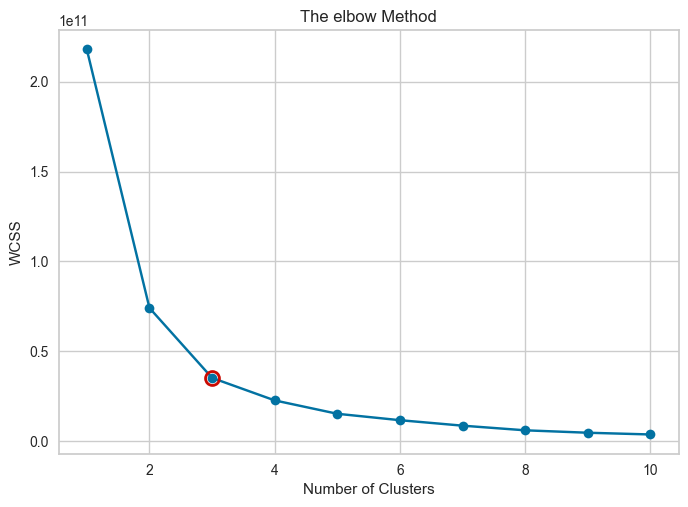

In [255]:
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, max_iter = 300, n_init = 10, random_state = 38)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss, marker='o')
plt.title('The elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')

x_coords = np.arange(1, 11)
line_start = np.array([1, wcss[0]])
line_end = np.array([10, wcss[-1]])

line_vec = line_end - line_start
line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))

distances = []
for i in range(1, 11):
    point = np.array([x_coords[i - 1], wcss[i - 1]])
    point_vec = point - line_start

    proj_of_point_onto_line = line_start + line_vec_norm * np.dot(point_vec, line_vec_norm)

    distance = np.sqrt(np.sum((proj_of_point_onto_line - point)**2))
    distances.append(distance)


elbow_point = np.argmax(distances) + 1

plt.plot(elbow_point, wcss[elbow_point - 1], 'ro', markersize = 10, markerfacecolor = 'none', markeredgewidth = 2)

plt.show()

Analysing the graphic above is indicative of 3 clusters performs the best results in this case.

Importing "silhouette_score" from "`sklearn.metric`" in "`5.2.1 topic`", to use the silhouette score.

In [256]:
from sklearn.metrics import silhouette_score

Next, getting a total of **0.85** after calculating the Silhouette score based on four clusters. 

In [257]:
print(f'Silhouette Score(n = 4): {silhouette_score(X, y_kmeans)}')

Silhouette Score(n = 4): 0.8559459196557169


Testing with 3 clusters and got a total of **0.89** after calculating the Silhouette score based on three clusters. 

In [258]:
kmeans = KMeans(n_clusters = 3, max_iter = 300, n_init = 10, random_state = 38)
silhouette_score(X, kmeans.fit_predict(X))

0.8936759621928977

Next, visualising the clusters using a "Scatter Plot", for the three clusters and plotting their centroid points for each cluster using the features "`PCA Feature 0 and PCA Feature 1`".

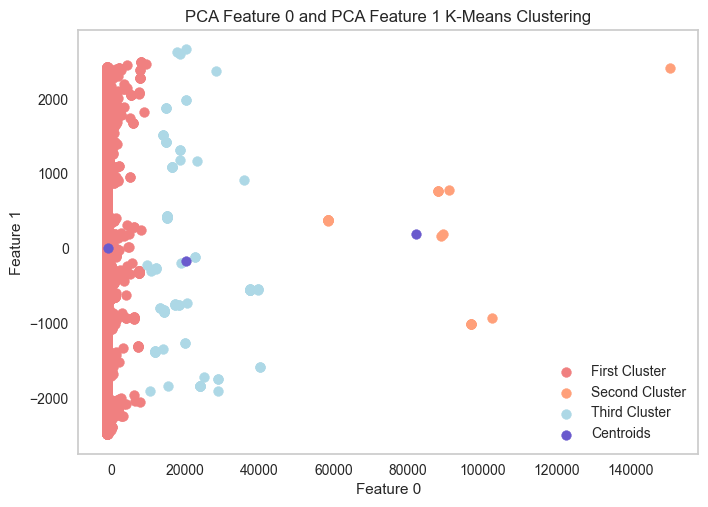

In [259]:
kmeans = KMeans(n_clusters = 3, max_iter = 300, n_init = 10, random_state = 38)
y_kmeans = kmeans.fit_predict(X)

plt.scatter(X[y_kmeans == 0, feature1_index], X[y_kmeans == 0, feature2_index], s = 50, c = 'lightcoral', label = 'First Cluster')
plt.scatter(X[y_kmeans == 1, feature1_index], X[y_kmeans == 1, feature2_index], s = 50, c = 'lightsalmon', label = 'Second Cluster')
plt.scatter(X[y_kmeans == 2, feature1_index], X[y_kmeans == 2, feature2_index], s = 50, c = 'lightblue', label = 'Third Cluster')

plt.title("PCA Feature 0 and PCA Feature 1 K-Means Clustering")
plt.scatter(kmeans.cluster_centers_[:, feature1_index], kmeans.cluster_centers_[:, feature2_index], c = 'slateblue', label = 'Centroids')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')

plt.legend(loc = "best")
plt.grid(False)
plt.show()

Importing "davies_bouldin_score" from "`sklearn.metrics`" in "`5.2.1 topic`", to use the Davies Bouldin Score.

In [260]:
from sklearn.metrics import davies_bouldin_score

Next, creating a comparison of the Davies-Bouldin Index and Silhouette Score and plotting it: 
1. Creating a function to perform K-Means clustering and calculate metrics.
2. Creating a few variable arrays "db_scores and silhouette_scores" to store the values when executed.
3. Next, the results are plotted in a "Line graph" plot to compare the "Davies-Bouldin Index and Silhouette Score" and visualise the best number of clusters.
4. Next, getting the optimal number of clusters based on Silhouette Score metrics.
5. Creating a K-means clustering with the optimal number of clusters.
6. Next, visualising the clusters using a "Scatter Plot", for the **two** clusters and plotting their centroid points for each cluster using the features "`PCA Feature 0 and PCA Feature 1`".

- **Note**: It needs time to run, when large number of observations.

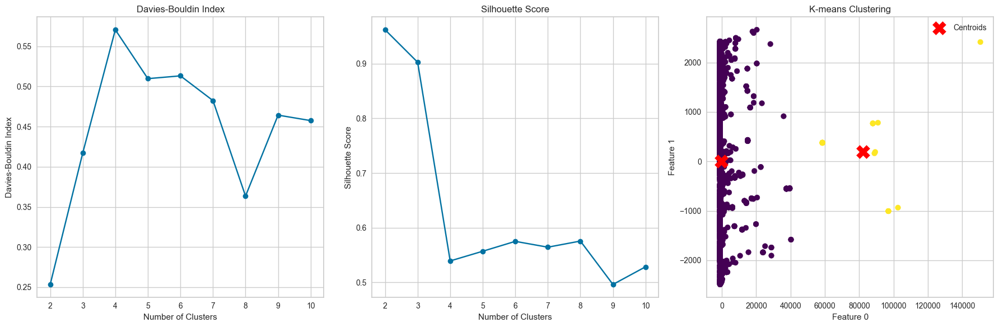

In [261]:
def perform_clustering(n_clusters, data):
    kmeans = KMeans(n_clusters = n_clusters)
    labels = kmeans.fit_predict(X)
    db_index = davies_bouldin_score(X, labels)
    silhouette_avg = silhouette_score(X, labels)
    return db_index, silhouette_avg

cluster_range = range(2, 11)
db_scores = []
silhouette_scores = []

for n_clusters in cluster_range:
    db_index, silhouette_avg = perform_clustering(n_clusters, X)
    db_scores.append(db_index)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize = (18, 6))

# Davies-Bouldin Index
plt.subplot(1, 3, 1)
plt.plot(cluster_range, db_scores, marker='o')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')

# Silhouette Score
plt.subplot(1, 3, 2)
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

# Optimal number of clusters based on Silhouette Score
optimal_clusters_silhouette = np.argmax(silhouette_scores) + 2 

# K-means clustering with the optimal number of clusters
optimal_kmeans = KMeans(n_clusters = optimal_clusters_silhouette)
optimal_labels = optimal_kmeans.fit_predict(X)

plt.subplot(1, 3, 3)
plt.scatter(X[:, feature1_index], X[:, feature2_index], c = optimal_labels, cmap = 'viridis')
plt.scatter(optimal_kmeans.cluster_centers_[:, feature1_index], optimal_kmeans.cluster_centers_[:, feature2_index],
            s = 300, c = 'red', marker = 'X', label = 'Centroids')

plt.title('K-means Clustering')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')
plt.legend()

plt.tight_layout()
plt.show()

As represented in the "Line graph" plot, the number of clusters based on the Davies-Bouldin Index and Silhouette Score will be **2**, and next plotted a "Scatter Plot" with their centroid points for each cluster using the features "`PCA Feature 0 and PCA Feature 1`" with 2 clusters got from Silhouette Score.

Next, getting the optimal number of clusters based on the metrics.

In [262]:
optimal_clusters_db = np.argmin(db_scores) + 2 
optimal_clusters_silhouette = np.argmax(silhouette_scores) + 2 

print(f'Optimal Clusters (Davies-Bouldin): {optimal_clusters_db}')
print(f'Optimal Clusters (Silhouette): {optimal_clusters_silhouette}')

Optimal Clusters (Davies-Bouldin): 2
Optimal Clusters (Silhouette): 2


Next, visualising the clusters using a "Scatter Plot", for the two KMeans Optimal Clusters (Davies-Bouldin) and plotting their centroid points for each cluster using the features "`PCA Feature 0 and PCA Feature 1`".

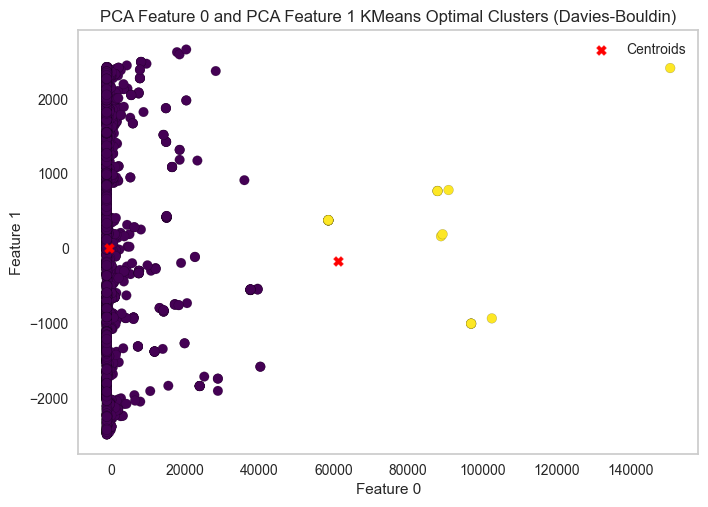

In [263]:
kmeans = KMeans(n_clusters = 2, max_iter = 300, n_init = 10, random_state = 38)
y_kmeans = kmeans.fit_predict(X)

plt.scatter(X[:, feature1_index], X[:, feature2_index], c = optimal_labels, cmap = 'viridis', edgecolor = (0, 0, 0, 0.3))
plt.scatter(kmeans.cluster_centers_[:, feature1_index], kmeans.cluster_centers_[:, feature2_index],
            s = 50, c = 'red', marker = 'X', label = 'Centroids')

plt.title('PCA Feature 0 and PCA Feature 1 KMeans Optimal Clusters (Davies-Bouldin)')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')
plt.legend()

plt.grid(False)
plt.show()

## 5.3 K-Medoids Clustering

Importing the method "`KMedoids`" from "sklearn_extra.cluster" "in 5.3 topic".

In [264]:
from sklearn_extra.cluster import KMedoids

Creating the classifier cluster: "kMedoids" applying "KMedoids" with the parameters: "n_clusters = 4, random_state = 38", next using the "fit" in "X" values and storing in the variable "centers" and in the variable "y_kmc" the prediction.

In [265]:
kMedoids = KMedoids(n_clusters = 4, random_state = 38)
centers = kMedoids.fit(X)
y_kmc = kMedoids.predict(X)

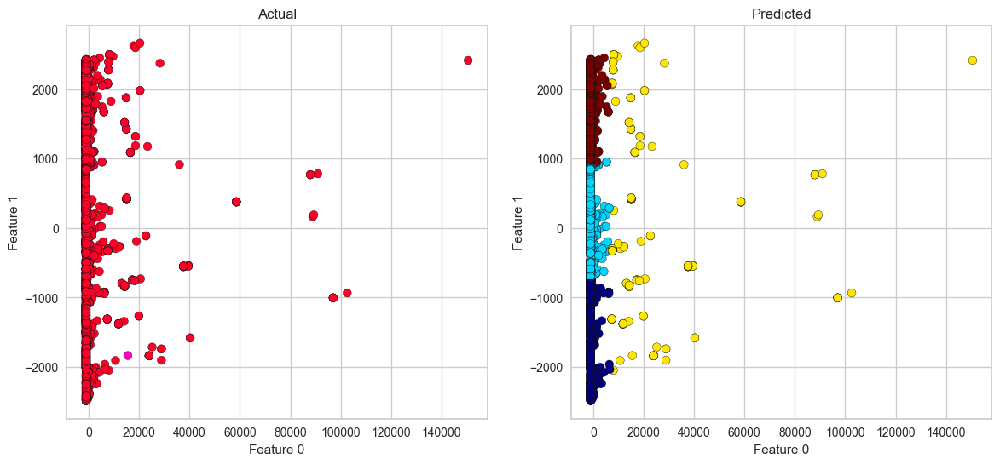

In [266]:
fig, axes = plt.subplots(1, 2, figsize = (14, 6), dpi = 100)
axes[0].scatter(X[:, feature1_index], X[:, feature2_index], c = y, cmap = 'gist_rainbow', edgecolor = 'k')
axes[1].scatter(X[:, feature1_index], X[:, feature2_index], c = y_kmc, cmap = 'jet', edgecolor = 'k')

axes[0].set_xlabel('Feature 0')
axes[0].set_ylabel('Feature 1')

axes[1].set_xlabel('Feature 0')
axes[1].set_ylabel('Feature 1')

axes[0].set_title('Actual')
axes[1].set_title('Predicted')

plt.show()

Next, getting a total of **0.46** after calculating the Silhouette score based on four clusters.

In [267]:
print(f'Silhouette Score(n = 4): {silhouette_score(X, y_kmc)}')

Silhouette Score(n = 4): 0.46939024740765534


Testing with 3 clusters and got a total of **0.32** after calculating the Silhouette score based on three clusters.

In [268]:
kMedoids = KMedoids(n_clusters = 3, random_state = 38)

silhouette_score(X, kMedoids.fit_predict(X))

0.3226245486491332

Next, visualising the clusters using a "Scatter Plot", for the three clusters using the features "`PCA Feature 0 and PCA Feature 1`".

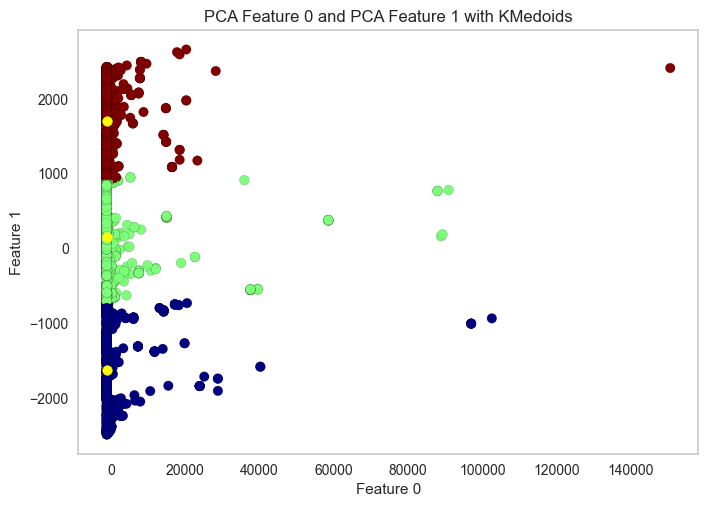

In [269]:
kMedoids = KMedoids(n_clusters = 3, random_state = 38)
y_kmc = kMedoids.fit_predict(X)

plt.title("PCA Feature 0 and PCA Feature 1 with KMedoids")
plt.scatter(X[:, feature1_index], X[:, feature2_index], c = y_kmc, cmap = 'jet', edgecolor = (0, 0, 0, 0.3))
plt.scatter(kMedoids.cluster_centers_[:, feature1_index], kMedoids.cluster_centers_[:, feature2_index], c = 'yellow', label = 'Centroids')

plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')

plt.grid(False)
plt.show()

### 5.3.1 K-Medoids Clustering Comparison of Davies-Bouldin Index and Silhouette Score

Next,
1. Creating a function to perform KMedoids Clustering and calculate metrics.
2. Creating a few variable arrays "db_scores and silhouette_scores" to store the values when executed.
3. Next, the results are plotted in a "Line graph" plot to compare the "Davies-Bouldin Index and Silhouette Score" and visualise the best number of clusters.
4. Next, getting the optimal number of clusters based on Silhouette Score metrics.
5. Creating an KMedoids Clustering with the optimal number of clusters.
6. Next, visualising the clusters using a "Scatter Plot", for each cluster in total got from the tests using the features "`PCA Feature 0 and PCA Feature 1`".

- **Note**: It needs time to run, when large number of observations.

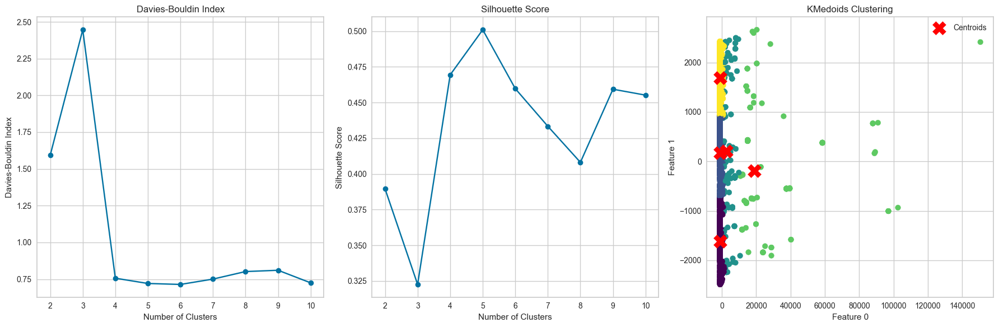

In [270]:
def perform_clustering(n_clusters, data):
    kMedoids = KMedoids(n_clusters = n_clusters)
    labels = kMedoids.fit_predict(data)
    db_index = davies_bouldin_score(data, labels)
    silhouette_avg = silhouette_score(data, labels)
    return db_index, silhouette_avg

cluster_range = range(2, 11)
db_scores = []
silhouette_scores = []

for n_clusters in cluster_range:
    db_index, silhouette_avg = perform_clustering(n_clusters, X)
    db_scores.append(db_index)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize = (18, 6))

# Davies-Bouldin Index
plt.subplot(1, 3, 1)
plt.plot(cluster_range, db_scores, marker='o')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')

# Silhouette Score
plt.subplot(1, 3, 2)
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

# Optimal number of clusters based on Silhouette Score
optimal_clusters_silhouette = np.argmax(silhouette_scores) + 2 

# KMedoids with the optimal number of clusters
optimal_KMedoids = KMedoids(n_clusters = optimal_clusters_silhouette)
optimal_labels = optimal_KMedoids.fit_predict(X)

plt.subplot(1, 3, 3)
plt.scatter(X[:, feature1_index], X[:, feature2_index], c = optimal_labels, cmap = 'viridis')
plt.scatter(optimal_KMedoids.cluster_centers_[:, feature1_index], optimal_KMedoids.cluster_centers_[:, feature2_index],
            s = 300, c = 'red', marker = 'X', label = 'Centroids')

plt.title('KMedoids Clustering')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')
plt.legend()

plt.tight_layout()
plt.show()

Next, getting the optimal number of clusters based on the metrics.

Above, as represented in the "Line graph" plot, the number of clusters based on the Davies-Bouldin Index is **6** and Silhouette Score is **5**, and next, plotted a "Scatter Plot" using the features "`PCA Feature 0 and PCA Feature 1`" with 5 clusters got from Silhouette Score.

In [271]:
optimal_clusters_db = np.argmin(db_scores) + 2 
optimal_clusters_silhouette = np.argmax(silhouette_scores) + 2 

print(f'Optimal Clusters (Davies-Bouldin): {optimal_clusters_db}')
print(f'Optimal Clusters (Silhouette): {optimal_clusters_silhouette}')

Optimal Clusters (Davies-Bouldin): 6
Optimal Clusters (Silhouette): 5


Next, visualising the clusters using a "Scatter Plot", for the **6** clusters from the Davies-Bouldin Index using the features "`PCA Feature 0 and PCA Feature 1`".

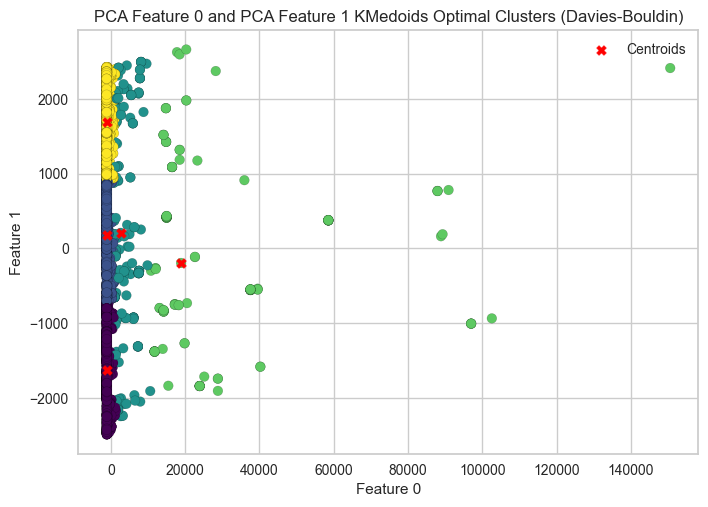

In [272]:
kMedoids = KMedoids(n_clusters = 6, random_state = 38)
y_kmc = kMedoids.fit_predict(X)

plt.scatter(X[:, feature1_index], X[:, feature2_index], c = optimal_labels, cmap = 'viridis', edgecolor = (0, 0, 0, 0.3))
plt.scatter(optimal_KMedoids.cluster_centers_[:, feature1_index], optimal_KMedoids.cluster_centers_[:, feature2_index],
            s = 50, c = 'red', marker = 'X', label = 'Centroids')

plt.title('PCA Feature 0 and PCA Feature 1 KMedoids Optimal Clusters (Davies-Bouldin)')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')
plt.legend()

plt.show()

## 5.3 Fuzzy C-Means Clustering

Importing the method “`FCM`” from "fcmeans" in “5.3 topic”.

In [273]:
from fcmeans import FCM

Creating the classifier cluster: "fuzzy" applying "FCM" with the parameters: "n_clusters = 4", next using the "fit" in "X" values and storing in the variable "fcm_centers" and in the variable "fcm_labels" the outputs.

In [274]:
fuzzy = FCM(n_clusters = 4)

fuzzy.fit(X)

fcm_centers = fuzzy.centers
fcm_labels = fuzzy.u.argmax(axis = 1)

Next, plotting the results of the Actual points and the predicted ones after using Fuzzy C-means technique with their respective centroids.

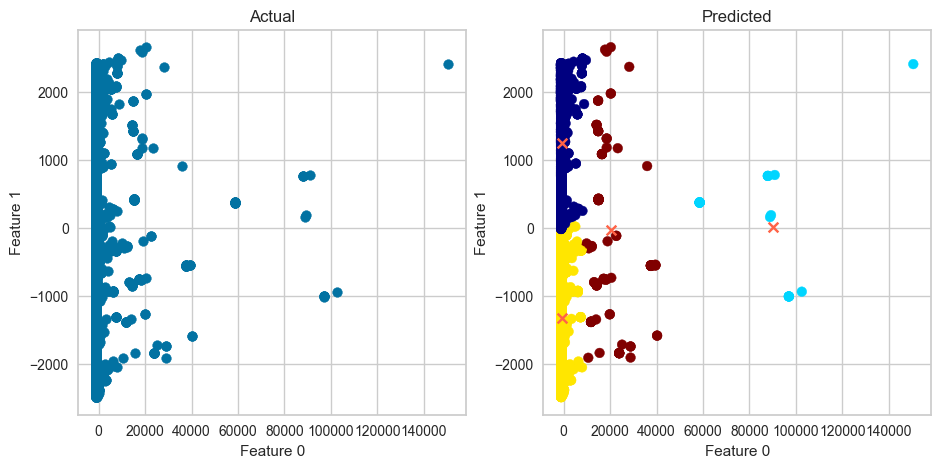

In [275]:
f, axes = plt.subplots(1, 2, figsize = (11, 5))

axes[0].scatter(X[:, feature1_index], X[:, feature2_index], cmap = 'gist_rainbow')

axes[1].scatter(X[:, feature1_index], X[:, feature2_index], c = fcm_labels, cmap = 'jet')
axes[1].scatter(fcm_centers[:, feature1_index], fcm_centers[:, feature2_index], marker = "x", c = 'tomato')

axes[0].set_xlabel('Feature 0')
axes[0].set_ylabel('Feature 1')

axes[1].set_xlabel('Feature 0')
axes[1].set_ylabel('Feature 1')

axes[0].set_title('Actual')
axes[1].set_title('Predicted')

plt.show()

Next, getting a total of **0.53** after calculating the Silhouette score based on four clusters.

In [276]:
print(f'Silhouette Score(n = 4): {silhouette_score(X, fcm_labels)}')

Silhouette Score(n = 4): 0.5397148705452791


Testing with 3 clusters and got a total of **0.47** after calculating the Silhouette score based on three clusters.

In [277]:
fuzzy = FCM(n_clusters = 3)

fuzzy.fit(X)

silhouette_score(X, fuzzy.predict(X))

0.4719204845241486

Next, visualising the clusters using a "Scatter Plot", for the **3** clusters and plotting their centroid points for each cluster using the features "`PCA Feature 0 and PCA Feature 1`".

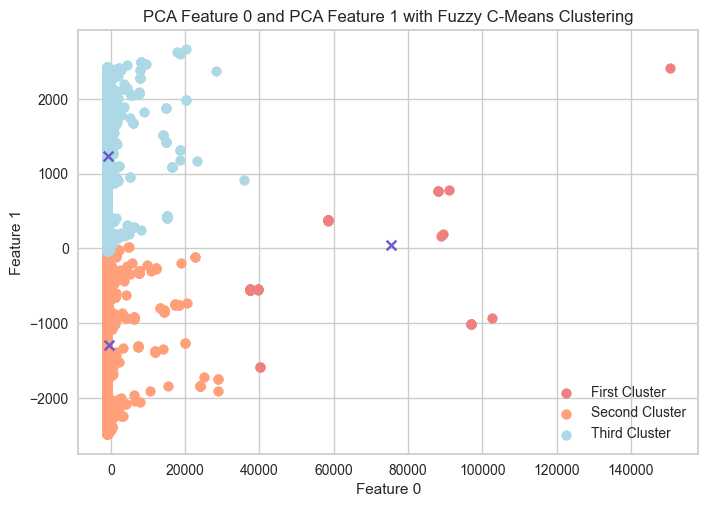

In [278]:
fuzzy = FCM(n_clusters = 3)
fuzzy.fit(X)
fcm_centers = fuzzy.centers
fcm_labels = fuzzy.u.argmax(axis = 1)

plt.scatter(X[fcm_labels == 0, feature1_index], X[fcm_labels == 0, feature2_index], s = 50, c = 'lightcoral', label = 'First Cluster')
plt.scatter(X[fcm_labels == 1, feature1_index], X[fcm_labels == 1, feature2_index], s = 50, c = 'lightsalmon', label = 'Second Cluster')
plt.scatter(X[fcm_labels == 2, feature1_index], X[fcm_labels == 2, feature2_index], s = 50, c = 'lightblue', label = 'Third Cluster')

plt.title("PCA Feature 0 and PCA Feature 1 with Fuzzy C-Means Clustering")
plt.scatter(fcm_centers[:, feature1_index], fcm_centers[:, feature2_index], marker = "x", c = 'slateblue')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')

plt.legend(loc = "best")
plt.show()

### 5.3.1 Fuzzy C-means Clustering Comparison of Davies-Bouldin Index and Silhouette Score

Next,
1. Creating a function to perform FCM Clustering and calculate metrics.
2. Creating a few variable arrays "db_scores and silhouette_scores" to store the values when executed.
3. Next, the results are plotted in a "Line graph" plot to compare the "Davies-Bouldin Index and Silhouette Score" and visualise the best number of clusters.
4. Next, getting the optimal number of clusters based on Silhouette Score metrics.
5. Creating a Fuzzy C-means Clustering with the optimal number of clusters.
6. Next, visualising the clusters using a "Scatter Plot", for each cluster in total got from the tests using the features "`PCA Feature 0 and PCA Feature 1`".

- **Note**: It needs time to run, when large number of observations.

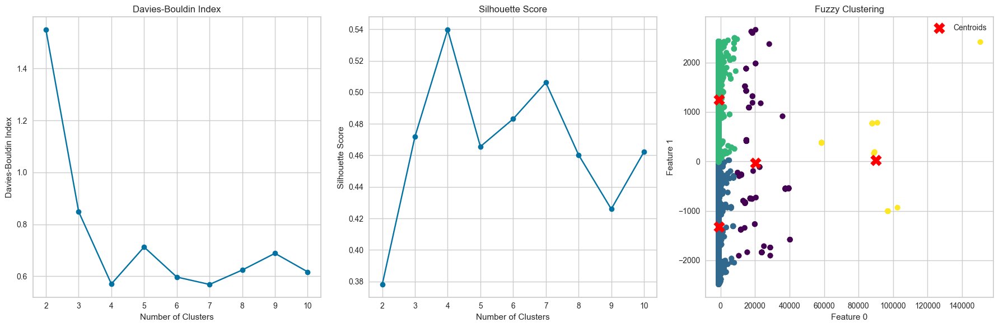

In [279]:
def perform_clustering(n_clusters, data):
    fuzzy = FCM(n_clusters = n_clusters)
    fuzzy.fit(data)
    labels = fuzzy.predict(data)
    db_index = davies_bouldin_score(X, labels)
    silhouette_avg = silhouette_score(X, labels)
    return db_index, silhouette_avg

cluster_range = range(2, 11)
db_scores = []
silhouette_scores = []

for n_clusters in cluster_range:
    db_index, silhouette_avg = perform_clustering(n_clusters, X)
    db_scores.append(db_index)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize = (18, 6))

# Davies-Bouldin Index
plt.subplot(1, 3, 1)
plt.plot(cluster_range, db_scores, marker='o')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')

# Silhouette Score
plt.subplot(1, 3, 2)
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

# Optimal number of clusters based on Silhouette Score
optimal_clusters_silhouette = np.argmax(silhouette_scores) + 2

# Fuzzy clustering with the optimal number of clusters
optimal_fuzzy = FCM(n_clusters = optimal_clusters_silhouette)
optimal_fuzzy.fit(X)
optimal_labels = optimal_fuzzy.predict(X)

plt.subplot(1, 3, 3)
plt.scatter(X[:, feature1_index], X[:, feature2_index], c = optimal_labels, cmap = 'viridis')
plt.scatter(optimal_fuzzy.centers[:, feature1_index], optimal_fuzzy.centers[:, feature2_index],
            s = 200, c = 'red', marker = 'X', label = 'Centroids')

plt.title('Fuzzy Clustering')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')
plt.legend()

plt.tight_layout()
plt.show()

Next, getting the optimal number of clusters based on the metrics.

Above, as represented in the "Line graph" plot, the number of clusters based on the Davies-Bouldin Index is 2 and Silhouette Score is 2, and next, plotted a "Scatter Plot" using the features "`PCA Feature 0 and PCA Feature 1`" with **2** clusters got from Silhouette Score.

In [280]:
optimal_clusters_db = np.argmin(db_scores) + 2 
optimal_clusters_silhouette = np.argmax(silhouette_scores) + 2 

print(f'Optimal Clusters (Davies-Bouldin): {optimal_clusters_db}')
print(f'Optimal Clusters (Silhouette): {optimal_clusters_silhouette}')

Optimal Clusters (Davies-Bouldin): 7
Optimal Clusters (Silhouette): 4


Next, visualising the clusters using a "Scatter Plot", for the **2** clusters from the Davies-Bouldin Index using the features "`PCA Feature 0 and PCA Feature 1`".

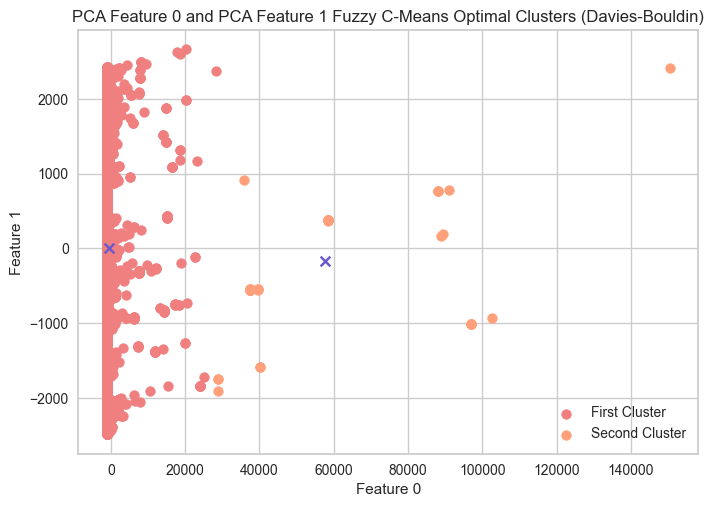

In [281]:
fuzzy = FCM(n_clusters = 2)
fuzzy.fit(X)
fcm_centers = fuzzy.centers
fcm_labels = fuzzy.u.argmax(axis = 1)

plt.scatter(X[fcm_labels == 0, feature1_index], X[fcm_labels == 0, feature2_index], s = 50, c = 'lightcoral', label = 'First Cluster')
plt.scatter(X[fcm_labels == 1, feature1_index], X[fcm_labels == 1, feature2_index], s = 50, c = 'lightsalmon', label = 'Second Cluster')

plt.title("PCA Feature 0 and PCA Feature 1 Fuzzy C-Means Optimal Clusters (Davies-Bouldin)")
plt.scatter(fcm_centers[:, feature1_index], fcm_centers[:, feature2_index], marker = "x", c = 'slateblue')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')

plt.legend(loc = "best")
plt.show()

## 5.4 Comparison of Clusters

Creating a comparison with **3** clusters between "K-Means Clustering", "K-Medoids Clustering" and "Fuzzy C-means Clustering".

First, splitting the data to use in the Unsupervised Machine Learning model algorithm.

- **Clusters:** kmeans, kMedoids and fuzzy
- **Predict/Labels:** y_kmeans, y_kmc and fcm_labels

In [282]:
# K-Means Clustering
kmeans = KMeans(n_clusters = 3, max_iter = 300, n_init = 10, random_state = 38)
y_kmeans = kmeans.fit_predict(X) 

# K-Medoids Clustering
kMedoids = KMedoids(n_clusters = 3, random_state = 38)
centers = kMedoids.fit(X)
y_kmc = kMedoids.predict(X)

# Fuzzy C-means Clustering
fuzzy = FCM(n_clusters = 3)
fuzzy.fit(X)
fcm_centers = fuzzy.centers
fcm_labels = fuzzy.u.argmax(axis = 1)

Plotting the results

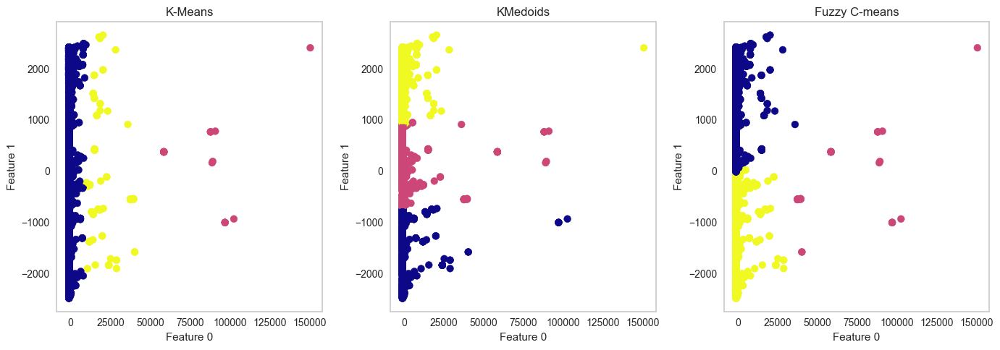

In [283]:
plt.figure(figsize = (14, 5))

plt.subplot(1, 3, 1)
plt.title("K-Means")
plt.scatter(X[:, feature1_index], X[:, feature2_index], c = y_kmeans, s = 50, cmap = 'plasma')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')
plt.grid(False)

plt.subplot(1, 3, 2)
plt.title("KMedoids")
plt.scatter(X[:, feature1_index], X[:, feature2_index], c = y_kmc, s = 50, cmap = 'plasma')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')
plt.grid(False)

plt.subplot(1, 3, 3)
plt.title("Fuzzy C-means")
plt.scatter(X[:, feature1_index], X[:, feature2_index], c = fcm_labels, s = 50, cmap = 'plasma')
plt.xlabel(f'Feature {feature1_index}')
plt.ylabel(f'Feature {feature2_index}')

plt.tight_layout()
plt.grid(False)
plt.show()

In the graphic above it is possible to visualise that using "K-Means Clustering", "K-Medoids Clustering" and "Fuzzy C-means Clustering" are getting different clusters analysing the colours but all of them with 3 clusters or more are getting greats results.

Calculate Silhouette Scores and Davies Bouldin Score

In [284]:
print("Silhouette Scores:\n")
print("K-Means Clustering silhouette: ", silhouette_score(X, y_kmeans))
print("K-Means Clustering davies_bouldin: ", davies_bouldin_score(X, y_kmeans))
print("")
print("KMedoids Clustering: ", silhouette_score(X, y_kmc))
print("KMedoids Clustering: ", davies_bouldin_score(X, y_kmc))
print("")
print("Fuzzy C-means Clustering: ", silhouette_score(X, fcm_labels))
print("Fuzzy C-means Clustering: ", davies_bouldin_score(X, fcm_labels))

Silhouette Scores:

K-Means Clustering silhouette:  0.8936759621928977
K-Means Clustering davies_bouldin:  0.4243795166210664

KMedoids Clustering:  0.3226245486491332
KMedoids Clustering:  2.446391911276591

Fuzzy C-means Clustering:  0.4719204845241486
Fuzzy C-means Clustering:  0.848789153067259


## 6.1 Machine Learning - Linear Regression

4. Train a model to predict and improve sales.

Creating a linear regression model to predict sales using "`PriceEUR`" and "`boughtLastMonth`" as the predictor feature.

As before in the topic "4. Machine Learning - Supervised" it will be loading the data once again, but this time with the 2 million of observations and just the features "`title, price, isBestSeller, boughtInLastMonth and categoryName`".

Next, applying the essential techniques to use the dataset properly such as: Loading the data, renaming the features, converting pounds to euro, renaming the price feature, encoding: "Title, Category" and changing the "BestSeller" feature from boolean to int change the values False and True to 0 and 1, running in **2.84** seconds.

In [285]:
start_time = time.time()

df = pd.read_csv("amz_uk_processed_data.csv",
                usecols = ["title", "price", "isBestSeller", "boughtInLastMonth", "categoryName"])
                # nrows = num_rows)

df["price"] = df["price"] * 1.16
df = df.rename(columns = {'title': 'Title', 
                          'boughtInLastMonth': 'boughtLastMonth', 
                          'price': 'PriceEUR',
                          'isBestSeller': 'BestSeller',
                          'categoryName': "Category"})

end_time = time.time()
print("Imported in {:.2f} seconds.".format(end_time - start_time))
%time

Imported in 2.85 seconds.
CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 µs
Wall time: 4.05 µs


In [286]:
encoder_Title = LabelEncoder()
df['Title'] = encoder_Title.fit_transform(df['Title'])

encoder_Category = LabelEncoder()
df['Category'] = encoder_Category.fit_transform(df['Category'])

df['BestSeller'].replace(False, 0, inplace = True)
df['BestSeller'].replace(True, 1, inplace = True)

Analysing the feature "`boughtLastMonth`", there is **2061427** of products in the dataset without bought in the last month turning the data Imbalanced against **161315** bought in the last month.

In [287]:
df["boughtLastMonth"].value_counts().nlargest(5)

boughtLastMonth
0      2061427
50       63601
100      44173
200      17509
300       9523
Name: count, dtype: int64

In [288]:
df["boughtLastMonth"][df["boughtLastMonth"] == 0].value_counts()[0]

2061427

In [289]:
len(df) - df["boughtLastMonth"][df["boughtLastMonth"] == 0].value_counts()[0]

161315

Next, plotting it in a bar chart to visually the difference.

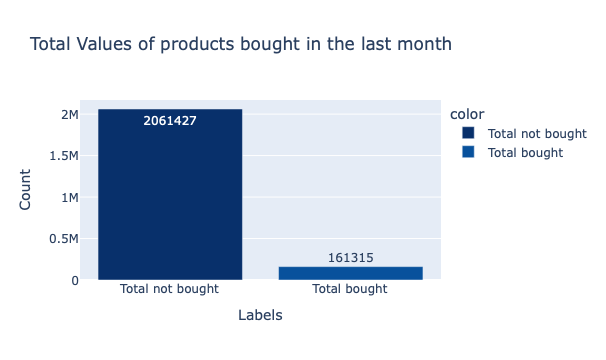

In [290]:
total_not_bought = df["boughtLastMonth"][df["boughtLastMonth"] == 0].value_counts()[0]
total_values = len(df) - total_not_bought

labels = ['Total not bought', 'Total bought']
values = [total_not_bought, total_values]

fig = px.bar(df, y = values, x = labels, text_auto = '.7',
            title = "Total Values of products bought in the last month",
            labels = {'x': 'Labels', 'y': 'Count'},
            color = labels, color_discrete_sequence = px.colors.sequential.Blues_r)
fig.show()

Created an attempt to convert the total of values bought in the last month to 1 if bought and 0 otherwise, left the command commented below and opted not to keep it in the future analysis, but can be another perspective to test it.

In [291]:
# df["boughtLastMonth"] = df["boughtLastMonth"].apply(lambda x: 1 if x != 0 else 0)

Overwriting the data frame "df_ML" with a copy of "df" data frame.  

In [292]:
df_ML = df.copy()

Splitting the features into `X and y` to transform, train and test, "`X`" by getting the feature "`PriceEUR`" and "`y`" variable the feature "`boughtLastMonth`" as a Target, not transforming the features, and creating the variables "`X_train, X_test, y_train and y_test`", for training and testing the model, choosing 30% of the data for testing with a set random_state = 43 and 70% of the data for training.  

In [293]:
X = df_ML["PriceEUR"].copy()
y = df_ML["boughtLastMonth"].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Transforming "`X_train and X_test`" to numpy, to be possible to use in the LinearRegression model. 

In [294]:
X_train = X_train.to_numpy()[:, np.newaxis]
X_test = X_test.to_numpy()[:, np.newaxis]

Checking the amount of item bought Last Month

In [295]:
y.value_counts()

boughtLastMonth
0        2061427
50         63601
100        44173
200        17509
300         9523
400         5996
1000        5424
500         4059
600         2815
700         2030
800         1594
2000        1521
900         1320
3000         675
4000         348
5000         227
10000        139
6000         136
7000          91
8000          59
9000          56
20000         14
50000          2
30000          2
40000          1
Name: count, dtype: int64

### 6.1.1 Applying Linear Regression

Importing the method “`LinearRegression`" from "sklearn.linear_model" library in “4.2.1 topic”, to transform "`X_train and y_train`" in LinearRegression to "`lr`" variable and getting a prediction of "`X_test`" to "`y_pred`".

In [296]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

In [297]:
print("Intercept value", lr.intercept_, "and coef_ value", lr.coef_)

Intercept value 19.616897209952477 and coef_ value [-0.00959496]


Next getting "Mean_Squared_Error and r_square_value" values. 

In [298]:
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)

print('Mean Squared Error:', mse, 'and r square value:', r_squared)

Mean Squared Error: 38720.919626095754 and r square value: 0.00045685508467663283


Next, plotting the scatter plot of the training data, after finding the y-intercept of the regression line and also plotting the regression line in. 

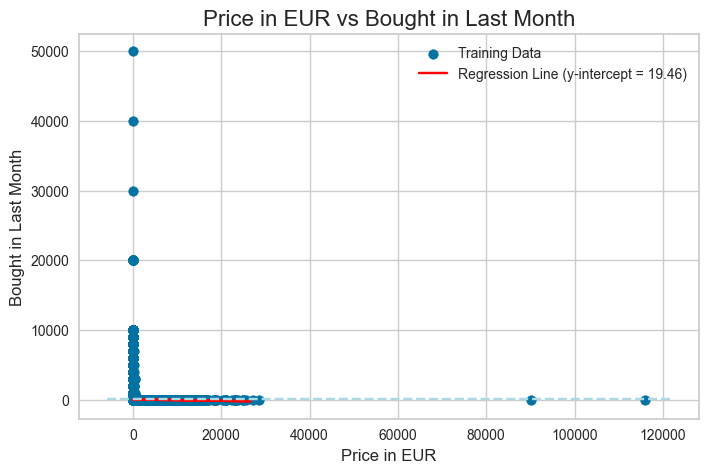

In [299]:
y_intercept = y_pred[0]

plt.figure(figsize = (8, 5))

plt.scatter(X_train, y_train, label = 'Training Data')

plt.plot(X_test, y_pred, color = 'red', label = f'Regression Line (y-intercept = {y_intercept:.2f})')

x_min, x_max = plt.xlim()

plt.plot([x_min, x_max], [y_intercept + 0 * x_min, y_intercept + 0 * x_max], color = 'lightblue', linestyle = '--')

plt.xlabel('Price in EUR', fontsize = 12)
plt.ylabel('Bought in Last Month', fontsize = 12)
plt.title('Price in EUR vs Bought in Last Month', fontsize = 16)

plt.legend()
plt.show()

Next plotting a Model Predictions

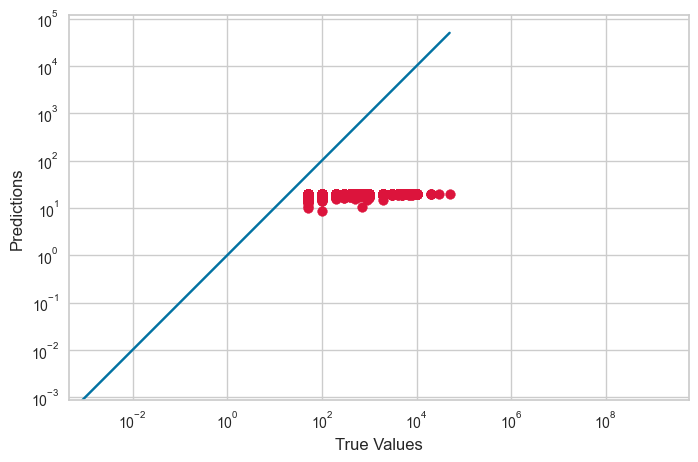

In [300]:
plotSplit = 700
plt.figure(figsize = (8,5))

plt.scatter(y_test[plotSplit:], y_pred[plotSplit:], c = 'crimson')
plt.yscale('log')
plt.xscale('log')

p1 = max(max(y_pred[plotSplit:]), max(y_test[plotSplit:]))
p2 = min(min(y_pred[plotSplit:]), min(y_test[plotSplit:]))
plt.plot([p1, p2], [p1, p2], 'b-')

plt.xlabel('True Values', fontsize = 12)
plt.ylabel('Predictions', fontsize = 12)
plt.axis('equal')

plt.show();

And creating a Data Frame with "`Actual test value and Predicted value`"

In [301]:
df_predict = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df_predict.head()

,Actual,Predicted
1827328,0,19.455621
142639,0,19.550673
950197,0,19.472317
1448965,0,19.530193
1378060,0,19.389953


In [302]:
df_predict[df_predict["Actual"] > 1].head()

,Actual,Predicted
178699,50,19.416666
1256133,600,19.539097
1793519,100,19.461186
611249,50,19.450056
610557,100,19.427796


In [303]:
max_value_predicted = df_predict["Predicted"].max()
max_value_predicted

19.616897209952477

In [304]:
df_predict[df_predict["Predicted"] >= max_value_predicted].head()

,Actual,Predicted
338968,0,19.616897
766893,0,19.616897
805751,0,19.616897
800544,0,19.616897
800198,0,19.616897


Importing the method "`metrics`" from "sklearn" library in “6.1.1 topic, to get the results of "Mean Absolute Error, Mean Squared Error and Root Mean Squared Error"

In [305]:
from sklearn import metrics

print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred))
print("R^2 Score", r2_score(y_test, y_pred))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 34.547804458431074
Mean Squared Error: 38720.919626095754
R^2 Score 0.00045685508467663283
Root Mean Squared Error: 196.77631876345222


As checked before, the data are overfitting and imbalanced, so the results will not be good for predictions.

### 6.1.2 Linear Regression - Hyperparameter Tuning in Linear Regression

Example leaned from the article "Hyperparameter Tuning in Linear Regression" (GeeksforGeeks, 2024).

Previously, it got **0.045** as a result of the accuracy of the model.

In [306]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

print(r2_score(y_test, y_pred) * 100)

0.04568550846766328


The model's accuracy is "`0.04 %`" it is bad, it will try hyperparameter tuning and check wether can get better results.

Checking first the parameters used in the previous model: {'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}.

In [307]:
lr.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Creating a dictionary of parameters to test it.

In [308]:
parameters = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'n_jobs': [1, 5, 10, 15, 20, 30, None],
    'positive': [True, False]
}

Next, splliting once again "X and y" train and test, and creating the model.

In [309]:
X = df_ML["PriceEUR"].copy()
y = df_ML["boughtLastMonth"].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

X_train = X_train.to_numpy()[:, np.newaxis]
X_test = X_test.to_numpy()[:, np.newaxis]

lr = LinearRegression()

**GridSearchCV**

Next, applying GridSearchCV to the parameters defined before to get the best parameters results and check the model accuracy after using the best parameters, getting the model's accuracy with "`0.00046 %`" worse than before.

In [310]:
grid_search = GridSearchCV(lr, parameters, cv = 5)
grid_search.fit(X_train, y_train)

print(f"Best Hyperparameters: {grid_search.best_params_}")
print(f"Best Score: {grid_search.best_score_}")

Best Hyperparameters: {'copy_X': True, 'fit_intercept': True, 'n_jobs': 1, 'positive': False}
Best Score: 0.0004600036356468218


**RandomizedSearchCV**

Next, applying RandomizedSearchCV to the parameters defined before to get the best parameters results and check the model accuracy after using the best parameters, getting the model's accuracy with "`0.00046 %`" worse than before, similar to the result of GridSearchCV.

In [311]:
random_search = RandomizedSearchCV(lr, parameters, n_iter = 100, cv = 5)
random_search.fit(X_train, y_train)

print(f"Best Hyperparameters: {random_search.best_params_}")
print(f"Best Score: {random_search.best_score_}")

Best Hyperparameters: {'positive': False, 'n_jobs': 1, 'fit_intercept': True, 'copy_X': True}
Best Score: 0.0004600036356468218


### 6.1.3 Linear Regression - Imbalanced with RandomOverSampler 

Next, it will apply a "RandomOverSampler" to balance the dataset and apply Linear Regression once again, an example learned from the article "Handling Imbalanced Data by Oversampling with SMOTE and its Variants" (Bordia, 2022).

Tried "No oversampling, Random Oversampling, SMOTE, BorderlineSMOTE, SVM SMOTE, K-Means SMOTE" and the only one that works for this case is "Random Oversampling". 

As before in the topic "4. Machine Learning - Supervised and 6.1 Machine Learning - Linear Regression" it will be loading the data once again, but this time getting a sample of observations and just the features "`title, price, isBestSeller, boughtInLastMonth and categoryName`".

Next, applying the essential techniques to use the dataset properly such as: Loading the data, renaming the features, converting pounds to euro, renaming the price feature, encoding: "Title, Category" and changing the "BestSeller" feature from boolean to int change the values False and True to 0 and 1, running in **0.03** seconds.

In [312]:
start_time = time.time()

df = pd.read_csv("amz_uk_processed_data.csv",
                usecols = ["title", "price", "isBestSeller", "boughtInLastMonth", "categoryName"],#)
                nrows = 10000)

df["price"] = df["price"] * 1.16
df = df.rename(columns = {'title': 'Title', 
                          'boughtInLastMonth': 'boughtLastMonth', 
                          'price': 'PriceEUR',
                          'isBestSeller': 'BestSeller',
                          'categoryName': "Category"})

end_time = time.time()
print("Imported in {:.2f} seconds.".format(end_time - start_time))
%time

Imported in 0.03 seconds.
CPU times: user 2 µs, sys: 18 µs, total: 20 µs
Wall time: 4.29 µs


In [313]:
encoder_Title = LabelEncoder()
df['Title'] = encoder_Title.fit_transform(df['Title'])

encoder_Category = LabelEncoder()
df['Category'] = encoder_Category.fit_transform(df['Category'])

df['BestSeller'].replace(False, 0, inplace = True)
df['BestSeller'].replace(True, 1, inplace = True)

Creating the data frame "df_ML_ROS" with a copy of "df" data frame, and splitting "X and y" to test, train and predict.  

In [314]:
df_ML_ROS = df.copy()

X = df_ML_ROS.drop("boughtLastMonth", axis = 1)
y = df_ML_ROS["boughtLastMonth"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Importing "RandomOverSampler" from "imblearn.over_samplin" library in “6.1.3 topic.

In [315]:
from imblearn.over_sampling import RandomOverSampler

Next, it applying RandomOverSampler, is possible to see the difference in the data before importing **10000** observations and now, after balancing, got a total of **41934** observations.

In [316]:
ros = RandomOverSampler(random_state = 43)
X_random_resampled, y_random_resampled = ros.fit_resample(X_train, y_train)

print("X Before:", X.shape, "- X After", X_random_resampled.shape)
print("y Before:", y.shape, "- y After",  y_random_resampled.shape)

X Before: (10000, 4) - X After (41934, 4)
y Before: (10000,) - y After (41934,)


Applying the "LinearRegression" model.

In [317]:
lr = LinearRegression()
lr.fit(X_random_resampled, y_random_resampled)

y_pred = lr.predict(X_test)
print(r2_score(y_test, y_pred) * 100)

-205081.1880205872


Next, getting the Mean Squared Error and R2 Score, and seems not as good as tried before balanced. 

In [318]:
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))
print("R^2 Score", r2_score(y_test, y_pred))

Mean Squared Error: 35860.54213629813
R^2 Score -2050.811880205872


Next, plotting the results.

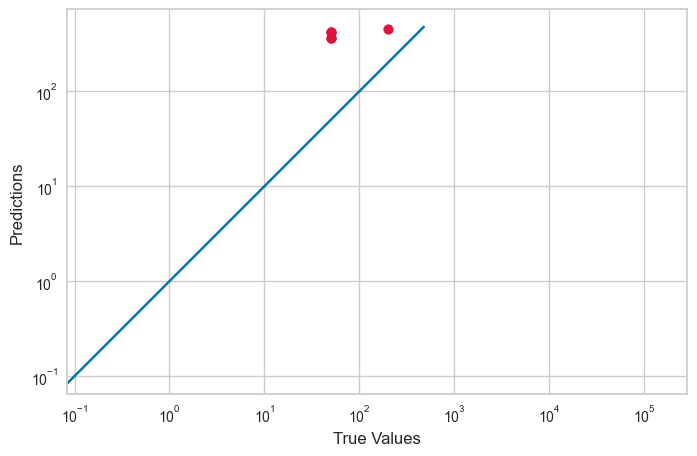

In [319]:
plotSplit = 700
plt.figure(figsize = (8,5))

plt.scatter(y_test[plotSplit:], y_pred[plotSplit:], c = 'crimson')
plt.yscale('log')
plt.xscale('log')

p1 = max(max(y_pred[plotSplit:]), max(y_test[plotSplit:]))
p2 = min(min(y_pred[plotSplit:]), min(y_test[plotSplit:]))
plt.plot([p1, p2], [p1, p2], 'b-')

plt.xlabel('True Values', fontsize = 12)
plt.ylabel('Predictions', fontsize = 12)
plt.axis('equal')

plt.show();

#### 6.1.3.1 Linear Regression - Imbalanced with RandomOverSampler 

Now, instead of getting all features as before, it will use the all features to balance, and next it will get just the "PriceEUR" and "boughtLastMonth" features as a target.

Same as before, creating the data frame "df_ML_ROS" with a copy of "df" data frame and splitting "X and y" to test, train and predict.

In [320]:
df_ML_ROS = df.copy()

X = df_ML_ROS.drop("boughtLastMonth", axis = 1)
y = df_ML_ROS["boughtLastMonth"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

Next, it applying RandomOverSampler, is possible to see the difference in the data before importing **10000** observations and now, after balancing, got a total of **41934** observations.

In [321]:
ros = RandomOverSampler(random_state = 43)
X_random_resampled, y_random_resampled = ros.fit_resample(X_train, y_train)

print("X Before:", X.shape, "- X After", X_random_resampled.shape)
print("y Before:", y.shape, "- y After",  y_random_resampled.shape)

X Before: (10000, 4) - X After (41934, 4)
y Before: (10000,) - y After (41934,)


Next, splitting X and y, getting just the features "PriceEUR" in "X" and "boughtLastMonth" in "y".

In [322]:
X = X_random_resampled["PriceEUR"].copy()
y = y_random_resampled.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

X_train = X_train.to_numpy()[:, np.newaxis]
X_test = X_test.to_numpy()[:, np.newaxis]

print("X Shape:", X.shape, "y shape:", y.shape)

X Shape: (41934,) y shape: (41934,)


In [323]:
print("X_train Shape:", X_train.shape, "y_train shape:", y_train.shape)
print("X_test Shape:", X_test.shape, "y_test shape:", y_test.shape)

X_train Shape: (29353, 1) y_train shape: (29353,)
X_test Shape: (12581, 1) y_test shape: (12581,)


Applying the "LinearRegression" model

In [324]:
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
print(r2_score(y_test, y_pred) * 100)

2.413062582145453


Next, getting the Mean Squared Error and R2 Score, and seems not as good as tried before balanced. 

In [325]:
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))
print("R^2 Score", r2_score(y_test, y_pred))

Mean Squared Error: 125951.45342641587
R^2 Score 0.024130625821454532


In [326]:
print(r2_score(y_test, y_pred) * 100)

2.413062582145453


Next, plotting the results.

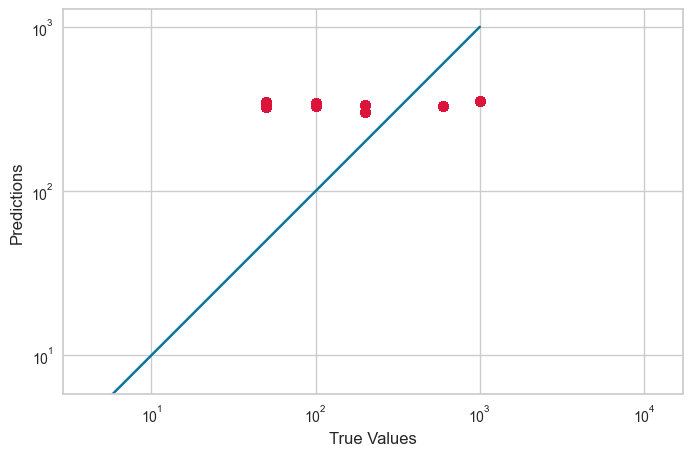

In [327]:
plotSplit = 700
plt.figure(figsize = (8,5))

plt.scatter(y_test[plotSplit:], y_pred[plotSplit:], c = 'crimson')
plt.yscale('log')
plt.xscale('log')

p1 = max(max(y_pred[plotSplit:]), max(y_test[plotSplit:]))
p2 = min(min(y_pred[plotSplit:]), min(y_test[plotSplit:]))
plt.plot([p1, p2], [p1, p2], 'b-')

plt.xlabel('True Values', fontsize = 12)
plt.ylabel('Predictions', fontsize = 12)
plt.axis('equal')

plt.show();

Trying this approach shows that got better results than previously.

Next it, will be used GridSearchCV and RandomizedSearchCV to tried get best results.

Previously, it got **2.41** as a result of the accuracy of the model.

Creating a dictionary of parameters to test it.

In [328]:
parameters = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'n_jobs': [1, 5, 10, 15, 20, 30, None],
    'positive': [True, False]
}

Next, splitting once again "X and y" train and test, and creating the model and repeating what was applied before to create the model for testing appropriately.

In [329]:
df_ML_ROS = df.copy()

X = df_ML_ROS.drop("boughtLastMonth", axis = 1)
y = df_ML_ROS["boughtLastMonth"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

ros = RandomOverSampler(random_state = 43)
X_random_resampled, y_random_resampled = ros.fit_resample(X_train, y_train)

X = X_random_resampled["PriceEUR"].copy()
y = y_random_resampled.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 43) 

X_train = X_train.to_numpy()[:, np.newaxis]
X_test = X_test.to_numpy()[:, np.newaxis]

lr = LinearRegression()

**GridSearchCV**

Next, applying GridSearchCV to the parameters defined before to get the best parameters results and check the model accuracy after using the best parameters, getting the model's accuracy with "`0.03 %`" worse than before.

In [330]:
grid_search = GridSearchCV(lr, parameters, cv = 5)
grid_search.fit(X_train, y_train)

print(f"Best Hyperparameters: {grid_search.best_params_}")
print(f"Best Score: {grid_search.best_score_}")

Best Hyperparameters: {'copy_X': True, 'fit_intercept': True, 'n_jobs': 1, 'positive': False}
Best Score: 0.03722813178684805


**RandomizedSearchCV**

Next, applying RandomizedSearchCV to the parameters defined before to get the best parameters results and check the model accuracy after using the best parameters, getting the model's accuracy with "`0.037 %`" worse than before, similar to the result of GridSearchCV.

In [331]:
random_search = RandomizedSearchCV(lr, parameters, n_iter = 100, cv = 5)
random_search.fit(X_train, y_train)

print(f"Best Hyperparameters: {random_search.best_params_}")
print(f"Best Score: {random_search.best_score_}")

Best Hyperparameters: {'positive': False, 'n_jobs': 1, 'fit_intercept': True, 'copy_X': True}
Best Score: 0.03722813178684805


---

## Conclusions

The first stage of this Capstone project started on March 14th and concluded on March 28th, according to the progress presented in “Figure 7. Timeline Plot of Stage 1 - Project Plan / Business Understanding”, it was focused on Project planning and Business Understanding. In the beginning, it was challenging to choose a good data set for this Study, where lots of data sets with different areas of expertise made it hard to pick just one, after searching and finally choosing one, it was started some reading and analysis about the dataset itself, also planned and started the Capstone Document limited to Word Count: 1,000 words, with the sections of Introduction, Objectives, Problem Definition, Scope, Data Sources, Ethical Considerations, Conclusions and References, for the first Assessment Task in the course. 

Before starting the following stages of this Capstone project, it was corrected some topics in this document were after receiving feedback from the Lecturer, steps such as Objectives, Introduction, Problem Definition, Scope, Ethical Considerations and Timeline Plot were all properly updated and created if they did not exist before.

The second stage Data Understanding started on April 22nd and concluded on April 30th, according to the progress presented in “Figure 8. Timeline Plot of Stage 2 - Data Understanding”, it was focused on uploading necessary files and importing libraries, loading data, inspecting the data set, finding unique values and overviewing the data itself.

The third stage Data Preparation started on April 30th and concluded on March 18th, according to the progress presented in “Figure 9. Timeline Plot of Stage 3 - Data Preparation”, it was focused on Exploratory Data Analysis, with activities like dropping irrelevant columns, renaming columns, replacing values (syntax errors), handling/imputing missing values, handling duplicate rows, variable encoding, type conversion, handling outliers, feature scaling, feature creation, text data processing, time series features, feature selection (ANOVA test and Chi-Square Test), feature extraction and so on.

In this step, due to a large amount of information, it was challenging to manage it, it was spending considerable time learning some new things to apply in the project and at the same time having considerable patience time to wait for the analysis feedback, some steps such a present some graphs desired in the Exploratory Data Analysis task were not possible, due to the much information contained in the features, also using the LDA technique expend approximately an hour to complete the analyses and get the result between the algorithms tested, but even it was possible to complete the objectives 1, 2, 3 and 4.

The fourth stage Modelling (Machine Learning Implementation) started on March 18th and concluded on March 19th, according to the progress presented in “Figure 10. Timeline Plot of Stage 3 - Machine Learning”, it was focused on Machine Learning Algorithms, in this case, used Logistic Regression, Decision Tree, Random Forest, KNN - K Neighbors Classifier and Linear Regression, to conclude the objectives 5 and 6, which good results were obtained. 

Due to unforeseen circumstances and not properly planning the time, the deadline for completing this project was exceeded, according to the progress presented in “Figure 11. Timeline Plot of Went past the deadline”, but with this, it was possible to finish all planned steps with more time, review all steps, learned and applied approaches, analysed better and write the ipynb and word document properly.

Some future recommendations of this Capstone Project are getting better results from objective 3, optimise the database for better analysis to expend less time waiting, evaluation step following CRISP-DM Phases of the Machine Learning algorithms in case it is needed, using GridSearchCV, hyperparameters, and so on, testing new approaches for analyses, new Machine Learning Algorithms approaches and the Deployment phase of the model as an API. 

Furthermore, some limitations were faced as impediments to continuing the project and had to pause, objectives 8 and 9 for example, it is only possible to continue if it finished objective 7 first, due to the large text in the Title feature, a potential solution for future improvements should be dealt with this situation first decreasing text size, before to continue the previous recommendations. Finishing this document after adding a new Word count of ~2,000, Capstone Project is available on the GitHub website on this link, also, all References from the ipynb and word document are available in both documents.

In the fifth stage Evaluation, started on October 28th and concluded on November 5th, according to the progress presented in “Figure 12. Timeline Plot of Phase 5 - Updates/Analysis and Repeating previous phases”, this stage was focused on the evaluation and turning the project better than before, with updates, new tests, analyses and implementations.

During this phase, it was important to identify strengths and weaknesses of the capstone project and apply improvements to change it better, challenges during the development of the stages were faced all the time, working with a large dataset is a big tournament, some techniques were tested to improve performance once the database in .csv file weighs 651.1 MB, to load it takes 4.23 seconds on the developer computer, using considerable CPU cores and allocating a lot of space in memory, such as 1.1 GB just at the beginning of the import, after analyses opted to use 2 M observations when necessary to understand and create basics analyses and when used in Machine Learning change to use a sample of it.

Created a few analyses to explore the data set and answered them all in the Exploratory Data Analysis topic, it updated the algorithms of Machine Learning Supervised (Logistic Regression, Decision Tree Classifier, Random Forest Classifier, Random Forest Regressor and Neighbors Classifier) evaluation with Hyperparameter tuning and cross-validation, also applied LIME and SHAP to understand a little bit how the models are working.

Created another perspective using machine learning, in this time, with Unsupervised Machine Learning, using PCA (Principal Component Analysis) to create two features from the original data set getting the strong signal of it, next applied in K-Means Clustering, K-Medoids Clustering and Fuzzy C-Means Clustering, validating using the Davies-Bouldin Index and Silhouette Score, with a comparison of Clusters in the end.

Tried to apply a few techniques of Text Summarization such as "SUMY, BERT Extractive Summarization, T5 Abstractive Summarization, Gensim, TextTeaser and NLTK" to transform the title of products smaller to easily use it and visualise but did not get good results, so instead decided to create a manual temporarily solution to get the text title until finds a few symbols like: "|:–,". Also, created a simple Content-Based Recommender System using Cosine Similarity.

Also, it completed Phase 6 - Production of Report, which started on November 6th and concluded on November 8th, according to the progress presented in “Figure 13. Timeline Plot of Phase 6 - Production of Report”, and Phase 7 - Presentation, started on November 10th and concluded on November 11th, according to the progress presented in “Figure 14. Timeline Plot of Phase 7 - Presentation”.

The objectives until here were concluded, furthermore, a few recommendations, such as: removing emojis from the product name feature, creating a potential solution to train a generator of optimised titles to resolve this situation of large texts decreasing size, training a model to recommend the best products deeply and train a model to predict if a product could be bought with better accuracy and try to get around the problem of overfitting and imbalanced data.

Finishing this document after adding a new Word count of ~5,000, Capstone Project is available on the GitHub website on this link, all References from the ipynb, word document and Poster are available in both documents. Finally, the video presentation is available on this link, also, the link is available in the References.

---

## Data Dictionary 

1. **asin:** Product ID from Amazon. (type:str)
2. **title:** Title of the product. (type:str)
3. **imgUrl:** Url of the product image. (type:str)
4. **productURL:** Url of the product. (type:str)
5. **stars:** Product rating. If 0, no ratings were found. (type:float)
6. **reviews:** Number of reviews. If 0, no reviews were found. (type:int)
7. **price:** Buy now price of the product. If 0, price was unavailable. (type:float, currency: GBP)
8. **isBestSeller:** Whether the product had the Amazon BestSeller status or not. (type:bool)
9. **boughtInLastMonth:** Number of products sold last month according to Amazon. (type: int)
10. **categoryName:** Name of the category this product belonged to

---

## References

Albon, C. (2018). Machine learning with Python cookbook practical solutions from preprocessing to deep learning. Cambridge O’reilly.

aldemuro (2018). Comparing ML algorithms, train ACCURACY > 90%. [online] Kaggle.com. Available at: https://www.kaggle.com/code/aldemuro/comparing-ml-algorithms-train-accuracy-90#Introduction [Accessed Nov. 2024].

Analytics Vidhya (2019). Comprehensive Guide to Text Summarization using Deep Learning in Python. [online] Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2019/06/comprehensive-guide-text-summarization-using-deep-learning-python/ [Accessed 2024].

Asaniczka (2023). Amazon UK Products Dataset 2023 (2.2M Products). [online] www.kaggle.com. Available at: https://www.kaggle.com/datasets/asaniczka/amazon-uk-products-dataset-2023/data [Accessed 20 Mar. 2024].

Bordia, A. (2022). Handling Imbalanced Data by Oversampling with SMOTE and its Variants. [online] Analytics Vidhya. Available at: https://medium.com/analytics-vidhya/handling-imbalanced-data-by-oversampling-with-smote-and-its-variants-23a4bf188eaf [Accessed Nov. 2024].

CCT College Library (2023). Library: Academic Posters: Home. [online] Library.cct.ie. Available at: https://library.cct.ie/Posters/home [Accessed 6 Nov. 2024].

Cereniyim (2019). Distribution plot with mean and median. [online] GitHub Gist. Available at: https://gist.github.com/cereniyim/df1c8646411cc34eb9720a79400a200f [Accessed 11 May 2024].

Cristhian Macedo (2024a). CristhianMacedo_SThinkingHDip_CA3 Video. [online] CCT Google Drive. Available at: https://drive.google.com/drive/folders/1qzihv0SZoogog972l5_btjn5AGe27GLt?usp=sharing [Accessed 10 Nov. 2024].

Data Science Process Alliance (2021). Evaluating CRISP-DM for Data Science. [online] Available at: https://www.datascience-pm.com/wp-content/uploads/2021/08/CRISP-DM-for-Data-Science.pdf.

Deb, D. (2020). Comparing the performance of different machine learning algorithms. [online] Dibyendu Deb. Available at: https://dibyendudeb.com/comparing-machine-learning-algorithms/ [Accessed Nov. 2024].

Domino Data Lab (2024). What is Feature Engineering? | Domino Data Science Dictionary. [online] domino.ai. Available at: https://domino.ai/data-science-dictionary/feature-engineering [Accessed 12 May 2024].

Gaurav, P. (2023). Step By Step Content-Based Recommendation System. [online] Medium. Available at: https://medium.com/@prateekgaurav/step-by-step-content-based-recommendation-system-823bbfd0541c [Accessed 2 Nov. 2024].

GeeksforGeeks (2018a). Get n-largest values from a particular column in Pandas DataFrame. [online] GeeksforGeeks. Available at: https://www.geeksforgeeks.org/get-n-largest-values-from-a-particular-column-in-pandas-dataframe/ [Accessed 23 May 2024].

GeeksforGeeks (2018b). Principal Component Analysis(PCA). [online] GeeksforGeeks. Available at: https://www.geeksforgeeks.org/principal-component-analysis-pca/ [Accessed 18 May 2024].

GeeksforGeeks (2024). Hyperparameter Tuning in Linear Regression. [online] GeeksforGeeks. Available at: https://www.geeksforgeeks.org/hyperparameter-tuning-in-linear-regression/ [Accessed Nov. 2024].

Grammarly (2009). Grammarly. [online] Grammarly.com. Available at: https://app.grammarly.com/.

Hai Huang (2024). What are the best practices for feature selection in machine learning? [online] www.linkedin.com. Available at: https://www.linkedin.com/advice/3/what-best-practices-feature-selection-machine-u9crc [Accessed 12 May 2024].

Hashmi, F. (2021). Advertisement click classification case study in Python - Thinking Neuron. [online] Thinking Neuron. Available at: https://thinkingneuron.com/advertisement-click-classification-case-study-in-python/ [Accessed 16 May 2024].

Itamar Turner-Trauring (2019). Reducing Pandas memory usage #1: lossless compression. [online] Python⇒Speed. Available at: https://pythonspeed.com/articles/pandas-load-less-data/ [Accessed 30 Oct. 2024].

Kaggle (2019). Kaggle: Your Home for Data Science. [online] Kaggle.com. Available at: https://www.kaggle.com.

Keita, Z. (2023). Explainable AI - Understanding and Trusting Machine Learning Models. [online] Datacamp.com. Available at: https://www.datacamp.com/tutorial/explainable-ai-understanding-and-trusting-machine-learning-models [Accessed 4 Nov. 2024].

Macedo, C. (2024b). Capstone Project feb-2024 Ft CristhianMacedo2024104. [online] GitHub. Available at: https://github.com/CCT-Dublin/capstone-project-feb-2024-ft-CristhianMacedo2024104 [Accessed 2024].

Mahadevan, M. (2022). Step-by-Step Exploratory Data Analysis (EDA) using Python -. [online] Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2022/07/step-by-step-exploratory-data-analysis-eda-using-python/ [Accessed 11 May 2024].

Mihail Yanchev (2018). The most (time) efficient ways to import CSV data in Python. [online] Medium. Available at: https://medium.com/casual-inference/the-most-time-efficient-ways-to-import-csv-data-in-python-cc159b44063d [Accessed 31 Oct. 2024].

NumPy Developers (2024). Data types — NumPy v1.22 Manual. [online] numpy.org. Available at: https://numpy.org/doc/stable/user/basics.types.html [Accessed 31 Oct. 2024].

Płoński, P. (2020). How to visualize a single Decision Tree from the Random Forest in Scikit-Learn (Python)? [online] MLJAR. Available at: https://mljar.com/blog/visualize-tree-from-random-forest/ [Accessed 23 May 2024].

Sarowar Jahan Saurav (2023). 6 Useful Text Summarization Algorithm in Python - Sarowar Jahan Saurav - Medium. [online] Medium. Available at: https://medium.com/@sarowar.saurav10/6-useful-text-summarization-algorithm-in-python-dfc8a9d33074 [Accessed 2024].

scikit-learn developers (2024a). sklearn.preprocessing.RobustScaler — scikit-learn 0.24.2 documentation. [online] scikit-learn.org. Available at: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.RobustScaler.html [Accessed 11 May 2024].

scikit-learn developers (2024b). Univariate Feature Selection. [online] scikit-learn. Available at: https://scikit-learn.org/stable/auto_examples/feature_selection/plot_feature_selection.html [Accessed 12 May 2024].

Seaborn (2012). seaborn.kdeplot — seaborn 0.9.0 documentation. [online] Pydata.org. Available at: https://seaborn.pydata.org/generated/seaborn.kdeplot.html [Accessed 12 May 2024].

Shafi, A. (2023). Sklearn Random Forest Classifiers in Python Tutorial. [online] www.datacamp.com. Available at: https://www.datacamp.com/tutorial/random-forests-classifier-python [Accessed 23 May 2024].

SketchBubble.com (2024). Crisp DM. [online] www.sketchbubble.com. Available at: https://www.sketchbubble.com/en/presentation-crisp-dm.html [Accessed 6 Nov. 2024].

The Matplotlib Development Team (2024). matplotlib.pyplot.axvline — Matplotlib 3.8.4 documentation. [online] matplotlib.org. Available at: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.axvline.html#matplotlib.pyplot.axvline [Accessed 11 May 2024].

The Open Knowledge Foundation (n.d.). Open Data Commons Attribution License (ODC-By) v1.0 — Open Data Commons: legal tools for open data. [online] opendatacommons.org. Available at: https://opendatacommons.org/licenses/by/1-0/index.html.

The Pandas Development Team (2024a). pandas.DataFrame.memory_usage — pandas 2.2.3 documentation. [online] Pydata.org. Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.memory_usage.html [Accessed 31 Oct. 2024].

The Pandas Development Team (2024b). pandas.DataFrame.reset_index — pandas 1.4.2 documentation. [online] pandas.pydata.org. Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html [Accessed 11 May 2024].

The Pandas Development Team (2024c). pandas.DataFrame.T — pandas 2.1.3 documentation. [online] pandas.pydata.org. Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.T.html [Accessed 11 May 2024].

Turing (2024). 5 Powerful Text Summarization Techniques in Python. [online] www.turing.com. Available at: https://www.turing.com/kb/5-powerful-text-summarization-techniques-in-python [Accessed 2024].

Vertex42, T. guide to excel in everything (2021). Simple Gantt Chart. [online] Vertex42.com. Available at: https://www.vertex42.com/ExcelTemplates/simple-gantt-chart.html?utm_source=ms&utm_medium=file&utm_campaign=office&utm_content=text#google_vignette [Accessed 24 Mar. 2024].

Yashmeet Singh (2022). Boxplot With Separate Y-Axis for Each Column | Proclus Academy. [online] proclusacademy.com. Available at: https://proclusacademy.com/blog/quicktip/boxplot-separate-yaxis/ [Accessed 11 May 2024].